In [ ]:
1*1:9*6;2*1:

# 1.地形图

In [ ]:
### 统计经纬度相同点数据
import pandas as pd

# 读取 CSV
#df = pd.read_csv(r"C:\Users\Administrator\Desktop\AFM\data\data.csv")  # 替换成你的文件名
df = pd.read_csv(r"C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv")
# 按经纬度分组并统计数量
result = (
    df.groupby(["Longitude", "Latitude"])
      .size()  # 统计个数
      .reset_index(name="number")  # 重命名为 number
)

# 导出到新 CSV
result.to_csv(r"C:\Users\Administrator\Desktop\AFM\新数据集24\unique_points_with_count24.csv", index=False)

print("已导出 unique_points_with_count.csv")


In [ ]:
import pandas as pd

# 假设原文件是用英文逗号分隔的 CSV
df = pd.read_csv(r"C:\Users\Administrator\Desktop\AFM\data\unique_points_with_count72.csv")  # 默认 sep="," 没问题

# 保存为 GMT 所需格式（无列名，空格分隔）
df.to_csv(r"C:\Users\Administrator\Desktop\AFM\data\unique_points_with_count72.gmt", sep=" ", index=False, header=True)


In [14]:
import pygmt
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# === 设置工作目录 ===
os.chdir(r"C:/Users/Administrator/Desktop/AFM/pyGMT")

# === 创建图像 ===
fig = pygmt.Figure()
region = [99, 117, 33, 42]
projection = "M15c"

# === 加载地形背景 ===
grid = pygmt.datasets.load_earth_relief(resolution="01m", region=region)
pygmt.makecpt(cmap="white,255/255/255,250/250/250,240/240/240", series="-500/8000/1000", reverse=True)

fig.grdimage(
    grid=grid, 
    projection=projection,
    shading="-I+d+a0.01",
    cmap=True
)

# === 加载点数据 ===
df_pts   = pd.read_csv("unique_points_with_count72.gmt", delim_whitespace=True, header=None, names=["lon", "lat", "number"])
df_roots = pd.read_csv("unique_points_with_count24.gmt", delim_whitespace=True, header=None, names=["lon", "lat", "number"])

df_pts = df_pts.apply(pd.to_numeric, errors='coerce')
df_roots = df_roots.apply(pd.to_numeric, errors='coerce')

size_mapping = {
    1: 0.12, 2: 0.14, 3: 0.16, 4: 0.18,
    5: 0.20, 8: 0.22, 10: 0.24, 14: 0.26
}
df_pts["size"] = df_pts["number"].map(size_mapping).fillna(0.12)
df_roots["size"] = df_roots["number"].map(size_mapping).fillna(0.12)

# === 绘制实际数据点 ===
fig.plot(
    x=df_pts["lon"], y=df_pts["lat"],
    style="c", size=df_pts["size"],
    fill="#0072B2", pen="0.3p,black",
    label="Forest Sites"
)
fig.plot(
    x=df_roots["lon"], y=df_roots["lat"],
    style="c", size=df_roots["size"],
    fill="#D55E00", pen="0.3p,black",
    label="Cropland Sites"
)

# === 添加图例专用示意点（触发 legend）===
legend_counts = [1,2, 3, 4,5, 8, 10, 14]  # 选择要展示在图例中的点数量
for i, count in enumerate(legend_counts):
    size = size_mapping[count]
    fig.plot(
        x=[98.5], y=[44.5 - i * 0.3],   # 每个圆圈向下偏移避免重叠
        style=f"c{size}c",
        fill="black",
        pen="0.3p,black",
        label=f"n = {count}"
    )
fig.plot(x=[98.5], y=[44.5], style="c0.22c", fill="#0072B2", pen="0.3p,black", label="Forest Sites")
fig.plot(x=[98.5], y=[44.5], style="c0.22c", fill="#D55E00", pen="0.3p,black", label="Cropland Sites")

# === 边界图层与颜色统一 ===
fig.plot(data="Isohyet.gmt", pen="1p,#4682B4", label="Rainfall Isolines")
#fig.plot(data="Maowusu_Desert.gmt", pen="1p,#A0522D", label="Maowusu Desert")
fig.plot(data="Loess_Plateau.gmt", pen="1p,#8B4513", label="Loess Plateau")
fig.plot(data="Loess_region.gmt", pen="2p,#000000", label="Loess Region")
# === 设置地图样式、比例尺、指北针 ===
with pygmt.config(
    FONT="16p,Helvetica,#4A4A4A",
    FONT_TAG="16p,Helvetica,#4A4A4A",
    FONT_LABEL="16p,Helvetica,#4A4A4A",
    FONT_ANNOT_PRIMARY="16p,Helvetica,#4A4A4A",
    MAP_FRAME_PEN="1p,#4A4A4A",
    MAP_TICK_LENGTH="0.2c"               # ✅ 设置刻度线长度
  #  MAP_TICK_PEN="0.5p,#4A4A4A",
  #  MAP_GRID_PEN="0.25p,#AAAAAA",
  #  MAP_FRAME_TYPE="plain" 
):
    fig.basemap(region=region, projection=projection, frame=["WSen", "xa3f2+lx°E", "ya3f2+ly°N"])
    fig.basemap(rose="jTR+w1.5c+f1+l+o0.2c+pen0.5p,#4A4A4A")
    fig.basemap(map_scale="jBL+w400k+f+lKm+ar+o0.2/0.5c")

# === 添加图例框 ===
#fig.legend(position="JBR+jBR+o0.4c", box="+gwhite+p0.5p,#4A4A4A")

# === 小地图 ===
# 主地图
# === 小地图（主 inset：中国全图）===
with fig.inset(position="jTL+w3.0c+o0.01c", box="+p1p,black"):
    fig.coast(
        region=[70, 140, -5, 55],
        projection="M4.0c",
        #land="lightgray",
        land="white",
        water="white"
    )
    fig.plot(data="china_border.gmt", pen="0.1p,#4A4A4A")
    fig.plot(data="Loess_Plateau.gmt", pen="1p,#8B4513")
    fig.plot(data="bianjing.gmt", pen="0.1p,#4A4A4A")
    #fig.plot(data="China2.gmt", pen="0.1p,#4A4A4A")

# ===================================================================================
# === INSET 2: 南海九段线放大图（放在主地图的右下角 jBR）===
# 注意：这不是嵌套！是独立的第二个 inset
# ===================================================================================
with fig.inset(position="x1.75c/6.25c+w1.0c+o0.2c", box="+p0.5p,black"):#,gray+gwhite
    fig.coast(
        region=[105, 125, 3, 25],  # 南海区域
        projection="M3.0c",
        land="white",
#        land="lightgray",
        water="white"
        #shorelines="0.2p,#4A4A4A"
    )
    # 绘制国界（自动裁剪到当前 region）
    fig.plot(data="china_border.gmt", pen="0.1p,#4A4A4A")      # 红色突出九段线
    fig.plot(data="bianjing.gmt", pen="0.8p,#4A4A4A")
    fig.plot(data="Loess_Plateau.gmt", pen="1p,#8B4513")
    #fig.plot(data="China2.gmt", pen="0.1p,#4A4A4A")
fig.savefig(r"C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\final_map.png", dpi=300)
fig.show()

gmtread [ERROR]: Cannot find file earth_relief_01m_g
gmtread [ERROR]: File earth_relief_01m_g not found
[Session pygmt-session (2)]: Error returned from GMT API: GMT_FILE_NOT_FOUND (16)


GMTCLibError: Module 'read' failed with status code 16:
gmtread [ERROR]: Cannot find file earth_relief_01m_g
gmtread [ERROR]: File earth_relief_01m_g not found

# 2.寻优图

## 2.1 72个站点

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Fitting 10 folds for each of 59 candidates, totalling 590 fits
Fitting 10 folds for each of 10 candidates, totalling 100 fits
Fitting 10 folds for each of 9 candidates, totalling 90 fits
Fitting 10 folds for each of 8 candidates, totalling 80 fits


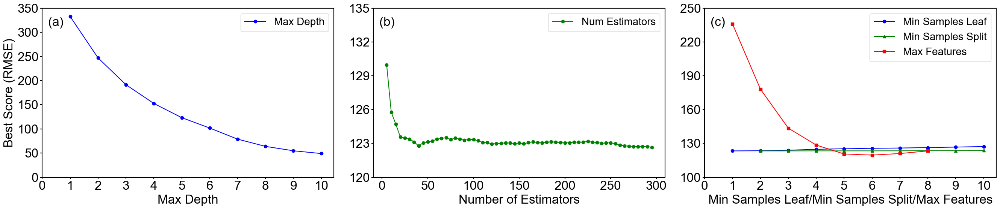

In [4]:
# -*- coding: utf-8 -*-
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
# 设置字体为 Times New Roman
plt.rcParams["font.family"] = "Arial"
#plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# 读取数据
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')

rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 11)) 

for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    site_row = np.size(site, 0) 
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # list转为dataframe
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 11))
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200  # 计算累计*(depth-3.1)
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k-1, 2:11]  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))

err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:9]  # 输入特征
y = -err.iloc[:, 0]  # 目标变量
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)  # 30%为测试集，则70%为训练集

# 创建1行3列子图
fig, axes = plt.subplots(1, 3, figsize=(27, 6))  # 宽一些

# ===== 第一个子图：max_depth =====
param_grid = {'max_depth': np.arange(1, 11)}
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)
results = grid_search.cv_results_
best_scores = np.sqrt(-results['mean_test_score'])
max_depths = results['param_max_depth'].data

axes[0].plot(max_depths, best_scores, marker='o', linestyle='-', color='blue', label='Max Depth')
axes[0].set_xlabel('Max Depth')
axes[0].set_ylabel('Best Score (RMSE)')
#axes[0].set_title('(a)')
axes[0].legend()
axes[0].set_xticks(np.arange(0, 11, 1))
axes[0].text(0.02, 0.95, '(a)', transform=axes[0].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[0].set_yticks(np.linspace(0, 350, 8))
axes[0].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')

# ===== 第二个子图：n_estimators =====
param_grid = {'n_estimators': np.arange(5, 300, 5), 'max_depth': [5]}
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)
results = grid_search.cv_results_
best_scores = np.sqrt(-results['mean_test_score'])
n_estimators = results['param_n_estimators'].data

axes[1].plot(n_estimators, best_scores, marker='o', linestyle='-', color='green', label='Num Estimators')
axes[1].set_xlabel('Number of Estimators')
#axes[1].set_ylabel('Best Score (RMSE)')
#axes[1].set_title('(b)')
axes[1].legend()
axes[1].text(0.02, 0.95, '(b)', transform=axes[1].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[1].set_xticks(np.arange(0, 350, 50))
axes[1].set_yticks(np.linspace(120, 135, 6))
axes[1].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# ===== 第三个子图：min_samples_leaf / split / max_features =====
param_grid1 = {'min_samples_leaf': np.arange(1, 11), 'max_depth': [5]}
rf1 = RandomForestRegressor(random_state=42)
grid_search1 = GridSearchCV(estimator=rf1, param_grid=param_grid1, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search1.fit(x_train, y_train)
results1 = grid_search1.cv_results_
best_scores1 = np.sqrt(-results1['mean_test_score'])
min_samples_leaf = results1['param_min_samples_leaf'].data

param_grid2 = {'min_samples_split': np.arange(2, 11), 'max_depth': [5]}
rf2 = RandomForestRegressor(random_state=42)
grid_search2 = GridSearchCV(estimator=rf2, param_grid=param_grid2, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search2.fit(x_train, y_train)
results2 = grid_search2.cv_results_
best_scores2 = np.sqrt(-results2['mean_test_score'])
min_samples_split = results2['param_min_samples_split'].data

param_grid3 = {'max_features': np.arange(1, 9), 'max_depth': [5]}
rf3 = RandomForestRegressor(random_state=42)
grid_search3 = GridSearchCV(estimator=rf3, param_grid=param_grid3, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search3.fit(x_train, y_train)
results3 = grid_search3.cv_results_
best_scores3 = np.sqrt(-results3['mean_test_score'])
max_features = results3['param_max_features'].data

axes[2].plot(min_samples_leaf, best_scores1, marker='o', linestyle='-', color='blue', label='Min Samples Leaf')
axes[2].plot(min_samples_split, best_scores2, marker='^', linestyle='-', color='green', label='Min Samples Split')
axes[2].plot(max_features, best_scores3, marker='s', linestyle='-', color='red', label='Max Features')
axes[2].set_xlabel('Min Samples Leaf/Min Samples Split/Max Features')#Parameter Value:
#axes[2].set_ylabel('Best Score (RMSE)')
#axes[2].set_title('(c)')
axes[2].legend()
axes[2].set_xticks(np.arange(0, 11, 1))
axes[2].text(0.02, 0.95, '(c)', transform=axes[2].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[2].set_yticks(np.linspace(100, 250, 6))
axes[2].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# ===== 自动调整布局 =====
plt.tight_layout()
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\forest_grid2D_lonlat72.png', dpi=300, bbox_inches='tight')
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\forest_grid2D_lonlat72.svg', format='svg')
plt.show()

## 2.2 24个站点+withoutroot

C:\Users\Administrator\AppData\Local\Temp\ipykernel_25036\3045153088.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.rename(columns=new_feature_names, inplace=True)


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Fitting 10 folds for each of 59 candidates, totalling 590 fits
Fitting 10 folds for each of 10 candidates, totalling 100 fits
Fitting 10 folds for each of 9 candidates, totalling 90 fits
Fitting 10 folds for each of 8 candidates, totalling 80 fits


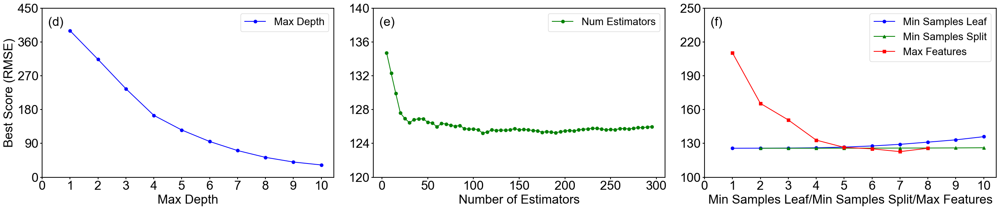

In [5]:
# -*- coding: utf-8 -*-
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
# 设置字体为 Times New Roman
plt.rcParams["font.family"] = "Arial"
#plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# 读取数据
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = -err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#2:'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)  # 30%为测试集，则70%为训练集

# 创建1行3列子图
fig, axes = plt.subplots(1, 3, figsize=(27, 6))  # 宽一些

# ===== 第一个子图：max_depth =====
param_grid = {'max_depth': np.arange(1, 11)}
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)
results = grid_search.cv_results_
best_scores = np.sqrt(-results['mean_test_score'])
max_depths = results['param_max_depth'].data

axes[0].plot(max_depths, best_scores, marker='o', linestyle='-', color='blue', label='Max Depth')
axes[0].set_xlabel('Max Depth')
axes[0].set_ylabel('Best Score (RMSE)')
#axes[0].set_title('(a)')
axes[0].legend()
axes[0].set_xticks(np.arange(0, 11, 1))
axes[0].text(0.02, 0.95, '(d)', transform=axes[0].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[0].set_yticks(np.linspace(0, 450, 6))
axes[0].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')

# ===== 第二个子图：n_estimators =====
param_grid = {'n_estimators': np.arange(5, 300, 5), 'max_depth': [5]}
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)
results = grid_search.cv_results_
best_scores = np.sqrt(-results['mean_test_score'])
n_estimators = results['param_n_estimators'].data

axes[1].plot(n_estimators, best_scores, marker='o', linestyle='-', color='green', label='Num Estimators')
axes[1].set_xlabel('Number of Estimators')
#axes[1].set_ylabel('Best Score (RMSE)')
#axes[1].set_title('(b)')
axes[1].legend()
axes[1].text(0.02, 0.95, '(e)', transform=axes[1].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[1].set_xticks(np.arange(0, 350, 50))
axes[1].set_yticks(np.linspace(120, 140, 6))
axes[1].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# ===== 第三个子图：min_samples_leaf / split / max_features =====
param_grid1 = {'min_samples_leaf': np.arange(1, 11), 'max_depth': [5]}
rf1 = RandomForestRegressor(random_state=42)
grid_search1 = GridSearchCV(estimator=rf1, param_grid=param_grid1, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search1.fit(x_train, y_train)
results1 = grid_search1.cv_results_
best_scores1 = np.sqrt(-results1['mean_test_score'])
min_samples_leaf = results1['param_min_samples_leaf'].data

param_grid2 = {'min_samples_split': np.arange(2, 11), 'max_depth': [5]}
rf2 = RandomForestRegressor(random_state=42)
grid_search2 = GridSearchCV(estimator=rf2, param_grid=param_grid2, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search2.fit(x_train, y_train)
results2 = grid_search2.cv_results_
best_scores2 = np.sqrt(-results2['mean_test_score'])
min_samples_split = results2['param_min_samples_split'].data

param_grid3 = {'max_features': np.arange(1, 9), 'max_depth': [5]}
rf3 = RandomForestRegressor(random_state=42)
grid_search3 = GridSearchCV(estimator=rf3, param_grid=param_grid3, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search3.fit(x_train, y_train)
results3 = grid_search3.cv_results_
best_scores3 = np.sqrt(-results3['mean_test_score'])
max_features = results3['param_max_features'].data

axes[2].plot(min_samples_leaf, best_scores1, marker='o', linestyle='-', color='blue', label='Min Samples Leaf')
axes[2].plot(min_samples_split, best_scores2, marker='^', linestyle='-', color='green', label='Min Samples Split')
axes[2].plot(max_features, best_scores3, marker='s', linestyle='-', color='red', label='Max Features')
axes[2].set_xlabel('Min Samples Leaf/Min Samples Split/Max Features')#Parameter Value:
#axes[2].set_ylabel('Best Score (RMSE)')
#axes[2].set_title('(c)')
axes[2].legend()
axes[2].set_xticks(np.arange(0, 11, 1))
axes[2].text(0.02, 0.95, '(f)', transform=axes[2].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[2].set_yticks(np.linspace(100, 250, 6))
axes[2].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# ===== 自动调整布局 =====
plt.tight_layout()
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\forest_grid2D_lonlat24_withoutroot.png', dpi=300, bbox_inches='tight')
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\forest_grid2D_lonlat24_withoutroot.svg', format='svg',bbox_inches='tight')
plt.show()

## 2.3 24个站点+withroot

C:\Users\Administrator\AppData\Local\Temp\ipykernel_25036\3851909204.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.rename(columns=new_feature_names, inplace=True)


Fitting 10 folds for each of 10 candidates, totalling 100 fits
Fitting 10 folds for each of 59 candidates, totalling 590 fits
Fitting 10 folds for each of 10 candidates, totalling 100 fits
Fitting 10 folds for each of 9 candidates, totalling 90 fits
Fitting 10 folds for each of 8 candidates, totalling 80 fits


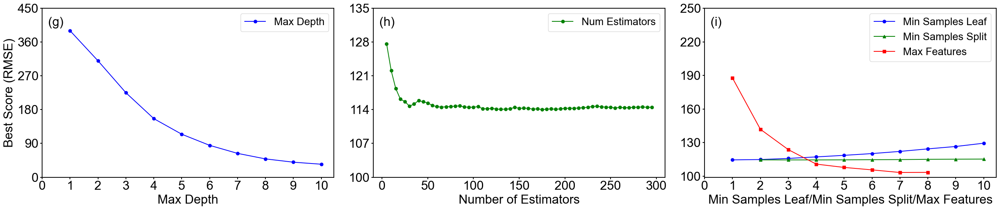

In [6]:
# -*- coding: utf-8 -*-
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
# 设置字体为 Times New Roman
plt.rcParams["font.family"] = "Arial"
#plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# 读取数据
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = -err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#2:'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)','RDWD','FRLD','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)  # 30%为测试集，则70%为训练集

# 创建1行3列子图
fig, axes = plt.subplots(1, 3, figsize=(27, 6))  # 宽一些

# ===== 第一个子图：max_depth =====
param_grid = {'max_depth': np.arange(1, 11)}
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)
results = grid_search.cv_results_
best_scores = np.sqrt(-results['mean_test_score'])
max_depths = results['param_max_depth'].data

axes[0].plot(max_depths, best_scores, marker='o', linestyle='-', color='blue', label='Max Depth')
axes[0].set_xlabel('Max Depth')
axes[0].set_ylabel('Best Score (RMSE)')
#axes[0].set_title('(a)')
axes[0].legend()
axes[0].set_xticks(np.arange(0, 11, 1))
axes[0].text(0.02, 0.95, '(g)', transform=axes[0].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[0].set_yticks(np.linspace(0, 450, 6))
axes[0].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')

# ===== 第二个子图：n_estimators =====
param_grid = {'n_estimators': np.arange(5, 300, 5), 'max_depth': [5]}
rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search.fit(x_train, y_train)
results = grid_search.cv_results_
best_scores = np.sqrt(-results['mean_test_score'])
n_estimators = results['param_n_estimators'].data

axes[1].plot(n_estimators, best_scores, marker='o', linestyle='-', color='green', label='Num Estimators')
axes[1].set_xlabel('Number of Estimators')
#axes[1].set_ylabel('Best Score (RMSE)')
#axes[1].set_title('(b)')
axes[1].legend()
axes[1].text(0.02, 0.95, '(h)', transform=axes[1].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[1].set_xticks(np.arange(0, 350, 50))
axes[1].set_yticks(np.linspace(100, 135, 6))
axes[1].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# ===== 第三个子图：min_samples_leaf / split / max_features =====
param_grid1 = {'min_samples_leaf': np.arange(1, 11), 'max_depth': [5]}
rf1 = RandomForestRegressor(random_state=42)
grid_search1 = GridSearchCV(estimator=rf1, param_grid=param_grid1, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search1.fit(x_train, y_train)
results1 = grid_search1.cv_results_
best_scores1 = np.sqrt(-results1['mean_test_score'])
min_samples_leaf = results1['param_min_samples_leaf'].data

param_grid2 = {'min_samples_split': np.arange(2, 11), 'max_depth': [5]}
rf2 = RandomForestRegressor(random_state=42)
grid_search2 = GridSearchCV(estimator=rf2, param_grid=param_grid2, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search2.fit(x_train, y_train)
results2 = grid_search2.cv_results_
best_scores2 = np.sqrt(-results2['mean_test_score'])
min_samples_split = results2['param_min_samples_split'].data

param_grid3 = {'max_features': np.arange(1, 9), 'max_depth': [5]}
rf3 = RandomForestRegressor(random_state=42)
grid_search3 = GridSearchCV(estimator=rf3, param_grid=param_grid3, cv=10, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')
grid_search3.fit(x_train, y_train)
results3 = grid_search3.cv_results_
best_scores3 = np.sqrt(-results3['mean_test_score'])
max_features = results3['param_max_features'].data

axes[2].plot(min_samples_leaf, best_scores1, marker='o', linestyle='-', color='blue', label='Min Samples Leaf')
axes[2].plot(min_samples_split, best_scores2, marker='^', linestyle='-', color='green', label='Min Samples Split')
axes[2].plot(max_features, best_scores3, marker='s', linestyle='-', color='red', label='Max Features')
axes[2].set_xlabel('Min Samples Leaf/Min Samples Split/Max Features')#Parameter Value:
#axes[2].set_ylabel('Best Score (RMSE)')
#axes[2].set_title('(c)')
axes[2].legend()
axes[2].set_xticks(np.arange(0, 11, 1))
axes[2].text(0.02, 0.95, '(i)', transform=axes[2].transAxes, fontsize=24, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
axes[2].set_yticks(np.linspace(100, 250, 6))
axes[2].tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# ===== 自动调整布局 =====
plt.tight_layout()
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\forest_grid2D_lonlat24_withroot.png', dpi=300, bbox_inches='tight')
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\forest_grid2D_lonlat24_withroot.svg', format='svg')
plt.show()

# *整体准确度

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn import tree
from scipy.stats import randint
from sklearn.inspection import PartialDependenceDisplay
from sklearn.tree import export_graphviz
import seaborn as sns  # 导入 seaborn 库用于绘制密度图
# Set default font to Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

rawdata = r'C:\Users\Administrator\Desktop\AFM\data\data.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\data\data2.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err=np.empty((0, 11)) 
for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    site_row = np.size(site, 0) 
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # list转为dataframe
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 11))
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200  # 计算累计*(depth-3.1)
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k-1, 2:11]  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C=err.drop_duplicates()
x = err.iloc[:,1:11] #输入特征
y = err.iloc[:,0]  #目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'Precipitation(mm)',
    3: 'Potential evapotranspiration(mm)',
    4: 'Clay(%)',
    5: 'Sand(%)',
    6: 'Silt(%)',
    7: 'Trees age(year)',
    8: 'Trees species',
    9:'Longitude',
    10:'Latitude'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)

# 分割数据集为训练集和测试集
x = x[['Depth(m)', 'Precipitation(mm)', 'Potential evapotranspiration(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)', 'Trees age(year)', 'Trees species']]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)  # 30%为测试集，则70%为训练集

##
rfr = RandomForestRegressor(random_state=42, n_estimators=60, max_features=4, min_samples_leaf=1, min_samples_split=2, max_depth=5)  # n_estimators=250,max_features=2,min_samples_leaf=1,min_samples_split=2,max_depth=7
rfr.fit(x_train, y_train)  # 使用训练数据集训练随机森林模型

# 在测试集上评估最佳模型

# 这里可以使用你想要的性能指标来输出最终的性能————训练集
y_train_pred = rfr.predict(x_train)

# 计算和输出训练集的性能指标
mse_train = mean_squared_error(y_train, y_train_pred)
print(f"Mean Squared Error on Training Set: {mse_train}")
mae_train = mean_absolute_error(y_train, y_train_pred)
print(f"Mean Absolute Error on Training Set: {mae_train}")
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
print(f"Root Mean Squared Error on Training Set: {rmse_train}")
r2_train = r2_score(y_train, y_train_pred)
print(f"R² on Training Set: {r2_train}")

# 这里可以使用你想要的性能指标来输出最终的性能————测试集
y_pred = rfr.predict(x_test)
# 计算和输出测试集的性能指标
mse_test = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error on Test Set: {mse_test}")
# 评估回归性能
mae_test = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))
importances = rfr.feature_importances_  # 计算特征重要性
print("Importances:", importances)
r2_test = r2_score(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("R²:", r2)
##
def plot_scatter(y_true, y_pred, mae, rmse, r2, title, mse, transpose=False):
    plt.figure(figsize=(10, 6))
    if transpose:
        plt.gca().invert_xaxis()  # 反转x轴
        plt.gca().invert_yaxis()  # 反转y轴
    scatter = plt.scatter(y_true, y_pred, c=y_pred, cmap='rainbow', alpha=0.7, label='Original samples')
   # plt.colorbar(scatter, label='Predicted Value')
    plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], linestyle='--', color='black', label='1:1 line')
    z = np.polyfit(y_true, y_pred, 1)
    p = np.poly1d(z)
    plt.plot(y_true, p(y_true), "r--", label='Fitted line')
    # 构建线性方程的字符串
    equation = f'y = {z[0]:.3f}x + {z[1]:.3f}'
    # 使用 fontdict 参数设置字体为 Times New Roman
    font = {'family': 'Times New Roman', 'size': 15}
    plt.text(0.60, 0.05, f'MAE = {mae:.3f}\nMSE={mse:.3f}\nRMSE = {rmse:.3f}\nR² = {r2:.3f}\n{equation}', 
             transform=plt.gca().transAxes, fontdict=font, verticalalignment='bottom')
    plt.title(title)
    plt.xlabel('Observed SWSD (mm)')
    plt.ylabel('Predicted SWSD (mm)')
    plt.grid(False)  # 关闭格网
    #plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)

# 创建图表并绘制训练集散点图
plt.figure(figsize=(18, 10))
#plot_scatter(y_train, y_train_pred, mae_train, rmse_train, r2_train, 'Training Set', 131, mse_train, transpose=False)

# 绘制测试集散点图
plot_scatter(y_test, y_pred, mae_test, rmse_test, r2_test, 'Test Set',mse_test, transpose=False)

plt.tight_layout()
plt.show()


##dentisity
plt.rcParams['font.family'] = 'Times New Roman'
plt.figure(figsize=(10, 6))
sns.kdeplot(y_test, bw_adjust=0.5, fill=True, label='SWSD_test')
sns.kdeplot(y_pred, bw_adjust=0.5, fill=True, label='SWSD_pred')
plt.xlabel('SWSD values')
plt.ylabel('Density')
plt.title('Density Plot of SWSD_test and SWSD_pred')
plt.legend()
plt.show()

# 3. 比例图

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
import time
# 设置字体为 Times New Roman
plt.rcParams["font.family"] = "Arial"
#plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20

# 读取数据
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')

rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 11)) 

for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    site_row = np.size(site, 0) 
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # list转为dataframe
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 11))
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200  # 计算累计*(depth-3.1)
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k-1, 2:11]  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))

err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:9]  # 输入特征
y = -err.iloc[:, 0]  # 目标变量

# 结果列表
results = []

# 外层循环 test_size
for test_size in np.arange(0.01, 0.995, 0.01):
    temp_mse_train = []
    temp_rmse_train = []
    temp_r2_train = []
    temp_mse_test = []
    temp_rmse_test = []
    temp_r2_test = []
    temp_run_time = []

    for repeat in range(100):
        start_time = time.time()

        x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=test_size)

        model = RandomForestRegressor(random_state=42, n_estimators=60, max_features=4, min_samples_leaf=1, min_samples_split=2, max_depth=5)
        model.fit(x_train, y_train)

        y_train_pred = model.predict(x_train)
        y_test_pred = model.predict(x_test)

        mse_train = mean_squared_error(y_train, y_train_pred)
        rmse_train = np.sqrt(mse_train)
        r2_train = r2_score(y_train, y_train_pred)

        mse_test = mean_squared_error(y_test, y_test_pred)
        rmse_test = np.sqrt(mse_test)
        r2_test = r2_score(y_test, y_test_pred)

        end_time = time.time()
        run_time = end_time - start_time

        temp_mse_train.append(mse_train)
        temp_rmse_train.append(rmse_train)
        temp_r2_train.append(r2_train)
        temp_mse_test.append(mse_test)
        temp_rmse_test.append(rmse_test)
        temp_r2_test.append(r2_test)
        temp_run_time.append(run_time)

    # 计算均值和标准差
    results.append([
        test_size,
        np.mean(temp_mse_train), np.std(temp_mse_train),
        np.mean(temp_rmse_train), np.std(temp_rmse_train),
        np.mean(temp_r2_train), np.std(temp_r2_train),
        np.mean(temp_mse_test), np.std(temp_mse_test),
        np.mean(temp_rmse_test), np.std(temp_rmse_test),
        np.mean(temp_r2_test), np.std(temp_r2_test),
        np.mean(temp_run_time), np.std(temp_run_time),
        len(y_train), len(y_test)
    ])

# 转换为DataFrame
columns = [
    'test_size',
    'mse_train_mean', 'mse_train_std',
    'rmse_train_mean', 'rmse_train_std',
    'r2_train_mean', 'r2_train_std',
    'mse_test_mean', 'mse_test_std',
    'rmse_test_mean', 'rmse_test_std',
    'r2_test_mean', 'r2_test_std',
    'run_time_mean', 'run_time_std',
    'y_train_size', 'y_test_size'
]

results_df = pd.DataFrame(results, columns=columns)

# 保存
results_df.to_excel(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model_performance100runs_lonlat.xlsx', index=False)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import FuncFormatter

# ===== 读取数据 =====
df = pd.read_excel(r"C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model_performance100runs_lonlat.xlsx")
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
x = (1 - df["test_size"].to_numpy())

# ---- Train/Test 指标 ----
train_rmse_mean = df["rmse_train_mean"].to_numpy()
train_rmse_std  = df["rmse_train_std"].to_numpy()
train_r2_mean   = df["r2_train_mean"].to_numpy()
train_r2_std    = df["r2_train_std"].to_numpy()
train_size_val  = df["y_train_size"].to_numpy()

test_rmse_mean = df["rmse_test_mean"].to_numpy()
test_rmse_std  = df["rmse_test_std"].to_numpy()
test_r2_mean   = df["r2_test_mean"].to_numpy()
test_r2_std    = df["r2_test_std"].to_numpy()
test_size_val  = df["y_test_size"].to_numpy()

run_time_mean = df["run_time_mean"].to_numpy()
run_time_std  = df["run_time_std"].to_numpy()

# ===== 坐标范围 =====
r2_min = min(train_r2_mean.min() - 0.08, test_r2_mean.min() - 0.08)
r2_max = max(train_r2_mean.max() + 0.016, test_r2_mean.max() + 0.016)

rmse_min = min(train_rmse_mean.min() - 18, test_rmse_mean.min() - 18)
rmse_max = max(train_rmse_mean.max() + 40, test_rmse_mean.max() + 40)

runtime_min = (run_time_mean - run_time_std).min() - 0.04
runtime_max = (run_time_mean + run_time_std).max() + 0.04

size_min, size_max = 0, 3500

# ===== 刻度格式器（避免 set_yticklabels 破坏颜色）=====
fmt_sig2 = FuncFormatter(lambda v, pos: f"{v:.2g}")

# ===== 辅助函数 =====
def style_main_axis(ax, xlabel="Training set size", xlim=(0,1), y_color='black',
                    y_label=None, y_ticks=None, y_lim=None):
    """主轴样式（左轴）"""
    if y_label:
        ax.set_ylabel(y_label, color=y_color)#, fontsize=24
    # 用 colors=... 同时统一刻度线与标签的颜色
    ax.tick_params(axis='y', colors=y_color, width=2)#, labelsize=24
    ax.set_xlim(list(xlim))
    if y_lim is not None:
        ax.set_ylim(list(y_lim))
    if y_ticks is not None:
        ax.set_yticks(y_ticks)
    ax.set_xlabel(xlabel)#, fontsize=24
    ax.tick_params(axis='x')#, labelsize=24
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)

def make_axes_pair(ax, left_series, left_std, left_color, left_label, left_ylim, left_yticks,
                   right_series, right_std, right_color, right_label, right_ylim, right_yticks,
                   x, left_is_fill=True, right_is_fill=True, left_formatter=None, right_formatter=None):
    """在给定的 ax 上，构造左右两个坐标轴并完成绘制。"""
    # 左轴
    style_main_axis(ax,
                    y_color=left_color,
                    y_label=left_label,
                    y_ticks=left_yticks,
                    y_lim=left_ylim)
    ax.plot(x, left_series, color=left_color, label=left_label)
    if left_is_fill and left_std is not None:
        ax.fill_between(x, left_series - left_std, left_series + left_std, color=left_color, alpha=0.2)
    if left_formatter is not None:
        ax.yaxis.set_major_formatter(left_formatter)

    # 右轴
    ax_r = ax.twinx()
    ax_r.spines["right"].set_color(right_color)
    ax_r.spines['right'].set_linewidth(2)
    ax_r.spines['left'].set_visible(False)
    ax_r.spines['top'].set_visible(False)
    ax_r.spines['bottom'].set_visible(False)

    ax_r.plot(x, right_series, color=right_color, label=right_label)
    if right_is_fill and right_std is not None:
        ax_r.fill_between(x, right_series - right_std, right_series + right_std, color=right_color, alpha=0.2)
    ax_r.set_ylabel(right_label, color=right_color)#, fontsize=24
    # 同样用 colors=... 统一颜色
    ax_r.tick_params(axis='y', colors=right_color,  width=2)#labelsize=24,
    ax_r.set_ylim(list(right_ylim))
    ax_r.set_yticks(right_yticks)
    if right_formatter is not None:
        ax_r.yaxis.set_major_formatter(right_formatter)

    # 合并图例
    lines, labels = [], []
    for sub_ax in (ax, ax_r):
        l, lab = sub_ax.get_legend_handles_labels()
        lines.extend(l); labels.extend(lab)
    ax.legend(lines, labels, loc='upper left', bbox_to_anchor=(0.50, 0.55))#, fontsize=16

    return ax, ax_r

# =========================
# 单一画布：2x2 子图
# =========================
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Row 1: Set size（左轴，黑） + Run time（右轴，绿）
make_axes_pair(
    axes[0, 0],
    left_series=train_size_val, left_std=None, left_color='black',
    left_label="Train set size", left_ylim=(size_min, size_max),
    left_yticks=np.linspace(size_min, size_max, 6),
    right_series=run_time_mean, right_std=run_time_std, right_color='green',
    right_label="Run time (s)", right_ylim=(runtime_min, runtime_max),
    right_yticks=np.linspace(runtime_min, runtime_max, 6),
    x=x,
    left_is_fill=False, right_is_fill=True,
    left_formatter=None, right_formatter=fmt_sig2
)

make_axes_pair(
    axes[0, 1],
    left_series=test_size_val, left_std=None, left_color='black',
    left_label="Test set size", left_ylim=(size_min, size_max),
    left_yticks=np.linspace(size_min, size_max, 6),
    right_series=run_time_mean, right_std=run_time_std, right_color='green',
    right_label="Run time (s)", right_ylim=(runtime_min, runtime_max),
    right_yticks=np.linspace(runtime_min, runtime_max, 6),
    x=x,
    left_is_fill=False, right_is_fill=True,
    left_formatter=None, right_formatter=fmt_sig2
)

# Row 2: R²（左轴，红） + RMSE（右轴，蓝）
make_axes_pair(
    axes[1, 0],
    left_series=train_r2_mean, left_std=train_r2_std, left_color='black',
    left_label="Train R²", left_ylim=(0.65, 1.00),
    left_yticks=np.linspace(0.65, 1.00, 6),
    right_series=train_rmse_mean, right_std=train_rmse_std, right_color='blue',
    right_label="Train RMSE", right_ylim=(rmse_min, rmse_max),
    right_yticks=np.linspace(rmse_min, rmse_max, 6),
    x=x,
    left_is_fill=True, right_is_fill=True,
    left_formatter=fmt_sig2, right_formatter=None
)

make_axes_pair(
    axes[1, 1],
    left_series=test_r2_mean, left_std=test_r2_std, left_color='black',
    left_label="Test R²", left_ylim=(0.65, 1.00),
    left_yticks=np.linspace(0.65, 1.00, 6),
    right_series=test_rmse_mean, right_std=test_rmse_std, right_color='blue',
    right_label="Test RMSE", right_ylim=(rmse_min, rmse_max),
    right_yticks=np.linspace(rmse_min, rmse_max, 6),
    x=x,
    left_is_fill=True, right_is_fill=True,
    left_formatter=fmt_sig2, right_formatter=None
)

# 子图标签
fig.text(0.1, 0.92, "(a)", ha='left', va='top', fontname='Arial',fontsize=24)
fig.text(0.6, 0.92, "(b)", ha='left', va='top', fontname='Arial',fontsize=24)#
fig.text(0.1, 0.44, "(c)", ha='left', va='top', fontname='Arial',fontsize=24)#
fig.text(0.6, 0.44, "(d)", ha='left', va='top', fontname='Arial',fontsize=24)#

plt.tight_layout(rect=(0, 0, 1, 0.96), h_pad=2.0, w_pad=2.5)
#plt.savefig(r"C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\combined_metrics.png", dpi=300)
plt.savefig(r"C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\combined_metrics.svg", format='svg')
plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import FuncFormatter

# ===== 读取数据 =====
df = pd.read_excel(r"C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model_performance100runs_lonlat.xlsx")
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5
plt.rcParams["xtick.major.width"] = 1.5
plt.rcParams["ytick.major.width"] = 1.5

x = (1 - df["test_size"].to_numpy())

# ---- 指标数据 ----
test_r2_mean = df["r2_test_mean"].to_numpy()
test_r2_std = df["r2_test_std"].to_numpy()
test_rmse_mean = df["rmse_test_mean"].to_numpy()
test_rmse_std = df["rmse_test_std"].to_numpy()
run_time_mean = df["run_time_mean"].to_numpy()
run_time_std = df["run_time_std"].to_numpy()

# ===== 坐标范围 =====
r2_min, r2_max = 0.65, 1.00
rmse_min, rmse_max = 80, 310
runtime_min, runtime_max = 0, 0.10
size_min, size_max = 0, 3500

# ===== 刻度格式器 =====
fmt_sig2 = FuncFormatter(lambda v, pos: f"{v:.2g}")

# 创建画布：1行2列
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# =========================
# 子图 (a): 只显示 Run time（绿色）在左侧，隐藏左轴，绿色轴左移
# =========================
ax0 = axes[0]

# 直接绘制 run time
ax0.plot(x, run_time_mean, color='green', label="Run time (s)")
ax0.fill_between(x, run_time_mean - run_time_std, run_time_mean + run_time_std,
                 color='green', alpha=0.2)

# 设置 y 轴（绿色）
ax0.set_ylabel("Run time (s)", color='green')
ax0.tick_params(axis='y', colors='green', width=2)
ax0.set_ylim(runtime_min, runtime_max)
ax0.set_yticks(np.linspace(runtime_min, runtime_max, 6))
ax0.yaxis.set_major_formatter(fmt_sig2)

# x 轴
ax0.set_xlabel("Training set size")
ax0.set_xlim(0, 1)

# 设置边框线
ax0.spines['left'].set_color('green')
ax0.spines['left'].set_linewidth(2)
ax0.spines['bottom'].set_linewidth(2)
ax0.spines['top'].set_linewidth(2)
ax0.spines['right'].set_visible(2)

# 图例
ax0.legend(loc='upper left', bbox_to_anchor=(0.30, 0.99))


# =========================
# 子图 (b): R² (左黑) + RMSE (右蓝)
# =========================
ax1 = axes[1]

# ---- 左轴：R² ----
ax1.plot(x, test_r2_mean, color='black', label="R²")
ax1.fill_between(x, test_r2_mean - test_r2_std, test_r2_mean + test_r2_std,
                 color='black', alpha=0.2)
ax1.set_xlabel("Training set size")
ax1.set_ylabel("R²", color='black')
ax1.tick_params(axis='y', colors='black', width=2)
ax1.set_ylim(r2_min, r2_max)
ax1.set_yticks(np.linspace(r2_min, r2_max, 6))
ax1.yaxis.set_major_formatter(fmt_sig2)
ax1.set_xlim(0, 1)
ax1.spines['left'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['top'].set_linewidth(2)
ax1.spines['right'].set_visible(2)

# ---- 右轴：RMSE ----
ax1_r = ax1.twinx()
ax1_r.plot(x, test_rmse_mean, color='blue', label="RMSE")
ax1_r.fill_between(x, test_rmse_mean - test_rmse_std, test_rmse_mean + test_rmse_std,
                   color='blue', alpha=0.2)
ax1_r.set_ylabel("RMSE", color='blue')
ax1_r.tick_params(axis='y', colors='blue', width=2)
ax1_r.set_ylim(rmse_min, rmse_max)
ax1_r.set_yticks(np.linspace(rmse_min, rmse_max, 6))
ax1_r.spines["right"].set_color('blue')
ax1_r.spines['right'].set_linewidth(2)

# ---- 合并图例 ----
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax1_r.get_legend_handles_labels()
#ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left', bbox_to_anchor=(0.50, 0.50))
ax1.legend(lines1 + lines2, labels1 + labels2,
           loc='upper center',        # 改为上中部，更适合横排
           bbox_to_anchor=(0.6, 0.99), # 调整位置，避免遮挡数据
           ncol=2,                    # 关键：2 列横排（R² 和 RMSE 并列）
           frameon=True)              # 可选：是否显示边框
#           fontsize=20)
# =========================
# 子图标签 (a), (b)
# =========================
fig.text(0.09, 0.88, "(a)", ha='left', va='top', fontname='Arial', fontsize=24)
fig.text(0.57, 0.88, "(b)", ha='left', va='top', fontname='Arial', fontsize=24)

# =========================
# 布局与保存
# =========================
plt.tight_layout(rect=(0, 0, 1, 0.96), h_pad=2.0, w_pad=2.5)
plt.savefig(r"C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\combined_metrics.svg", format='svg', dpi=300)
plt.show()

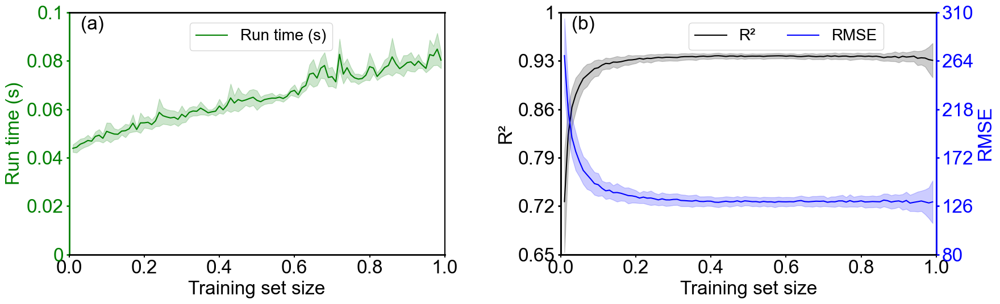

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import FuncFormatter

# ===== 读取数据 =====
df = pd.read_excel(r"C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model_performance100runs_lonlat.xlsx")
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5

x = (1 - df["test_size"].to_numpy())

# ---- 指标数据 ----
test_r2_mean = df["r2_test_mean"].to_numpy()
test_r2_std = df["r2_test_std"].to_numpy()
test_rmse_mean = df["rmse_test_mean"].to_numpy()
test_rmse_std = df["rmse_test_std"].to_numpy()
run_time_mean = df["run_time_mean"].to_numpy()
run_time_std = df["run_time_std"].to_numpy()

# ===== 坐标范围 =====
r2_min, r2_max = 0.65, 1.00
rmse_min, rmse_max = 80, 310
runtime_min, runtime_max = 0, 0.10
size_min, size_max = 0, 3500

# ===== 刻度格式器 =====
fmt_sig2 = FuncFormatter(lambda v, pos: f"{v:.2g}")

# 创建画布：1行2列
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# =========================
# 子图 (a): 只显示 Run time（绿色）在左侧，隐藏左轴，绿色轴左移
# =========================
ax0 = axes[0]

# 直接绘制 run time
ax0.plot(x, run_time_mean, color='green', label="Run time (s)")
ax0.fill_between(x, run_time_mean - run_time_std, run_time_mean + run_time_std,
                 color='green', alpha=0.2)

# 设置 y 轴（绿色）
ax0.set_ylabel("Run time (s)", color='green')
ax0.tick_params(axis='y', colors='green', width=2)
ax0.set_ylim(runtime_min, runtime_max)
ax0.set_yticks(np.linspace(runtime_min, runtime_max, 6))
ax0.yaxis.set_major_formatter(fmt_sig2)

# x 轴
ax0.set_xlabel("Training set size")
ax0.set_xlim(0, 1)

# 设置边框线
ax0.spines['left'].set_color('green')
ax0.spines['left'].set_linewidth(2)
ax0.spines['bottom'].set_linewidth(2)
ax0.spines['top'].set_linewidth(2)
ax0.spines['right'].set_visible(2)

# 图例
ax0.legend(loc='upper left', bbox_to_anchor=(0.30, 0.99))


# =========================
# 子图 (b): R² (左黑) + RMSE (右蓝)
# =========================
ax1 = axes[1]

# ---- 左轴：R² ----
ax1.plot(x, test_r2_mean, color='black', label="R²")
ax1.fill_between(x, test_r2_mean - test_r2_std, test_r2_mean + test_r2_std,
                 color='black', alpha=0.2)
ax1.set_xlabel("Training set size")
ax1.set_ylabel("R²", color='black')
ax1.tick_params(axis='y', colors='black', width=2)
ax1.set_ylim(r2_min, r2_max)
ax1.set_yticks(np.linspace(r2_min, r2_max, 6))
ax1.yaxis.set_major_formatter(fmt_sig2)
ax1.set_xlim(0, 1)
ax1.spines['left'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['top'].set_linewidth(2)
ax1.spines['right'].set_visible(2)

# ---- 右轴：RMSE ----
ax1_r = ax1.twinx()
ax1_r.plot(x, test_rmse_mean, color='blue', label="RMSE")
ax1_r.fill_between(x, test_rmse_mean - test_rmse_std, test_rmse_mean + test_rmse_std,
                   color='blue', alpha=0.2)
ax1_r.set_ylabel("RMSE", color='blue')
ax1_r.tick_params(axis='y', colors='blue', width=2)
ax1_r.set_ylim(rmse_min, rmse_max)
ax1_r.set_yticks(np.linspace(rmse_min, rmse_max, 6))
ax1_r.spines["right"].set_color('blue')
ax1_r.spines['right'].set_linewidth(2)

# ---- 合并图例 ----
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax1_r.get_legend_handles_labels()
#ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left', bbox_to_anchor=(0.50, 0.50))
ax1.legend(lines1 + lines2, labels1 + labels2,
           loc='upper center',        # 改为上中部，更适合横排
           bbox_to_anchor=(0.6, 0.99), # 调整位置，避免遮挡数据
           ncol=2,                    # 关键：2 列横排（R² 和 RMSE 并列）
           frameon=True)              # 可选：是否显示边框
#           fontsize=20)
# =========================
# 子图标签 (a), (b)
# =========================
fig.text(0.09, 0.88, "(a)", ha='left', va='top', fontname='Arial', fontsize=24)
fig.text(0.57, 0.88, "(b)", ha='left', va='top', fontname='Arial', fontsize=24)

# =========================
# 布局与保存
# =========================
plt.tight_layout(rect=(0, 0, 1, 0.96), h_pad=2.0, w_pad=2.5)
plt.savefig(r"C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\combined_metrics.svg", format='svg', dpi=300)
plt.show()

# 4.密度图

## 4.1 72个站点

### *尝试

In [ ]:
# 绘制表格
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn import tree
from scipy.stats import randint
from sklearn.inspection import PartialDependenceDisplay
from sklearn.tree import export_graphviz
import seaborn as sns  # 导入 seaborn 库用于绘制密度图
# Set default font to Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

# 读取数据
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')

rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 11)) 

for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    site_row = np.size(site, 0) 
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # list转为dataframe
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 11))
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200  # 计算累计*(depth-3.1)
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k-1, 2:11]  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C=err.drop_duplicates()
x = err.iloc[:,1:11] #输入特征
y = err.iloc[:,0]  #目标变量

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'Precipitation(mm)',
    3: 'Potential evapotranspiration(mm)',
    4: 'Clay(%)',
    5: 'Sand(%)',
    6: 'Silt(%)',
    7: 'Trees age(year)',
    8: 'Trees species',
    9:'Longitude',
    10:'Latitude'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)

# 分割数据集为训练集和测试集
x = x[['Depth(m)', 'Precipitation(mm)', 'Potential evapotranspiration(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)', 'Trees age(year)', 'Trees species']]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)  # 30%为测试集，则70%为训练集

##
rfr = RandomForestRegressor(random_state=42, n_estimators=60, max_features=4, min_samples_leaf=1, min_samples_split=2, max_depth=5)  # n_estimators=250,max_features=2,min_samples_leaf=1,min_samples_split=2,max_depth=7
rfr.fit(x_train, y_train)  # 使用训练数据集训练随机森林模型

# 在测试集上评估最佳模型

# 这里可以使用你想要的性能指标来输出最终的性能————训练集
y_train_pred = rfr.predict(x_train)

# 计算和输出训练集的性能指标
mse_train = mean_squared_error(y_train, y_train_pred)
print(f"Mean Squared Error on Training Set: {mse_train}")
mae_train = mean_absolute_error(y_train, y_train_pred)
print(f"Mean Absolute Error on Training Set: {mae_train}")
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
print(f"Root Mean Squared Error on Training Set: {rmse_train}")
r2_train = r2_score(y_train, y_train_pred)
print(f"R² on Training Set: {r2_train}")

# 这里可以使用你想要的性能指标来输出最终的性能————测试集
y_pred = rfr.predict(x_test)
# 计算和输出测试集的性能指标
mse_test = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error on Test Set: {mse_test}")
# 评估回归性能
mae_test = mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))
importances = rfr.feature_importances_  # 计算特征重要性
print("Importances:", importances)
r2_test = r2_score(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("R²:", r2)
# Export Depth, y_test, and y_pred to a new Excel file
#export_data = pd.DataFrame({'Depth(m)': x_test['Depth(m)'], 'Observed SWSD': y_test, 'Predicted SWSD': y_pred})
#export_data.to_excel(r'C:\Users\Administrator\Desktop\AFM\layer_photo\depth_swsd_withkinds_predictions16.xlsx', index=False)
# 重组数据结构以匹配指定格式
depth_col = x_test['Depth(m)'].reset_index(drop=True)
observed_col = y_test.reset_index(drop=True)
predicted_col = pd.Series(y_pred, name='Predicted SWSD')

# 创建新的DataFrame
depth_repeat = pd.concat([depth_col, depth_col], ignore_index=True)
type_col = ['Observed SWSD'] * len(depth_col) + ['Predicted SWSD'] * len(depth_col)
swsd_values = pd.concat([observed_col, predicted_col], ignore_index=True)

export_df = pd.DataFrame({
    'Depth(m)': depth_repeat,
    'SWSD Value': swsd_values,
    'SWSD Type': type_col
})

# 导出为 Excel 文件
export_df.to_excel(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\depth_swsd_withkinds_predictions25.xlsx', index=False)

In [ ]:
# -*- coding: utf-8 -*-
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from matplotlib.ticker import ScalarFormatter

# ====== 1. 设置全局样式 ======
matplotlib.rcParams['font.family'] = 'Times New Roman'
sns.set_theme(style="white", rc={
    'axes.edgecolor': 'black',
    'axes.linewidth': 1.2,
    'xtick.color': 'black',
    'ytick.color': 'black',
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.major.width': 2,
    'ytick.major.width': 2,
    'xtick.major.size': 6,
    'ytick.major.size': 6,
    'axes.grid': False
})

# ====== 2. 读取已有的预测结果文件 ======
file_path = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\depth_swsd_withkinds_predictions25.xlsx'
try:
    data = pd.read_excel(file_path)
except:
    data = pd.read_csv(file_path)

# 确保列名
data.columns = ['Depth(m)', 'SWSD Value', 'SWSD Type']

# 提取 Observed 和 Predicted，并按 Depth 排序以保证配对
observed = data[data['SWSD Type'] == 'Observed SWSD'][['Depth(m)', 'SWSD Value']].sort_values('Depth(m)').reset_index(drop=True)
predicted = data[data['SWSD Type'] == 'Predicted SWSD'][['Depth(m)', 'SWSD Value']].sort_values('Depth(m)').reset_index(drop=True)

# 检查长度
if len(observed) != len(predicted):
    raise ValueError("Observed 和 Predicted 数据长度不一致，请检查数据。")

# 合并为配对数据
paired_data = pd.DataFrame({
    'Depth(m)': observed['Depth(m)'],
    'Observed SWSD': observed['SWSD Value'],
    'Predicted SWSD': predicted['SWSD Value']
})
paired_data.dropna(inplace=True)

# ====== 3. 定义深度区间和标签 ======
depth_conditions = [
    ("3 < Depth ≤ 10", lambda x: (x > 3) & (x <= 10)),
    ("10 < Depth ≤ 16", lambda x: (x > 10) & (x <= 16)),
    ("Depth > 16", lambda x: x > 16)
]
violin_labels = ["depth:3.4–10m", "depth:10m–16m", "depth:16–25.2m"]

# 自定义颜色（RGBA）
custom_palette = {
    "Observed SWSD": (174/255, 198/255, 207/255, 0.8),  # 浅蓝
    "Predicted SWSD": (255/255, 218/255, 185/255, 0.8)   # 浅橙
}

# ====== 4. 创建 3x3 子图 ======
fig, axes = plt.subplots(3, 3, figsize=(24, 18))
plt.subplots_adjust(hspace=0.4, wspace=0.3)

# ====== 第1列：小提琴图 ======
for i, (label, condition_func) in enumerate(depth_conditions):
    # 筛选当前深度区间的配对数据
    mask = condition_func(paired_data['Depth(m)'])
    subset = paired_data[mask]
    
    if subset.empty:
        df = pd.DataFrame(columns=['Range', 'Type'])
    else:
        obs_series = subset[['Observed SWSD']].rename(columns={'Observed SWSD': 'Range'})
        obs_series['Type'] = 'Observed SWSD'
        
        pred_series = subset[['Predicted SWSD']].rename(columns={'Predicted SWSD': 'Range'})
        pred_series['Type'] = 'Predicted SWSD'
        
        df = pd.concat([obs_series, pred_series], axis=0, ignore_index=True)
    
    ax = axes[i, 0]
    y_min, y_max = -500, 4000
    
    if not df.empty:
        # 计算四分位数
        quartiles = df.groupby('Type')['Range'].quantile([0.25, 0.5, 0.75]).unstack()
        legend_labels = [
            f'{name}, Q1: {quartiles.loc[name, 0.25]:.1f}\nMed: {quartiles.loc[name, 0.5]:.1f}, Q3: {quartiles.loc[name, 0.75]:.1f}'
            for name in quartiles.index
        ]
        
        # 绘制小提琴图
        sns.violinplot(x=[0]*len(df), y="Range", hue="Type", data=df,
                      split=True, inner="quartile", palette=custom_palette, ax=ax)
        
        # 更新图例
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles=handles, labels=legend_labels, loc="upper right", fontsize=18)
    else:
        ax.text(0.5, 0.5, 'No data', transform=ax.transAxes, ha='center', va='center', fontsize=16, color='red')
        ax.legend().set_visible(False)
    
    # 设置坐标轴
    ax.set_ylabel("Range", fontsize=20)
    ax.set_xlabel(violin_labels[i], fontsize=20)
    ax.set_xticks([])
    ax.set_ylim(y_min, y_max)
    ax.tick_params(axis='y', labelsize=20)
    ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='in')
    ax.text(0.02, 0.95, f"({chr(97+i)})", ha='left', va='top', fontsize=24, transform=ax.transAxes)

# ====== 第2列和第3列：散点图 + 密度图 ======
for idx, (label, condition_func) in enumerate(depth_conditions):
    mask = condition_func(paired_data['Depth(m)'])
    subset = paired_data[mask].copy()
    
    if subset.empty:
        continue
    
    y_test = subset['Observed SWSD'].values
    y_pred = subset['Predicted SWSD'].values
    
    # 计算误差指标
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    
    # ====== 第2列：散点图 ======
    ax1 = axes[idx, 1]
    scatter = ax1.scatter(y_test, y_pred, c=y_pred, cmap='rainbow', alpha=0.7)
    
    # 1:1 线
    ax1.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='black')
    
    # 回归线
    z = np.polyfit(y_test, y_pred, 1)
    p = np.poly1d(z)
    ax1.plot(y_test, p(y_test), "r--")
    
    # 添加文本
    equation = f'y = {z[0]:.3f}x + {z[1]:.3f}'
    ax1.text(0.50, 0.15,
             f'MAE = {mae:.3f}\nRMSE = {rmse:.3f}\nR² = {r2:.3f}\n{equation}',
             transform=ax1.transAxes,
             fontdict={'family': 'Times New Roman', 'size': 20},
             va='bottom')
    
    # 设置坐标轴
    y1_min, y1_max = -500, 3000
    x1_min, x1_max = -500, 3000
    ax1.set_xlim(x1_min, x1_max)
    ax1.set_ylim(y1_min, y1_max)
    ax1.set_xlabel('Observed SWSD (mm)', fontsize=20)
    ax1.set_ylabel('Predicted SWSD (mm)', fontsize=20)
    ax1.tick_params(labelsize=20)
    ax1.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                    labelbottom=True, labelleft=True, direction='in')
    
    # colorbar
    cbar = fig.colorbar(scatter, ax=ax1)
    cbar.set_label('Predicted Value', fontsize=20)
    cbar.ax.tick_params(labelsize=20)
    
    # 子图标签 (d)(e)(f)
    ax1.text(0.02, 0.95, f"({chr(97+idx+3)})", ha='left', va='top', fontsize=24, transform=ax1.transAxes)
    # ====== 第3列：密度图 ======
    ax2 = axes[idx, 2]
    y2_min, y2_max = 0.0000,0.0050
    x2_min, x2_max = -500, 3000
    
    sns.kdeplot(y_test, bw_adjust=0.5, fill=True, label='SWSD_test', ax=ax2)#, color=(174/255, 198/255, 207/255)
    sns.kdeplot(y_pred, bw_adjust=0.5, fill=True, label='SWSD_pred', ax=ax2)#, color=(255/255, 218/255, 185/255)
    
    # 科学计数法
    ax2.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax2.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
    
    ax2.set_xlim(x2_min, x2_max)
    ax2.set_ylim(y2_min, y2_max)
    ax2.set_xlabel('SWSD values', fontsize=20)
    ax2.set_ylabel('Density', fontsize=20)
    ax2.tick_params(labelsize=20)
    ax2.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                    labelbottom=True, labelleft=True, direction='in')
    ax2.legend(fontsize=20, loc='upper right')
    
    # 子图标签 (g)(h)(i)
    ax2.text(0.02, 0.95, f"({chr(97+idx+6)})", ha='left', va='top', fontsize=24, transform=ax2.transAxes)

# ====== 保存图像 ======
fig.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\figure.png', format='png', dpi=600, bbox_inches='tight')
fig.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\figure.pdf', format='pdf', bbox_inches='tight')

# ====== 显示图像 ======
plt.show()

### true

In [ ]:
# -*- coding: utf-8 -*-
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from matplotlib.ticker import ScalarFormatter
import warnings
warnings.filterwarnings('ignore')

# ====== 1. 设置全局样式 ======
matplotlib.rcParams['font.family'] = 'Arial'
sns.set_theme(style="white", rc={
    'axes.edgecolor': 'black',
    'axes.linewidth': 1.2,
    'xtick.color': 'black',
    'ytick.color': 'black',
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.major.width': 2,
    'ytick.major.width': 2,
    'xtick.major.size': 6,
    'ytick.major.size': 6,
    'axes.grid': False
})

# ====== 2. 读取原始数据 ======
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')

rawdata2_row = rawdata2.shape[0]
err = np.empty((0, 11))

for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    site_row = np.size(site, 0) 
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # list转为dataframe
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 11))
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200  # 计算累计*(depth-3.1)
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k-1, 2:11]  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C=err.drop_duplicates()
x = err.iloc[:,1:11] #输入特征
y = err.iloc[:,0]  #目标变量

# 重命名特征
new_feature_names = {
    1: 'Depth(m)',
    2: 'Precipitation(mm)',
    3: 'Potential evapotranspiration(mm)',
    4: 'Clay(%)',
    5: 'Sand(%)',
    6: 'Silt(%)',
    7: 'Trees age(year)',
    8: 'Trees species',
    9: 'Longitude',
    10: 'Latitude'
}
x.rename(columns=new_feature_names, inplace=True)

# 特征选择（去掉经纬度）
x = x[['Depth(m)', 'Precipitation(mm)', 'Potential evapotranspiration(mm)',
       'Clay(%)', 'Sand(%)', 'Silt(%)', 'Trees age(year)', 'Trees species']]

# 划分训练测试集
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# 训练随机森林
rfr = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
rfr.fit(x_train, y_train)

# 预测
y_pred = rfr.predict(x_test)

# 重组为长格式用于绘图（替代导出再读取）
depth_col = x_test['Depth(m)'].reset_index(drop=True)
observed_col = y_test.reset_index(drop=True)
predicted_col = pd.Series(y_pred, name='Predicted SWSD')

depth_repeat = pd.concat([depth_col, depth_col], ignore_index=True)
type_col = ['Observed SWSD'] * len(depth_col) + ['Predicted SWSD'] * len(depth_col)
swsd_values = pd.concat([observed_col, predicted_col], ignore_index=True)

export_df = pd.DataFrame({
    'Depth(m)': depth_repeat,
    'SWSD Value': swsd_values,
    'SWSD Type': type_col
})

# 可选：仍然导出 Excel（保留备份）
#export_df.to_excel(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\depth_swsd_withkinds_predictions25.xlsx',
#                   index=False)

# ====== 3. 开始绘图 ======
data = export_df.copy()  # 直接使用内存中的数据，不再读文件
data.columns = ['Depth(m)', 'SWSD Value', 'SWSD Type']

observed = data[data['SWSD Type'] == 'Observed SWSD'][['Depth(m)', 'SWSD Value']].sort_values('Depth(m)').reset_index(drop=True)
predicted = data[data['SWSD Type'] == 'Predicted SWSD'][['Depth(m)', 'SWSD Value']].sort_values('Depth(m)').reset_index(drop=True)

if len(observed) != len(predicted):
    raise ValueError("Observed 和 Predicted 数据长度不一致，请检查数据。")

paired_data = pd.DataFrame({
    'Depth(m)': observed['Depth(m)'],
    'Observed SWSD': observed['SWSD Value'],
    'Predicted SWSD': predicted['SWSD Value']
})
paired_data.dropna(inplace=True)

# ====== 定义深度区间 ======
depth_conditions = [
    ("3 < Depth ≤ 10", lambda x: (x > 3) & (x <= 10)),
    ("10 < Depth ≤ 16", lambda x: (x > 10) & (x <= 16)),
    ("Depth > 16", lambda x: x > 16)
]
violin_labels = ["depth:3.4–10m", "depth:10m–16m", "depth:16–25.2m"]

custom_palette = {
    "Observed SWSD": (174/255, 198/255, 207/255, 0.8),
    "Predicted SWSD": (255/255, 218/255, 185/255, 0.8)
}

# ====== 创建 3x3 子图 ======
fig, axes = plt.subplots(3, 3, figsize=(24, 18))
plt.subplots_adjust(hspace=0.4, wspace=0.3)

# ====== 第1列：小提琴图 ======
for i, (label, condition_func) in enumerate(depth_conditions):
    mask = condition_func(paired_data['Depth(m)'])
    subset = paired_data[mask]
    
    if subset.empty:
        df = pd.DataFrame(columns=['Range', 'Type'])
    else:
        obs_series = subset[['Observed SWSD']].rename(columns={'Observed SWSD': 'Range'})
        obs_series['Type'] = 'Observed SWSD'
        
        pred_series = subset[['Predicted SWSD']].rename(columns={'Predicted SWSD': 'Range'})
        pred_series['Type'] = 'Predicted SWSD'
        
        df = pd.concat([obs_series, pred_series], axis=0, ignore_index=True)
    
    ax = axes[i, 0]
    y_min, y_max = -500, 4000
    
    if not df.empty:
        quartiles = df.groupby('Type')['Range'].quantile([0.25, 0.5, 0.75]).unstack()
        legend_labels = [
            f'{name}, Q1: {quartiles.loc[name, 0.25]:.1f}\nMed: {quartiles.loc[name, 0.5]:.1f}, Q3: {quartiles.loc[name, 0.75]:.1f}'
            for name in quartiles.index
        ]
        
        sns.violinplot(x=[0]*len(df), y="Range", hue="Type", data=df,
                      split=True, inner="quartile", palette=custom_palette, ax=ax)
        
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles=handles, labels=legend_labels, loc="upper right", fontsize=18)
    else:
        ax.text(0.5, 0.5, 'No data', transform=ax.transAxes, ha='center', va='center', fontsize=16, color='red')
        ax.legend().set_visible(False)
    
    ax.set_ylabel("Range", fontsize=20)
    ax.set_xlabel(violin_labels[i], fontsize=20)
    ax.set_xticks([])
    ax.set_ylim(y_min, y_max)
    ax.tick_params(axis='y', labelsize=20)
    ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='in')
    ax.text(0.02, 0.95, f"({chr(97+i)})", ha='left', va='top', fontsize=24, transform=ax.transAxes)

# ====== 第2列：散点图 ======
for idx, (label, condition_func) in enumerate(depth_conditions):
    mask = condition_func(paired_data['Depth(m)'])
    subset = paired_data[mask].copy()
    
    if subset.empty:
        continue
    
    y_test = subset['Observed SWSD'].values
    y_pred = subset['Predicted SWSD'].values
    
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    
    ax1 = axes[idx, 1]
    scatter = ax1.scatter(y_test, y_pred, c=y_pred, cmap='rainbow', alpha=0.7)
    ax1.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--', color='black')
    
    z = np.polyfit(y_test, y_pred, 1)
    p = np.poly1d(z)
    ax1.plot(y_test, p(y_test), "r--")
    
    equation = f'y = {z[0]:.3f}x + {z[1]:.3f}'
    ax1.text(0.50, 0.15,
             f'MAE = {mae:.3f}\nRMSE = {rmse:.3f}\nR² = {r2:.3f}\n{equation}',
             transform=ax1.transAxes,
             fontdict={'family': 'Arial', 'size': 20},
             va='bottom')
    
    y1_min, y1_max = -500, 3000
    x1_min, x1_max = -500, 3000
    ax1.set_xlim(x1_min, x1_max)
    ax1.set_ylim(y1_min, y1_max)
    ax1.set_xlabel('Observed SWSD (mm)', fontsize=20)
    ax1.set_ylabel('Predicted SWSD (mm)', fontsize=20)
    ax1.tick_params(labelsize=20)
    ax1.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                    labelbottom=True, labelleft=True, direction='in')
    
    cbar = fig.colorbar(scatter, ax=ax1)
    cbar.set_label('Predicted Value', fontsize=20)
    cbar.ax.tick_params(labelsize=20)
    
    ax1.text(0.02, 0.95, f"({chr(97+idx+3)})", ha='left', va='top', fontsize=24, transform=ax1.transAxes)

# ====== 第3列：密度图 ======
for idx, (label, condition_func) in enumerate(depth_conditions):
    mask = condition_func(paired_data['Depth(m)'])
    subset = paired_data[mask].copy()
    
    if subset.empty:
        continue
    
    ax2 = axes[idx, 2]
    y2_min, y2_max = 0.0000, 0.0050
    x2_min, x2_max = -500, 3000

    sns.kdeplot(subset['Observed SWSD'], bw_adjust=0.5, fill=True, label='SWSD_test', ax=ax2)
    sns.kdeplot(subset['Predicted SWSD'], bw_adjust=0.5, fill=True, label='SWSD_pred', ax=ax2)
    
    ax2.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax2.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
    
    ax2.set_xlim(x2_min, x2_max)
    ax2.set_ylim(y2_min, y2_max)
    ax2.set_xlabel('SWSD values', fontsize=20)
    ax2.set_ylabel('Density', fontsize=20)
    ax2.tick_params(labelsize=20)
    ax2.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                    labelbottom=True, labelleft=True, direction='in')
    ax2.legend(fontsize=20, loc='upper right')
    
    ax2.text(0.02, 0.95, f"({chr(97+idx+6)})", ha='left', va='top', fontsize=24, transform=ax2.transAxes)

# ====== 保存图像 ======
fig.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\figure.png', format='png', dpi=600, bbox_inches='tight')
fig.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\figure.pdf', format='pdf', bbox_inches='tight')

plt.show()

## 4.2 24个站点+withoutroot

In [ ]:
# -*- coding: utf-8 -*-
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from matplotlib.ticker import ScalarFormatter
import warnings
warnings.filterwarnings('ignore')

# ====== 1. 设置全局样式 ======
matplotlib.rcParams['font.family'] = 'Arial'
sns.set_theme(style="white", rc={
    'axes.edgecolor': 'black',
    'axes.linewidth': 1.2,
    'xtick.color': 'black',
    'ytick.color': 'black',
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.major.width': 2,
    'ytick.major.width': 2,
    'xtick.major.size': 6,
    'ytick.major.size': 6,
    'axes.grid': False
})

# ====== 2. 读取原始数据 ======
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#2:'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]


# 划分训练测试集
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# 训练随机森林
rfr = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
rfr.fit(x_train, y_train)

# 预测
y_pred = rfr.predict(x_test)

# 重组为长格式用于绘图（替代导出再读取）
depth_col = x_test['Depth(m)'].reset_index(drop=True)
observed_col = y_test.reset_index(drop=True)
predicted_col = pd.Series(y_pred, name='Predicted SWSD')

depth_repeat = pd.concat([depth_col, depth_col], ignore_index=True)
type_col = ['Observed SWSD'] * len(depth_col) + ['Predicted SWSD'] * len(depth_col)
swsd_values = pd.concat([observed_col, predicted_col], ignore_index=True)

export_df = pd.DataFrame({
    'Depth(m)': depth_repeat,
    'SWSD Value': swsd_values,
    'SWSD Type': type_col
})

# 可选：仍然导出 Excel（保留备份）
#export_df.to_excel(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\depth_swsd_withkinds_predictions25.xlsx',
#                   index=False)

# ====== 3. 开始绘图 ======
data = export_df.copy()  # 直接使用内存中的数据，不再读文件
data.columns = ['Depth(m)', 'SWSD Value', 'SWSD Type']

observed = data[data['SWSD Type'] == 'Observed SWSD'][['Depth(m)', 'SWSD Value']].sort_values('Depth(m)').reset_index(drop=True)
predicted = data[data['SWSD Type'] == 'Predicted SWSD'][['Depth(m)', 'SWSD Value']].sort_values('Depth(m)').reset_index(drop=True)

if len(observed) != len(predicted):
    raise ValueError("Observed 和 Predicted 数据长度不一致，请检查数据。")

paired_data = pd.DataFrame({
    'Depth(m)': observed['Depth(m)'],
    'Observed SWSD': observed['SWSD Value'],
    'Predicted SWSD': predicted['SWSD Value']
})
paired_data.dropna(inplace=True)

# ====== 定义深度区间 ======
depth_conditions = [
    ("3 < Depth ≤ 10", lambda x: (x > 3) & (x <= 10)),
    ("10 < Depth ≤ 16", lambda x: (x > 10) & (x <= 16)),
    ("Depth > 16", lambda x: x > 16)
]
violin_labels = ["depth:3.4–10m", "depth:10m–16m", "depth:16–25.2m"]

custom_palette = {
    "Observed SWSD": (174/255, 198/255, 207/255, 0.8),
    "Predicted SWSD": (255/255, 218/255, 185/255, 0.8)
}

# ====== 创建 3x3 子图 ======
fig, axes = plt.subplots(3, 3, figsize=(24, 18))
plt.subplots_adjust(hspace=0.4, wspace=0.3)

# ====== 第1列：小提琴图 ======
for i, (label, condition_func) in enumerate(depth_conditions):
    mask = condition_func(paired_data['Depth(m)'])
    subset = paired_data[mask]
    
    if subset.empty:
        df = pd.DataFrame(columns=['Range', 'Type'])
    else:
        obs_series = subset[['Observed SWSD']].rename(columns={'Observed SWSD': 'Range'})
        obs_series['Type'] = 'Observed SWSD'
        
        pred_series = subset[['Predicted SWSD']].rename(columns={'Predicted SWSD': 'Range'})
        pred_series['Type'] = 'Predicted SWSD'
        
        df = pd.concat([obs_series, pred_series], axis=0, ignore_index=True)
    
    ax = axes[i, 0]
    y_min, y_max = -500, 4000
    
    if not df.empty:
        quartiles = df.groupby('Type')['Range'].quantile([0.25, 0.5, 0.75]).unstack()
        legend_labels = [
            f'{name}, Q1: {quartiles.loc[name, 0.25]:.1f}\nMed: {quartiles.loc[name, 0.5]:.1f}, Q3: {quartiles.loc[name, 0.75]:.1f}'
            for name in quartiles.index
        ]
        
        sns.violinplot(x=[0]*len(df), y="Range", hue="Type", data=df,
                      split=True, inner="quartile", palette=custom_palette, ax=ax)
        
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles=handles, labels=legend_labels, loc="upper right", fontsize=18)
    else:
        ax.text(0.5, 0.5, 'No data', transform=ax.transAxes, ha='center', va='center', fontsize=16, color='red')
        ax.legend().set_visible(False)
    
    ax.set_ylabel("Range", fontsize=20)
    ax.set_xlabel(violin_labels[i], fontsize=20)
    ax.set_xticks([])
    ax.set_ylim(y_min, y_max)
    ax.tick_params(axis='y', labelsize=20)
    ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='in')
    ax.text(0.02, 0.95, f"({chr(97+i)})", ha='left', va='top', fontsize=24, transform=ax.transAxes)

# ====== 第2列：散点图 ======
for idx, (label, condition_func) in enumerate(depth_conditions):
    mask = condition_func(paired_data['Depth(m)'])
    subset = paired_data[mask].copy()
    
    if subset.empty:
        continue
    
    y_test = subset['Observed SWSD'].values
    y_pred = subset['Predicted SWSD'].values
    
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    
    ax1 = axes[idx, 1]
    scatter = ax1.scatter(y_test, y_pred, c=y_pred, cmap='rainbow', alpha=0.7)
    ax1.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--', color='black')
    
    z = np.polyfit(y_test, y_pred, 1)
    p = np.poly1d(z)
    ax1.plot(y_test, p(y_test), "r--")
    
    equation = f'y = {z[0]:.3f}x + {z[1]:.3f}'
    ax1.text(0.50, 0.15,
             f'MAE = {mae:.3f}\nRMSE = {rmse:.3f}\nR² = {r2:.3f}\n{equation}',
             transform=ax1.transAxes,
             fontdict={'family': 'Arial', 'size': 20},
             va='bottom')
    
    y1_min, y1_max = -500, 3000
    x1_min, x1_max = -500, 3000
    ax1.set_xlim(x1_min, x1_max)
    ax1.set_ylim(y1_min, y1_max)
    ax1.set_xlabel('Observed SWSD (mm)', fontsize=20)
    ax1.set_ylabel('Predicted SWSD (mm)', fontsize=20)
    ax1.tick_params(labelsize=20)
    ax1.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                    labelbottom=True, labelleft=True, direction='in')
    
    cbar = fig.colorbar(scatter, ax=ax1)
    cbar.set_label('Predicted Value', fontsize=20)
    cbar.ax.tick_params(labelsize=20)
    
    ax1.text(0.02, 0.95, f"({chr(97+idx+3)})", ha='left', va='top', fontsize=24, transform=ax1.transAxes)

# ====== 第3列：密度图 ======
for idx, (label, condition_func) in enumerate(depth_conditions):
    mask = condition_func(paired_data['Depth(m)'])
    subset = paired_data[mask].copy()
    
    if subset.empty:
        continue
    
    ax2 = axes[idx, 2]
    y2_min, y2_max = 0.0000, 0.0050
    x2_min, x2_max = -500, 3000

    sns.kdeplot(subset['Observed SWSD'], bw_adjust=0.5, fill=True, label='SWSD_test', ax=ax2)
    sns.kdeplot(subset['Predicted SWSD'], bw_adjust=0.5, fill=True, label='SWSD_pred', ax=ax2)
    
    ax2.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax2.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
    
    ax2.set_xlim(x2_min, x2_max)
    ax2.set_ylim(y2_min, y2_max)
    ax2.set_xlabel('SWSD values', fontsize=20)
    ax2.set_ylabel('Density', fontsize=20)
    ax2.tick_params(labelsize=20)
    ax2.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                    labelbottom=True, labelleft=True, direction='in')
    ax2.legend(fontsize=20, loc='upper right')
    
    ax2.text(0.02, 0.95, f"({chr(97+idx+6)})", ha='left', va='top', fontsize=24, transform=ax2.transAxes)

# ====== 保存图像 ======
fig.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\figure24_withoutroot.png', format='png', dpi=600, bbox_inches='tight')
#fig.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\figure.pdf', format='pdf', bbox_inches='tight')

plt.show()

## 4.3 24个站点+withroot

In [ ]:
# -*- coding: utf-8 -*-
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from matplotlib.ticker import ScalarFormatter
import warnings
warnings.filterwarnings('ignore')

# ====== 1. 设置全局样式 ======
matplotlib.rcParams['font.family'] = 'Arial'
sns.set_theme(style="white", rc={
    'axes.edgecolor': 'black',
    'axes.linewidth': 1.2,
    'xtick.color': 'black',
    'ytick.color': 'black',
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.major.width': 2,
    'ytick.major.width': 2,
    'xtick.major.size': 6,
    'ytick.major.size': 6,
    'axes.grid': False
})

# ====== 2. 读取原始数据 ======
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#2:'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)', 'RDWD','FRLD','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]


# 划分训练测试集
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# 训练随机森林
rfr = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
rfr.fit(x_train, y_train)

# 预测
y_pred = rfr.predict(x_test)

# 重组为长格式用于绘图（替代导出再读取）
depth_col = x_test['Depth(m)'].reset_index(drop=True)
observed_col = y_test.reset_index(drop=True)
predicted_col = pd.Series(y_pred, name='Predicted SWSD')

depth_repeat = pd.concat([depth_col, depth_col], ignore_index=True)
type_col = ['Observed SWSD'] * len(depth_col) + ['Predicted SWSD'] * len(depth_col)
swsd_values = pd.concat([observed_col, predicted_col], ignore_index=True)

export_df = pd.DataFrame({
    'Depth(m)': depth_repeat,
    'SWSD Value': swsd_values,
    'SWSD Type': type_col
})

# 可选：仍然导出 Excel（保留备份）
#export_df.to_excel(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\depth_swsd_withkinds_predictions25.xlsx',
#                   index=False)

# ====== 3. 开始绘图 ======
data = export_df.copy()  # 直接使用内存中的数据，不再读文件
data.columns = ['Depth(m)', 'SWSD Value', 'SWSD Type']

observed = data[data['SWSD Type'] == 'Observed SWSD'][['Depth(m)', 'SWSD Value']].sort_values('Depth(m)').reset_index(drop=True)
predicted = data[data['SWSD Type'] == 'Predicted SWSD'][['Depth(m)', 'SWSD Value']].sort_values('Depth(m)').reset_index(drop=True)

if len(observed) != len(predicted):
    raise ValueError("Observed 和 Predicted 数据长度不一致，请检查数据。")

paired_data = pd.DataFrame({
    'Depth(m)': observed['Depth(m)'],
    'Observed SWSD': observed['SWSD Value'],
    'Predicted SWSD': predicted['SWSD Value']
})
paired_data.dropna(inplace=True)

# ====== 定义深度区间 ======
depth_conditions = [
    ("3 < Depth ≤ 10", lambda x: (x > 3) & (x <= 10)),
    ("10 < Depth ≤ 16", lambda x: (x > 10) & (x <= 16)),
    ("Depth > 16", lambda x: x > 16)
]
violin_labels = ["depth:3.4–10m", "depth:10m–16m", "depth:16–25.2m"]

custom_palette = {
    "Observed SWSD": (174/255, 198/255, 207/255, 0.8),
    "Predicted SWSD": (255/255, 218/255, 185/255, 0.8)
}

# ====== 创建 3x3 子图 ======
fig, axes = plt.subplots(3, 3, figsize=(24, 18))
plt.subplots_adjust(hspace=0.4, wspace=0.3)

# ====== 第1列：小提琴图 ======
for i, (label, condition_func) in enumerate(depth_conditions):
    mask = condition_func(paired_data['Depth(m)'])
    subset = paired_data[mask]
    
    if subset.empty:
        df = pd.DataFrame(columns=['Range', 'Type'])
    else:
        obs_series = subset[['Observed SWSD']].rename(columns={'Observed SWSD': 'Range'})
        obs_series['Type'] = 'Observed SWSD'
        
        pred_series = subset[['Predicted SWSD']].rename(columns={'Predicted SWSD': 'Range'})
        pred_series['Type'] = 'Predicted SWSD'
        
        df = pd.concat([obs_series, pred_series], axis=0, ignore_index=True)
    
    ax = axes[i, 0]
    y_min, y_max = -500, 4000
    
    if not df.empty:
        quartiles = df.groupby('Type')['Range'].quantile([0.25, 0.5, 0.75]).unstack()
        legend_labels = [
            f'{name}, Q1: {quartiles.loc[name, 0.25]:.1f}\nMed: {quartiles.loc[name, 0.5]:.1f}, Q3: {quartiles.loc[name, 0.75]:.1f}'
            for name in quartiles.index
        ]
        
        sns.violinplot(x=[0]*len(df), y="Range", hue="Type", data=df,
                      split=True, inner="quartile", palette=custom_palette, ax=ax)
        
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles=handles, labels=legend_labels, loc="upper right", fontsize=18)
    else:
        ax.text(0.5, 0.5, 'No data', transform=ax.transAxes, ha='center', va='center', fontsize=16, color='red')
        ax.legend().set_visible(False)
    
    ax.set_ylabel("Range", fontsize=20)
    ax.set_xlabel(violin_labels[i], fontsize=20)
    ax.set_xticks([])
    ax.set_ylim(y_min, y_max)
    ax.tick_params(axis='y', labelsize=20)
    ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='in')
    ax.text(0.02, 0.95, f"({chr(97+i)})", ha='left', va='top', fontsize=24, transform=ax.transAxes)

# ====== 第2列：散点图 ======
for idx, (label, condition_func) in enumerate(depth_conditions):
    mask = condition_func(paired_data['Depth(m)'])
    subset = paired_data[mask].copy()
    
    if subset.empty:
        continue
    
    y_test = subset['Observed SWSD'].values
    y_pred = subset['Predicted SWSD'].values
    
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    
    ax1 = axes[idx, 1]
    scatter = ax1.scatter(y_test, y_pred, c=y_pred, cmap='rainbow', alpha=0.7)
    ax1.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--', color='black')
    
    z = np.polyfit(y_test, y_pred, 1)
    p = np.poly1d(z)
    ax1.plot(y_test, p(y_test), "r--")
    
    equation = f'y = {z[0]:.3f}x + {z[1]:.3f}'
    ax1.text(0.50, 0.15,
             f'MAE = {mae:.3f}\nRMSE = {rmse:.3f}\nR² = {r2:.3f}\n{equation}',
             transform=ax1.transAxes,
             fontdict={'family': 'Arial', 'size': 20},
             va='bottom')
    
    y1_min, y1_max = -500, 3000
    x1_min, x1_max = -500, 3000
    ax1.set_xlim(x1_min, x1_max)
    ax1.set_ylim(y1_min, y1_max)
    ax1.set_xlabel('Observed SWSD (mm)', fontsize=20)
    ax1.set_ylabel('Predicted SWSD (mm)', fontsize=20)
    ax1.tick_params(labelsize=20)
    ax1.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                    labelbottom=True, labelleft=True, direction='in')
    
    cbar = fig.colorbar(scatter, ax=ax1)
    cbar.set_label('Predicted Value', fontsize=20)
    cbar.ax.tick_params(labelsize=20)
    
    ax1.text(0.02, 0.95, f"({chr(97+idx+3)})", ha='left', va='top', fontsize=24, transform=ax1.transAxes)

# ====== 第3列：密度图 ======
for idx, (label, condition_func) in enumerate(depth_conditions):
    mask = condition_func(paired_data['Depth(m)'])
    subset = paired_data[mask].copy()
    
    if subset.empty:
        continue
    
    ax2 = axes[idx, 2]
    y2_min, y2_max = 0.0000, 0.0050
    x2_min, x2_max = -500, 3000

    sns.kdeplot(subset['Observed SWSD'], bw_adjust=0.5, fill=True, label='SWSD_test', ax=ax2)
    sns.kdeplot(subset['Predicted SWSD'], bw_adjust=0.5, fill=True, label='SWSD_pred', ax=ax2)
    
    ax2.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax2.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
    
    ax2.set_xlim(x2_min, x2_max)
    ax2.set_ylim(y2_min, y2_max)
    ax2.set_xlabel('SWSD values', fontsize=20)
    ax2.set_ylabel('Density', fontsize=20)
    ax2.tick_params(labelsize=20)
    ax2.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                    labelbottom=True, labelleft=True, direction='in')
    ax2.legend(fontsize=20, loc='upper right')
    
    ax2.text(0.02, 0.95, f"({chr(97+idx+6)})", ha='left', va='top', fontsize=24, transform=ax2.transAxes)

# ====== 保存图像 ======
fig.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\figure24_withroot.png', format='png', dpi=600, bbox_inches='tight')
#fig.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\figure.pdf', format='pdf', bbox_inches='tight')

plt.show()

## 4.4 总体

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# ====== 模型1 ======
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')
err = np.empty((0, 11))
for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(rawdata2.shape[0]):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    df = pd.DataFrame(site)
    for j in range(df.shape[0]):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 11)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k - 1, 2:11]
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
x1 = err.iloc[:, 1:11]
y1 = err.iloc[:, 0]
x1.rename(columns={
    1: 'Depth(m)', 2: 'Precipitation(mm)', 3: 'PET(mm)', 4: 'Clay(%)',
    5: 'Sand(%)', 6: 'Silt(%)', 7: 'Tree Age(year)', 8: 'Tree Species',
    9: 'Longitude', 10:'Latitude'
}, inplace=True)
x1 = x1[['Depth(m)', 'Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]
X_train1, X_test1, Y_train1, Y_test1 = train_test_split(x1, y1, test_size=0.3, random_state=42)
rfr1 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr1.fit(X_train1, Y_train1)

# ====== 模型2 ======
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv', encoding='gbk')
err = np.empty((0, 20))
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(rawdata2.shape[0]):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))
    df = pd.DataFrame(site)
    for j in range(df.shape[0]):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 20)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
x2 = err.iloc[:, 1:20]
y2 = err.iloc[:, 0]

rename_map = {
    1: 'Depth(m)',
    2:'Root Dry Weight Density',
    3:'Fine Root Length Density',
    4:'Tree Species',
    5:'Latitude',
    6:'Longitude',
    7:'Tree Age(year)',
    8:'P(mm yr-1)',
    9:'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}
x2 = x2.rename(columns=rename_map)         # inplace=False，重新赋值
sel_cols_base = ['Depth(m)', 'Tree Species','Tree Age(year)',
                 'Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']
x2 = x2[sel_cols_base]
X_train2, X_test2, Y_train2, Y_test2 = train_test_split(x2, y2, test_size=0.3, random_state=42)
rfr2 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr2.fit(X_train2, Y_train2)

# ====== 模型3（你可以复制模型2再换一套变量，比如增加 Root Dry Weight 和 Fine Root Length）======
x3 = err.iloc[:, 1:20].copy()
y3 = err.iloc[:, 0]
x3=x3.rename(columns=rename_map)
x3 = x3[['Depth(m)', 'Root Dry Weight Density','Fine Root Length Density','Tree Species','Latitude','Longitude','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]
X_train3, X_test3, Y_train3, Y_test3 = train_test_split(x3, y3, test_size=0.3, random_state=42)
rfr3 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr3.fit(X_train3, Y_train3)

def export_predictions(depth, observed, predicted, filepath):
    # 重置索引
    depth = pd.Series(depth).reset_index(drop=True)
    observed = pd.Series(observed).reset_index(drop=True)
    predicted = pd.Series(predicted, name='Predicted')

    # 拼接
    depth_repeat = pd.concat([depth, depth], ignore_index=True)
    type_col = ['Observed SWSD'] * len(depth) + ['Predicted SWSD'] * len(depth)
    swsd_values = pd.concat([observed, predicted], ignore_index=True)

    export_df = pd.DataFrame({
        'Depth(m)': depth_repeat,
        'SWSD Value': swsd_values,
        'SWSD Type': type_col
    })

    # 导出
    export_df.to_excel(filepath, index=False)
    print(f"✅ 已导出: {filepath}")
# --- 模型1 ---
y1_pred = rfr1.predict(X_test1)
export_predictions(
    depth=X_test1['Depth(m)'],
    observed=Y_test1,
    predicted=y1_pred,
    filepath=r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model1_predictions.xlsx'
)

# --- 模型2 ---
y2_pred = rfr2.predict(X_test2)
export_predictions(
    depth=X_test2['Depth(m)'],
    observed=Y_test2,
    predicted=y2_pred,
    filepath=r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model2_predictions.xlsx'
)

# --- 模型3 ---
y3_pred = rfr3.predict(X_test3)
export_predictions(
    depth=X_test3['Depth(m)'],
    observed=Y_test3,
    predicted=y3_pred,
    filepath=r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model3_predictions.xlsx'
)

In [ ]:
# -*- coding: utf-8 -*-
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from matplotlib.ticker import ScalarFormatter

# ====== 1. 设置全局样式 ======
plt.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 16
plt.rcParams['axes.unicode_minus'] = False  # 避免负号显示异常


# ====== 2. 读取三个模型的预测结果 ======
file_paths = {
    'Model 1': r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model1_predictions.xlsx',
    'Model 2': r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model2_predictions.xlsx',
    'Model 3': r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model3_predictions.xlsx'
}

models_data = {}

for model_name, path in file_paths.items():
    try:
        df = pd.read_excel(path)
    except:
        df = pd.read_csv(path)
    df.columns = ['Depth(m)', 'SWSD Value', 'SWSD Type']
    
    # 提取 Observed 和 Predicted，并按 Depth 排序
    observed = df[df['SWSD Type'] == 'Observed SWSD'][['Depth(m)', 'SWSD Value']].sort_values('Depth(m)').reset_index(drop=True)
    predicted = df[df['SWSD Type'] == 'Predicted SWSD'][['Depth(m)', 'SWSD Value']].sort_values('Depth(m)').reset_index(drop=True)
    
    # 检查长度是否一致
    if len(observed) != len(predicted):
        min_len = min(len(observed), len(predicted))
        observed = observed.iloc[:min_len].reset_index(drop=True)
        predicted = predicted.iloc[:min_len].reset_index(drop=True)
        print(f"⚠️ {model_name}: Observed 和 Predicted 长度不一致，已截断为 {min_len}")
    
    # 合并为配对数据
    paired = pd.DataFrame({
        'Depth(m)': observed['Depth(m)'],
        'Observed': observed['SWSD Value'],
        'Predicted': predicted['SWSD Value']
    })
    paired.dropna(inplace=True)
    models_data[model_name] = paired

# ====== 3. 自定义颜色 ======
custom_palette = {
    "Observed": (174/255, 198/255, 207/255, 0.8),  # 浅蓝
    "Predicted": (255/255, 218/255, 185/255, 0.8)   # 浅橙
}

# ====== 4. 创建 3x3 子图 ======
fig, axes = plt.subplots(3, 3, figsize=(27, 18))
plt.subplots_adjust(hspace=0.4, wspace=0.3)

model_names = ['Model 1', 'Model 2', 'Model 3']

# 共享坐标轴范围（可选）
y_violin = (-500, 4000)
y_scatter = (-500, 3000)
x_scatter = (-500, 3000)
y_density = (0, 0.002)

for idx, model_name in enumerate(model_names):
    data = models_data[model_name]
    y_test = data['Observed'].values
    y_pred = data['Predicted'].values
    depth = data['Depth(m)']

    # ========== 第1列：小提琴图 ==========
    ax_v = axes[idx, 0]
    obs_df = pd.DataFrame({'Value': y_test, 'Type': 'Observed'})
    pred_df = pd.DataFrame({'Value': y_pred, 'Type': 'Predicted'})
    df_plot = pd.concat([obs_df, pred_df], ignore_index=True)

    if not df_plot.empty:
        # 计算四分位数
        quartiles = df_plot.groupby('Type')['Value'].quantile([0.25, 0.5, 0.75]).unstack()
        legend_labels = [
            f'{t}, Q1: {quartiles.loc[t, 0.25]:.1f}, Med: {quartiles.loc[t, 0.5]:.1f}, Q3: {quartiles.loc[t, 0.75]:.1f}'
            for t in quartiles.index
        ]
        sns.violinplot(x=[0]*len(df_plot), y='Value', hue='Type', data=df_plot,
                       split=True, inner="quartile", palette=custom_palette, ax=ax_v)
        handles, _ = ax_v.get_legend_handles_labels()
        ax_v.legend(handles=handles, labels=legend_labels, loc='upper right')
    else:
        ax_v.text(0.5, 0.5, 'No data', transform=ax_v.transAxes, ha='center', va='center', color='red')

    ax_v.set_ylabel("SWSD (mm)")
    ax_v.set_xlabel(model_name)
    ax_v.set_xticks([])
    ax_v.set_ylim(y_violin)
    #ax_v.tick_params(labelsize=18)
    ax_v.text(0.02, 0.95, f"({chr(97 + idx*3)})", transform=ax_v.transAxes, ha='left', va='top', fontsize=24)
    ax_v.tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')

    # ========== 第2列：散点图 ==========
    ax_s = axes[idx, 1]
    scatter = ax_s.scatter(y_test, y_pred, c=y_pred, cmap='rainbow', alpha=0.7)

    # 1:1 线
    lims = [max(x_scatter[0], y_scatter[0]), min(x_scatter[1], y_scatter[1])]
    ax_s.plot(lims, lims, '--', color='black', linewidth=1.5)

    # 回归线
    z = np.polyfit(y_test, y_pred, 1)
    p = np.poly1d(z)
    ax_s.plot(y_test, p(y_test), 'r--', linewidth=1.5)

    # 指标
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    equation = f'y = {z[0]:.2f}x + {z[1]:.2f}'
    ax_s.text(0.50, 0.15, f'MAE = {mae:.2f}\nRMSE = {rmse:.2f}\nR² = {r2:.2f}\n{equation}',
              transform=ax_s.transAxes, family='Arial', va='bottom')

    ax_s.set_xlim(x_scatter)
    ax_s.set_ylim(y_scatter)
    ax_s.set_xlabel('Observed SWSD (mm)')
    ax_s.set_ylabel('Predicted SWSD (mm)')
    #ax_s.tick_params(labelsize=18)

    cbar = fig.colorbar(scatter, ax=ax_s)
    cbar.set_label('Predicted Value')
    #cbar.ax.tick_params(labelsize=16)

    ax_s.text(0.02, 0.95, f"({chr(97 + idx*3 + 1)})", transform=ax_s.transAxes, ha='left', va='top', fontsize=24)
    ax_s.tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')

    # ========== 第3列：密度图 ==========
    ax_d = axes[idx, 2]
    sns.kdeplot(y_test, bw_adjust=0.5, fill=True, label='Observed SWSD', ax=ax_d)
    sns.kdeplot(y_pred, bw_adjust=0.5, fill=True, label='Predicted SWSD', ax=ax_d)

    ax_d.set_xlim(-500, 3000)
    ax_d.set_ylim(y_density)
    ax_d.set_xlabel('SWSD (mm)')
    ax_d.set_ylabel('Density')
    #ax_d.tick_params(labelsize=18)
    ax_d.legend(loc='upper right')

    # Y轴科学计数法
    ax_d.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    ax_d.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))

    ax_d.text(0.02, 0.95, f"({chr(97 + idx*3 + 2)})", transform=ax_d.transAxes, ha='left', va='top',fontsize=24)
    ax_d.tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# ====== 5. 保存图像 ======
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon'
fig.savefig(f'{save_dir}\\comparison_3models_3x3.png', dpi=300, bbox_inches='tight', format='png')
#fig.savefig(f'{save_dir}\\comparison_3models_3x3.pdf', bbox_inches='tight', format='pdf')

# ====== 6. 显示图像 ======
plt.show()

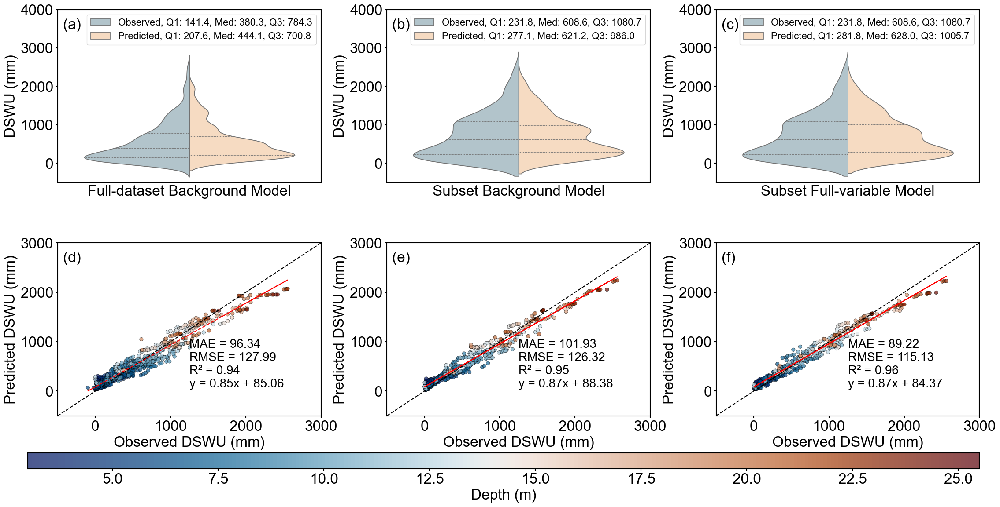

In [8]:
# -*- coding: utf-8 -*-
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from matplotlib.colors import LinearSegmentedColormap
# ====== 1. 设置全局样式 ======
plt.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 16
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# ====== 2. 读取三个模型的预测结果 ======
file_paths = {
    'Full-dataset Background Model': r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model1_predictions.xlsx',
    'Subset Background Model': r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model2_predictions.xlsx',
    'Subset Full-variable Model': r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\model3_predictions.xlsx'
}
cm_data = np.loadtxt(r"C:\Users\Administrator\Desktop\AFM\color\vik.txt") # 假设你下载了 batlow 的 txt 文件
batlow_map = LinearSegmentedColormap.from_list('batlow', cm_data)
models_data = {}
for model_name, path in file_paths.items():
    try:
        df = pd.read_excel(path)
    except:
        df = pd.read_csv(path)
    df.columns = ['Depth(m)', 'SWSD Value', 'SWSD Type']
    
    observed = df[df['SWSD Type'] == 'Observed SWSD'][['Depth(m)', 'SWSD Value']].sort_values('Depth(m)').reset_index(drop=True)
    predicted = df[df['SWSD Type'] == 'Predicted SWSD'][['Depth(m)', 'SWSD Value']].sort_values('Depth(m)').reset_index(drop=True)
    
    if len(observed) != len(predicted):
        min_len = min(len(observed), len(predicted))
        observed = observed.iloc[:min_len].reset_index(drop=True)
        predicted = predicted.iloc[:min_len].reset_index(drop=True)
        print(f"⚠️ {model_name}: Observed 和 Predicted 长度不一致，已截断为 {min_len}")
    
    paired = pd.DataFrame({
        'Depth(m)': observed['Depth(m)'],
        'Observed': observed['SWSD Value'],
        'Predicted': predicted['SWSD Value']
    })
    paired.dropna(inplace=True)
    models_data[model_name] = paired

# ====== 3. 自定义颜色 ======
color_start = plt.cm.RdBu_r(0.25)  # 紫色 (低端)
color_end = plt.cm.RdBu_r(0.75)    # 红色 (高端)
custom_palette = {
    "Observed":(174/255, 198/255, 207/255, 0.8),#'#1f77b4',#'#4dbbd5',  # 浅蓝 (174/255, 198/255, 207/255, 0.8)
    "Predicted":(255/255, 218/255, 185/255, 0.8)#'#ff7f0e'  # 浅橙(255/255, 218/255, 185/255, 1)
}

# ====== 4. 创建 2x3 子图 ======
fig, axes = plt.subplots(2, 3, figsize=(27, 12))
plt.subplots_adjust(hspace=0.35, wspace=0.25)

model_names = ['Full-dataset Background Model', 'Subset Background Model', 'Subset Full-variable Model']
y_violin = (-500, 4000)
y_scatter = (-500, 3000)
x_scatter = (-500, 3000)

# ---------- 第一行：小提琴图 ----------
for idx, model_name in enumerate(model_names):
    ax_v = axes[0, idx]
    data = models_data[model_name]
    y_test = data['Observed'].values
    y_pred = data['Predicted'].values
    
    obs_df = pd.DataFrame({'Value': y_test, 'Type': 'Observed'})
    pred_df = pd.DataFrame({'Value': y_pred, 'Type': 'Predicted'})
    df_plot = pd.concat([obs_df, pred_df], ignore_index=True)

    if not df_plot.empty:
        quartiles = df_plot.groupby('Type')['Value'].quantile([0.25, 0.5, 0.75]).unstack()
        legend_labels = [
            f'{t}, Q1: {quartiles.loc[t, 0.25]:.1f}, Med: {quartiles.loc[t, 0.5]:.1f}, Q3: {quartiles.loc[t, 0.75]:.1f}'
            for t in quartiles.index
        ]
        sns.violinplot(x=[0]*len(df_plot), y='Value', hue='Type', data=df_plot,
                       split=True, inner="quartile", palette=custom_palette, ax=ax_v)
        handles, _ = ax_v.get_legend_handles_labels()
        ax_v.legend(handles=handles, labels=legend_labels, loc='upper right')
    else:
        ax_v.text(0.5, 0.5, 'No data', transform=ax_v.transAxes, ha='center', va='center', color='red')

    ax_v.set_ylabel("DSWU (mm)")
    ax_v.set_xlabel(model_name)
    ax_v.set_xticks([])
    ax_v.set_ylim(y_violin)
    ax_v.text(0.02, 0.95, f"({chr(97 + idx)})", transform=ax_v.transAxes, ha='left', va='top', fontsize=24)

# ---------- 第二行：散点图 ----------
for idx, model_name in enumerate(model_names):
    ax_s = axes[1, idx]
    data = models_data[model_name]
    y_test = data['Observed'].values
    y_pred = data['Predicted'].values

    scatter = ax_s.scatter(y_test, y_pred, c=data['Depth(m)'].values, cmap=batlow_map, alpha=0.7, vmin=3, vmax=25.5,edgecolor='black', linewidth=0.5)
    lims = [max(x_scatter[0], y_scatter[0]), min(x_scatter[1], y_scatter[1])]
    ax_s.plot(lims, lims, '--', color='black', linewidth=1.5)

    z = np.polyfit(y_test, y_pred, 1)
    p = np.poly1d(z)
    ax_s.plot(y_test, p(y_test), 'r--', linewidth=1.5)

    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    equation = f'y = {z[0]:.2f}x + {z[1]:.2f}'
    ax_s.text(0.50, 0.15, f'MAE = {mae:.2f}\nRMSE = {rmse:.2f}\nR² = {r2:.2f}\n{equation}',
              transform=ax_s.transAxes, family='Arial', va='bottom')

    ax_s.set_xlim(x_scatter)
    ax_s.set_ylim(y_scatter)
    ax_s.set_xlabel('Observed DSWU (mm)')
    ax_s.set_ylabel('Predicted DSWU (mm)')

    ax_s.text(0.02, 0.95, f"({chr(97 + 3 + idx)})", transform=ax_s.transAxes, ha='left', va='top', fontsize=24)
# 在图的底部新建一个长条区域 (left, bottom, width, height)，数值是相对坐标 [0~1]
cax = fig.add_axes([0.1, 0.01, 0.8, 0.03])  
cbar = fig.colorbar(scatter, cax=cax, orientation='horizontal')
cbar.set_label('Depth (m)')
# ====== 5. 保存图像 ======
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon'
fig.savefig(f'{save_dir}\\comparison_3models_2x3.png', dpi=300, bbox_inches='tight', format='png')
fig.savefig(f'{save_dir}\\comparison_3models_2x3.svg',format='svg')

# ====== 6. 显示图像 ======
plt.show()

# 5.SHAP

## 5.1 Shap总体

### 5.1.1 72个站点

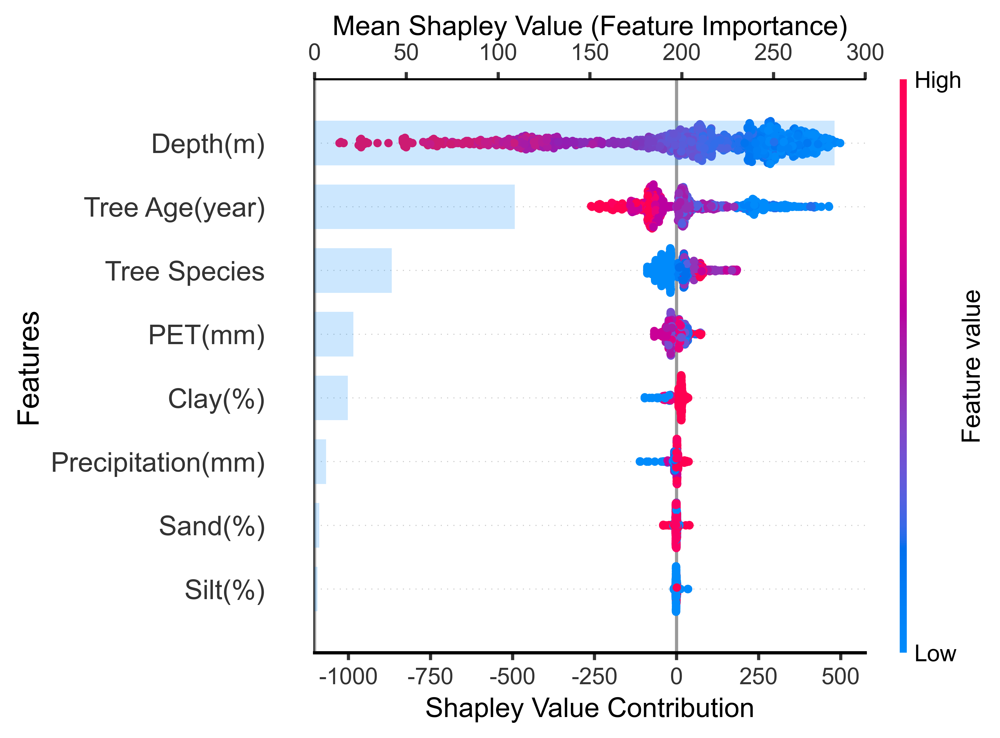

In [9]:
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import matplotlib
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
# 设置字体
matplotlib.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# === 读取并处理数据 ===
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')
rawdata2_row = np.size(rawdata2, 0)

err = np.empty((0, 11))
for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    df = pd.DataFrame(site)
    site_row = df.shape[0]
    for j in range(site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 11)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k - 1, 2:11]
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))

err = pd.DataFrame(err)
x = err.iloc[:, 1:11]
y = -err.iloc[:, 0]

# 特征命名
feature_name_map = {
    1: 'Depth(m)',
    2: 'Precipitation(mm)',
    3: 'PET(mm)',
    4: 'Clay(%)',
    5: 'Sand(%)',
    6: 'Silt(%)',
    7: 'Tree Age(year)',
    8: 'Tree Species',
    9: 'Longitude',
    10:'Latitude'
}
x = x.rename(columns=feature_name_map)
x = x[['Depth(m)','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

# 拆分数据
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# 训练模型
rfr = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)

rfr.fit(X_train, Y_train)

# SHAP值计算
explainer = shap.TreeExplainer(rfr)
shap_values = explainer.shap_values(X_test)

# === 绘图 ===
plt.figure(figsize=(9, 6), dpi=600)  
#fig, ax1 = plt.subplots(figsize=(14, 8), dpi=1200)

# 主图：SHAP 蜂巢图
shap.summary_plot(shap_values, X_test, plot_type="dot", show=False, color_bar=True)
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 留出右侧热力条空间
ax1 = plt.gca()  # 获取蜂巢图坐标轴

# 顶部图：SHAP 条形图（共享 y 轴）
ax2 = ax1.twiny()
shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 与主图对齐
ax2.axhline(y=9, color='gray', linestyle='-', linewidth=1)  # 顶部参考线（可调整）

# 设置透明度
for bar in ax2.patches:
    bar.set_alpha(0.2)

# 设置标签
ax1.set_xlabel('Shapley Value Contribution')
# 设置边框线：上边框和左边框都设为黑色
ax1.spines['left'].set_visible(True)
ax1.spines['left'].set_linewidth(1)
ax1.spines['left'].set_color('black')
ax2.set_xlabel('Mean Shapley Value (Feature Importance)')
ax2.xaxis.set_label_position('top')
ax2.xaxis.tick_top()
# ✅ 显式添加上边框线
ax2.spines['top'].set_visible(True)
ax2.spines['top'].set_linewidth(1)
ax2.spines['top'].set_color('black')
ax2.set_xlim(0,300)
ax1.set_ylabel('Features', fontsize=14)
plt.tight_layout()

# 保存图像
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\SHAP\SHAP_combined_plot.pdf', format='pdf', bbox_inches='tight')
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap\SHAP_combined_plot.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

### 5.1.2 24个站点+withoutroot

C:\Users\Administrator\AppData\Local\Temp\ipykernel_25036\1413436768.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.rename(columns=new_feature_names, inplace=True)


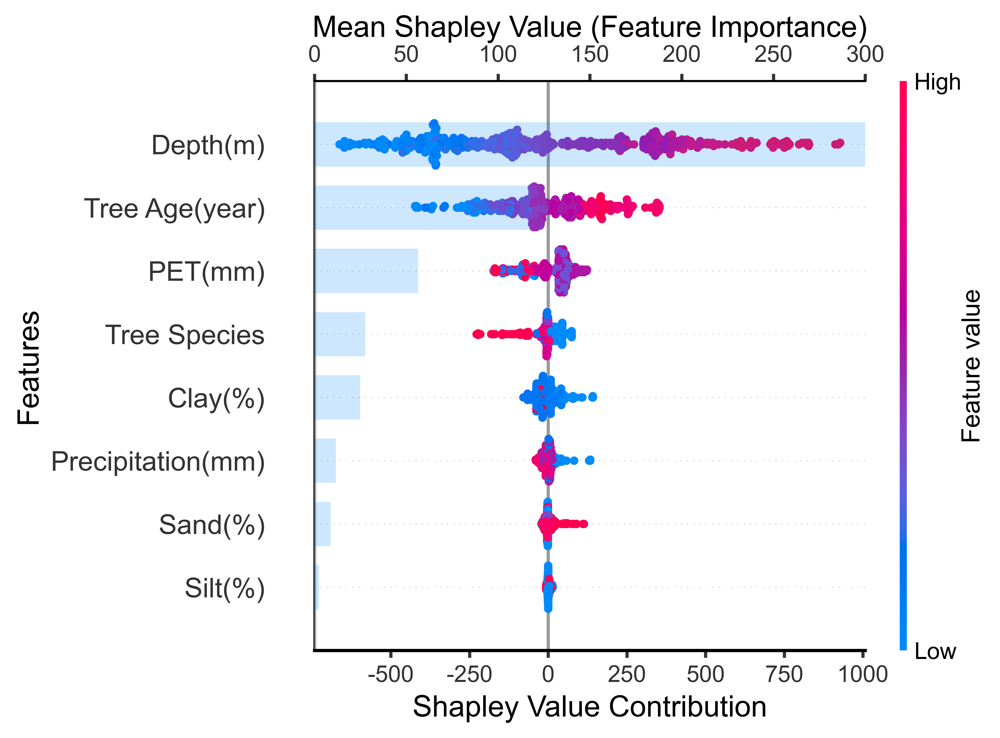

In [10]:
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import matplotlib
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
# 设置字体
matplotlib.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#2:'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]


# 拆分数据
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# 训练模型
rfr = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)

rfr.fit(X_train, Y_train)

# SHAP值计算
explainer = shap.TreeExplainer(rfr)
shap_values = explainer.shap_values(X_test)

# === 绘图 ===
plt.figure(figsize=(9, 6), dpi=600)  
#fig, ax1 = plt.subplots(figsize=(14, 8), dpi=1200)

# 主图：SHAP 蜂巢图
shap.summary_plot(shap_values, X_test, plot_type="dot", show=False, color_bar=True)
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 留出右侧热力条空间
ax1 = plt.gca()  # 获取蜂巢图坐标轴

# 顶部图：SHAP 条形图（共享 y 轴）
ax2 = ax1.twiny()
shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 与主图对齐
ax2.axhline(y=9, color='gray', linestyle='-', linewidth=1)  # 顶部参考线（可调整）

# 设置透明度
for bar in ax2.patches:
    bar.set_alpha(0.2)

# 设置标签
ax1.set_xlabel('Shapley Value Contribution', fontsize=14)
# 设置边框线：上边框和左边框都设为黑色
ax1.spines['left'].set_visible(True)
ax1.spines['left'].set_linewidth(1)
ax1.spines['left'].set_color('black')
ax2.set_xlabel('Mean Shapley Value (Feature Importance)', fontsize=14)
ax2.xaxis.set_label_position('top')
ax2.xaxis.tick_top()
# ✅ 显式添加上边框线
ax2.spines['top'].set_visible(True)
ax2.spines['top'].set_linewidth(1)
ax2.spines['top'].set_color('black')
ax2.set_xlim(0,300)
ax1.set_ylabel('Features', fontsize=14)

plt.tight_layout()

# 保存图像
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\SHAP\SHAP_combined_plot.pdf', format='pdf', bbox_inches='tight')
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap\SHAP_combined_plot_withoutroot24.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

### 5.1.3 24个站点+withroot

C:\Users\Administrator\AppData\Local\Temp\ipykernel_25036\3454389167.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.rename(columns=new_feature_names, inplace=True)


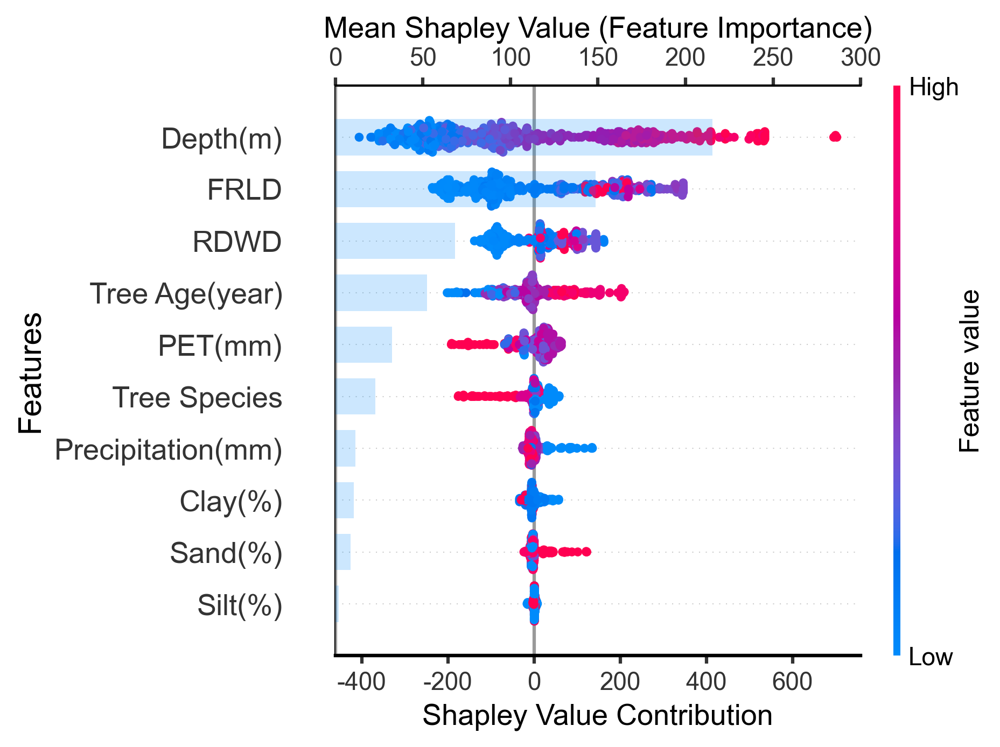

In [11]:
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import matplotlib
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
# 设置字体
matplotlib.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 28
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#2:'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)', 'RDWD','FRLD','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

# 拆分数据
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# 训练模型
rfr = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)

rfr.fit(X_train, Y_train)

# SHAP值计算
explainer = shap.TreeExplainer(rfr)
shap_values = explainer.shap_values(X_test)

# === 绘图 ===
plt.figure(figsize=(9, 6), dpi=300)  
#fig, ax1 = plt.subplots(figsize=(14, 8), dpi=1200)

# 主图：SHAP 蜂巢图
shap.summary_plot(shap_values, X_test, plot_type="dot", show=False, color_bar=True)
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 留出右侧热力条空间
ax1 = plt.gca()  # 获取蜂巢图坐标轴

# 顶部图：SHAP 条形图（共享 y 轴）
ax2 = ax1.twiny()
shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
plt.gca().set_position([0.2, 0.2, 0.65, 0.65])  # 与主图对齐
#ax2.axhline(y=9, color='gray', linestyle='-', linewidth=1)  # 顶部参考线（可调整）

# 设置透明度
for bar in ax2.patches:
    bar.set_alpha(0.2)

# 设置标签
ax1.set_xlabel('Shapley Value Contribution')
# 设置边框线：上边框和左边框都设为黑色
ax1.spines['left'].set_visible(True)
ax1.spines['left'].set_linewidth(1)
ax1.spines['left'].set_color('black')
ax2.set_xlabel('Mean Shapley Value (Feature Importance)')
ax2.xaxis.set_label_position('top')
ax2.xaxis.tick_top()
# ✅ 显式添加上边框线
ax2.spines['top'].set_visible(True)
ax2.spines['top'].set_linewidth(1)
ax2.spines['top'].set_color('black')
ax2.set_xlim(0,300)
ax1.set_ylabel('Features', fontsize=14)
ax1.set_position([0.2, 0.3, 0.65, 0.70])  # 主图
ax2.set_position([0.2, 0.3, 0.65, 0.70])  # 条形图
plt.tight_layout()

# 保存图像
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\SHAP\SHAP_combined_plot.pdf', format='pdf', bbox_inches='tight')
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap\SHAP_combined_plot_withroot24.png', format='png', dpi=300, bbox_inches='tight')

plt.show()

### 5.1.4 模型参数对比

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['mathtext.fontset'] = 'custom'
plt.rcParams['mathtext.rm'] = 'Arial'
plt.rcParams['mathtext.it'] = 'Arial:italic'
plt.rcParams['mathtext.bf'] = 'Arial:bold'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 2.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 2.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 2.5
# ====== 模型1 ======
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')
err = np.empty((0, 11))
for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(rawdata2.shape[0]):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    df = pd.DataFrame(site)
    for j in range(df.shape[0]):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 11)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k - 1, 2:11]
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
x1 = err.iloc[:, 1:11]
y1 = -err.iloc[:, 0]
x1.rename(columns={
    1: 'Depth(m)', 2: 'Precipitation(mm)', 3: 'PET(mm)', 4: 'Clay(%)',
    5: 'Sand(%)', 6: 'Silt(%)', 7: 'Tree Age(year)', 8: 'Tree Species',
    9: 'Longitude', 10:'Latitude'
}, inplace=True)
x1 = x1[['Depth(m)', 'Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]
X_train1, X_test1, Y_train1, Y_test1 = train_test_split(x1, y1, test_size=0.3, random_state=42)
rfr1 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr1.fit(X_train1, Y_train1)

# ====== 模型2 ======
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv', encoding='gbk')
err = np.empty((0, 20))
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(rawdata2.shape[0]):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))
    df = pd.DataFrame(site)
    for j in range(df.shape[0]):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 20)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
x2 = err.iloc[:, 1:20]
y2 = err.iloc[:, 0]

rename_map = {
    1: 'Depth(m)',
    2:'Root Dry Weight Density',
    3:'Fine Root Length Density',
    4:'Tree Species',
    5:'Latitude',
    6:'Longitude',
    7:'Tree Age(year)',
    8:'P(mm yr-1)',
    9:'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}
x2 = x2.rename(columns=rename_map)         # inplace=False，重新赋值
sel_cols_base = ['Depth(m)', 'Tree Species','Tree Age(year)',
                 'Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']
x2 = x2[sel_cols_base]
X_train2, X_test2, Y_train2, Y_test2 = train_test_split(x2, y2, test_size=0.3, random_state=42)
rfr2 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr2.fit(X_train2, Y_train2)

# ====== 模型3（你可以复制模型2再换一套变量，比如增加 Root Dry Weight 和 Fine Root Length）======
x3 = err.iloc[:, 1:20].copy()
y3 = err.iloc[:, 0]
x3=x3.rename(columns=rename_map)
x3 = x3[['Depth(m)', 'Root Dry Weight Density','Fine Root Length Density','Tree Species','Latitude','Longitude','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]
X_train3, X_test3, Y_train3, Y_test3 = train_test_split(x3, y3, test_size=0.3, random_state=42)
rfr3 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr3.fit(X_train3, Y_train3)

# ====== R² 对比图绘制 ======
models = [
    ("Model1", rfr1, X_train1, Y_train1, X_test1, Y_test1),
    ("Model2", rfr2, X_train2, Y_train2, X_test2, Y_test2),
    ("Model3", rfr3, X_train3, Y_train3, X_test3, Y_test3)
]

r2_train, r2_test, labels = [], [], []
for name, model, Xtr, Ytr, Xte, Yte in models:
    labels.append(name)
    r2_train.append(r2_score(Ytr, model.predict(Xtr)))
    r2_test.append(r2_score(Yte, model.predict(Xte)))

x_pos = np.arange(len(labels))
width = 0.25
fig, ax = plt.subplots(figsize=(9, 6), dpi=900)
bars1=ax.bar(x_pos - width/2, r2_train, width, label='Train $R^2$', color="#6A9ACE")
bars2=ax.bar(x_pos + width/2, r2_test, width, label='Test $R^2$', color="orange")
# 2. 添加数值标签
for bar in bars1:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f"{height:.2f}",
            ha='center', va='bottom')

for bar in bars2:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height + 0.01, f"{height:.2f}",
            ha='center', va='bottom')
# 3.美化和展示
ax.set_xlabel("Model")
ax.set_ylabel("$R^2$")
ax.set_xticks(x_pos)
ax.set_xticklabels(labels)
ax.set_ylim(0, 1.18)
ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
#ax.set_title("Train vs Test $R^2$ Comparison", fontsize=14)
ax.legend(
    loc='upper right',           # 放在顶部中央
    bbox_to_anchor=(1.0, 1.03),
    ncol=2,                       # 两列 → 横向排布
    fontsize=20,                  # 图例字体大小
    frameon=False,                 # 是否有边框
    fancybox=False,               # 圆角边框
    shadow=False,
    edgecolor='black'
)
ax.grid(axis='y', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap\R2_comparison.png',
            format='png', bbox_inches='tight', dpi=300)
plt.show()

## 5.2 单个绘图

### *站点随机自举

#### 5.2.1 72个站点

In [ ]:
###20250813以后
import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from matplotlib import gridspec
from matplotlib.ticker import MaxNLocator
from statsmodels.nonparametric.smoothers_lowess import lowess
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import to_rgba
from scipy.interpolate import UnivariateSpline
from PIL import Image, ImageDraw, ImageFont
import io
from mpl_toolkits.axes_grid1 import make_axes_locatable
red_transparent = to_rgba("red", alpha=0.15)
matplotlib.rcParams['font.family'] = 'Arial'  # 设置字体
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# === Step 1: 读取数据 ===
rawdata_path = r'C:\Users\Administrator\Desktop\AFM\data\data.csv'
rawdata2_path = r'C:\Users\Administrator\Desktop\AFM\data\data2.csv'

rawdata = pd.read_csv(rawdata_path, encoding='gbk')
rawdata2 = pd.read_csv(rawdata2_path, encoding='gbk')
rawdata2_row = rawdata2.shape[0]

err = np.empty((0, 11))
for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    df = pd.DataFrame(site)
    site_row = df.shape[0]
    for j in range(site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 11)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k - 1, 2:11]
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))

err = pd.DataFrame(err)
x = err.iloc[:, 1:9]
y = err.iloc[:, 0]
new_feature_names = {
    1: 'Depth(m)',
    2: 'Precipitation(mm)',
    3: 'PET(mm)',
    4: 'Clay(%)',
    5: 'Sand(%)',
    6: 'Silt(%)',
    7: 'Tree Age(year)',
    8: 'Tree Species',
}
x.rename(columns=new_feature_names, inplace=True)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# === Step 4: 训练随机森林回归模型 ===
rfr = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
rfr.fit(x_train, y_train)

# === Step 5: SHAP 分析 ===
explainer = shap.TreeExplainer(rfr)
shap_test = explainer(x_test)
shap_df = pd.DataFrame(shap_test.values, columns=x_test.columns)
X_df = x_test.reset_index(drop=True)

# === 植物种类缩写映射 ===20250826以前
#data = {
#    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
#              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
#              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Amygdalus persica L.',
#              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco', 'Ulmus pumila L.'],
#    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
#}
# === 植物种类缩写映射 ===20250826以后
data = {
    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Ulmus pumila L.',
              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco' ],
    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111]
}
df_species = pd.DataFrame(data)
df_species['abbreviation'] = df_species['kinds'].apply(lambda x: x.split()[0][:3])
abbreviations = df_species['abbreviation'].tolist()

# === 自定义 LOWESS 置信区间函数 ===
def plot_lowess_with_ci(x, y, ax, n_boot=10000, ci=95, color_line="red"):
    sorted_idx = np.argsort(x)
    x_sorted = np.array(x)[sorted_idx]
    y_sorted = np.array(y)[sorted_idx]
    lowess_fit = lowess(y_sorted, x_sorted, frac=0.7, return_sorted=True)
    ax.plot(lowess_fit[:, 0], lowess_fit[:, 1], color=color_line, lw=1)

    boot_preds = []
    for _ in range(n_boot):
        sample_idx = np.random.choice(len(x), len(x), replace=True)
        x_sample = np.array(x)[sample_idx]
        y_sample = np.array(y)[sample_idx]
        lowess_boot = lowess(y_sample, x_sample, frac=0.7, return_sorted=False)
        interp = np.interp(x_sorted, np.sort(x_sample), lowess_boot[np.argsort(x_sample)])
        boot_preds.append(interp)
    boot_preds = np.array(boot_preds)
    lower = np.percentile(boot_preds, (100 - ci) / 2, axis=0)
    upper = np.percentile(boot_preds, 100 - (100 - ci) / 2, axis=0)
    ax.fill_between(x_sorted, lower, upper, color=red_transparent, alpha=0.2)

# === 颜色映射 ===
cm_data = np.loadtxt(r"C:\Users\Administrator\Desktop\AFM\color\bam.txt") # 假设你下载了 batlow 的 txt 文件
bam_map = LinearSegmentedColormap.from_list('bam', cm_data)
vmin=3
vmax=25.5
# === 保存路径 ===
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap'
os.makedirs(save_dir, exist_ok=True)

# 定义子图布局
fig, axes = plt.subplots(3, 1, figsize=(9, 18), dpi=300)
fig.subplots_adjust(wspace=0.3)  # 子图之间间距
yaxis_limits = {
    'Tree Species': (-300, 200),
    'PET(mm)': (-175, 150),
    'Precipitation(mm)': (-70, 100),
    'Tree Age(year)': (-600, 400)
}
xaxis_limits = {
    'Tree Species': (100, 112),
    'PET(mm)': (875, 1225),
    'Precipitation(mm)': (350, 700),
    'Tree Age(year)': (0, 26)
}
combined_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
labels = ['(a)', '(d)', '(g)']

# 遍历绘图
# 遍历绘图
for idx, feature in enumerate(combined_features):
    ax_main = axes[idx]
    x_val = X_df[feature]
    shap_val = shap_df[feature]
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')

    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        ax_main.set_xlim(xaxis_limits[feature])
    if feature != 'Tree Species':
        # LOWESS 曲线 + 置信区间
        plot_lowess_with_ci(x_val, shap_val, ax_main, color_line="red")
    else:
        ax_main.set_xlim(99.5, 111.5)
        ax_main.set_xticks(np.arange(100, 112,1))
        ax_main.set_xticklabels(abbreviations, rotation=0)
        #ax_main.xaxis.set_major_locator(MaxNLocator(integer=True)) 
    # 顶部密度图
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 右侧密度图
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签
    ax_main.text(0.02, 0.95, labels[idx], transform=ax_main.transAxes,
                 fontsize=22, va='top', ha='left')  # fontweight='bold'

# 添加统一 colorbar
#cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
#cb = fig.colorbar(scatter, cax=cbar_ax)
#cb.set_label("Depth(m)")

# 保存图像
fig.savefig(os.path.join(save_dir, "SHAP_combined_1x3_subplots72.png"), bbox_inches='tight', dpi=300)
plt.show()

# === 第三步：生成其余特征的独立图像 ===
other_features = [col for col in x_test.columns if col not in combined_features]
figsize = (9, 6)  # 图的尺寸（单位是英寸）
dpi = 300         # 分辨率，常用于论文或高质量图像
for feature in other_features:
    x_val = X_df[feature]
    shap_val = shap_df[feature]

    fig = plt.figure(figsize=figsize, dpi=dpi)
    grid = gridspec.GridSpec(4, 4, hspace=0.3, wspace=0.3)

    main_ax = fig.add_subplot(grid[1:, :-1])

    if feature != 'Depth(m)':
        color_feature = X_df['Depth(m)']
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
        #cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        #cbar = plt.colorbar(scatter, cax=cbar_ax)
        #cbar.set_label('Depth(m)')
    else:
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=shap_val, cmap='inferno', alpha=0.8)
     #   cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
     #   cbar = plt.colorbar(scatter, cax=cbar_ax)
     #   cbar.set_label('SHAP value')

    main_ax.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    main_ax.set_xlabel(feature)
    main_ax.tick_params(axis='both')
    main_ax.xaxis.set_major_locator(MaxNLocator(integer=False))
    main_ax.set_ylabel("SHAP value")
    if feature in yaxis_limits:
        main_ax.set_ylim(yaxis_limits[feature])  # ✅ 限制 y 轴范围
    if feature in xaxis_limits:
        main_ax.set_xlim(xaxis_limits[feature])
    main_ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='out')

    if feature != 'Tree Species':
        plot_lowess_with_ci(x_val, shap_val, main_ax, color_line="red")

    top_ax = fig.add_subplot(grid[0, :-1], sharex=main_ax)
    sns.kdeplot(x=x_val, ax=top_ax, fill=True, color="#6A9ACE")
    top_ax.axis('off')

    right_ax = fig.add_subplot(grid[1:, -1], sharey=main_ax)
    sns.kdeplot(y=shap_val, ax=right_ax, fill=True, color="orange")
    right_ax.axis('off')

    # 保存独立图
    file_name = f"SHAP_X20_site72_{feature.replace(' ', '_')}.png"
    plt.savefig(os.path.join(save_dir, file_name), format='png', bbox_inches='tight', dpi=300)
    plt.show(fig)

print(f"✅ 所有其他特征图已保存至：{save_dir}")

#### 5.2.2 24个站点+root数据

In [ ]:
### 20250813以后
import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from matplotlib import gridspec
import matplotlib
from matplotlib.ticker import MaxNLocator
from statsmodels.nonparametric.smoothers_lowess import lowess
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import to_rgba
from scipy.interpolate import UnivariateSpline
from PIL import Image, ImageDraw, ImageFont
import io
from mpl_toolkits.axes_grid1 import make_axes_locatable
# === 设置字体和颜色 ===
matplotlib.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
red_transparent = to_rgba("red", alpha=0.15)

def plot_lowess_with_ci(x, y, ax, n_boot=10000, ci=95, color_line="red"):
    sorted_idx = np.argsort(x)
    x_sorted = np.array(x)[sorted_idx]
    y_sorted = np.array(y)[sorted_idx]
    lowess_fit = lowess(y_sorted, x_sorted, frac=0.7, return_sorted=True)
    ax.plot(lowess_fit[:, 0], lowess_fit[:, 1], color=color_line, lw=1)

    boot_preds = []
    for _ in range(n_boot):
        sample_idx = np.random.choice(len(x), len(x), replace=True)
        x_sample = np.array(x)[sample_idx]
        y_sample = np.array(y)[sample_idx]
        lowess_boot = lowess(y_sample, x_sample, frac=0.7, return_sorted=False)
        interp = np.interp(x_sorted, np.sort(x_sample), lowess_boot[np.argsort(x_sample)])
        boot_preds.append(interp)
    boot_preds = np.array(boot_preds)
    lower_bound = np.percentile(boot_preds, (100 - ci) / 2, axis=0)
    upper_bound = np.percentile(boot_preds, 100 - (100 - ci) / 2, axis=0)
    ax.fill_between(x_sorted, lower_bound, upper_bound, color=to_rgba("red", alpha=0.1), alpha=0.2)
# === Step 1: 读取数据 ===
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)', 'RDWD','FRLD','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# === Step 4: 训练随机森林回归模型 ===
rfr = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
rfr.fit(x_train, y_train)

# === Step 5: SHAP 分析 ===
explainer = shap.TreeExplainer(rfr)
shap_test = explainer(x_test)
shap_df = pd.DataFrame(shap_test.values, columns=x_test.columns)
X_df = x_test.reset_index(drop=True)

# === 植物种类缩写映射 ===20250826以后
data = {
    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Ulmus pumila L.',
              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco' ],
    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111]
}
df_species = pd.DataFrame(data)
df_species['abbreviation'] = df_species['kinds'].apply(lambda x: x.split()[0][:3])
abbreviations = df_species['abbreviation'].tolist()

# === 颜色映射 ===
cm_data = np.loadtxt(r"C:\Users\Administrator\Desktop\AFM\color\bam.txt") # 假设你下载了 batlow 的 txt 文件
bam_map = LinearSegmentedColormap.from_list('batlow', cm_data)
vmin=3
vmax=25.5
# === 保存路径 ===
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap'
os.makedirs(save_dir, exist_ok=True)
yaxis_limits = {
    'Tree Species': (-300, 200),
    'PET(mm)': (-175, 150),
    'Precipitation(mm)': (-70, 100),
    'Tree Age(year)': (-600, 400),
    'RDWD':(-200,200),
    'FRLD':(-400,400)
}
xaxis_limits = {
    'Tree Species': (100, 112),
    'PET(mm)': (975, 1225),
    'Precipitation(mm)': (400, 700),
    'Tree Age(year)': (4, 26),
    'RDWD':(-1500,12500),
    'FRLD':(-15000,275000)
}
# ===================================
# 第一组：RDWD 和 FRLD → 1行2列
# ===================================
fig, axes = plt.subplots(1, 2, figsize=(18, 6), dpi=900, gridspec_kw={'width_ratios': [1, 1]})
pair_features = ['RDWD', 'FRLD']
pair_labels = ['(a)', '(b)']

for idx, feature in enumerate(pair_features):
    ax_main = axes[idx]
    x_val = X_df[feature]
    shap_val = shap_df[feature]
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        ax_main.set_xlim(xaxis_limits[feature])
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')

    # 科学计数法
    if feature in ['RDWD', 'FRLD']:
        from matplotlib.ticker import ScalarFormatter
        formatter = ScalarFormatter(useMathText=False)
        formatter.set_scientific(True)
        formatter.set_powerlimits((-2, 3))
        ax_main.xaxis.set_major_formatter(formatter)

    # LOWESS 平滑曲线
    plot_lowess_with_ci(x_val, shap_val, ax_main, color_line="red")

    # 密度图（上）
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 密度图（右）
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签 (a), (b)
    ax_main.text(0.02, 0.95, pair_labels[idx], transform=ax_main.transAxes,
                 fontsize=22,  va='top', ha='left')#fontweight='bold',

# 公共 colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
cb = plt.colorbar(scatter, cax=cbar_ax)
cb.set_label('Depth(m)')

plt.tight_layout(rect=[0, 0, 0.9, 1])  # 为 colorbar 留出空间

# 保存图片
save_path = os.path.join(save_dir, "SHAP_RDWD_FRLD_subplot.png")
plt.savefig(save_path, dpi=300)
plt.savefig(save_path.replace('.png', '.pdf'), dpi=300)
plt.show()
print(f"✅ 子图版 SHAP RDWD/FRLD 已保存：{save_path}")
# ===================================
# 第二组：Tree Species, PET, Precip → 3行1列
# ===================================
#trio_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
#trio_labels = ['(c)', '(f)', '(i)']
#trio_images = []
combined_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
labels = ['(c)', '(f)', '(i)']
# 定义子图布局
fig, axes = plt.subplots(3, 1, figsize=(10, 18), dpi=900)
fig.subplots_adjust(wspace=0.3)  # 子图之间间距
# 遍历绘图
for idx, feature in enumerate(combined_features):
    ax_main = axes[idx]
    x_val = X_df[feature]
    shap_val = shap_df[feature]
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')

    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        ax_main.set_xlim(xaxis_limits[feature])
    if feature != 'Tree Species':
        # LOWESS 曲线 + 置信区间
        plot_lowess_with_ci(x_val, shap_val, ax_main, color_line="red")
    else:
        ax_main.set_xlim(99.5, 111.5)
        ax_main.set_xticks(np.arange(100, 112,1))
        ax_main.set_xticklabels(abbreviations, rotation=0)
        #ax_main.xaxis.set_major_locator(MaxNLocator(integer=True)) 
    # 顶部密度图
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 右侧密度图
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签
    ax_main.text(0.02, 0.95, labels[idx], transform=ax_main.transAxes,
                 fontsize=22, va='top', ha='left')  # fontweight='bold'

# 添加统一 colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
cb = fig.colorbar(scatter, cax=cbar_ax)
cb.set_label("Depth(m)")

# 保存图像
fig.savefig(os.path.join(save_dir, "SHAP_combined_1x3_subplots24_withroot.png"), bbox_inches='tight', dpi=300)
plt.show()
# ===================================
# 第三组：其余特征 → 独立保存
# ===================================
other_features = [col for col in x_test.columns if col not in pair_features + combined_features]
figsize = (9, 6)  # 图的尺寸（单位是英寸）
dpi = 300         # 分辨率，常用于论文或高质量图像
for feature in other_features:
    x_val = X_df[feature]
    shap_val = shap_df[feature]

    fig = plt.figure(figsize=figsize, dpi=dpi)
    grid = gridspec.GridSpec(4, 4, hspace=0.3, wspace=0.3)
    main_ax = fig.add_subplot(grid[1:, :-1])

    if feature != 'Depth(m)':
        color_feature = X_df['Depth(m)']
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
        cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        cbar = plt.colorbar(scatter, cax=cbar_ax)
        cbar.set_label('Depth(m)')
        # 设置稀疏的颜色条刻度
        #tick_values = np.linspace(np.nanmin(color_feature), np.nanmax(color_feature), num=5)
        #cbar.set_ticks(tick_values)
    else:
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=shap_val, cmap='inferno', alpha=0.8)
        cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        cbar = plt.colorbar(scatter, cax=cbar_ax)
        cbar.set_label('SHAP value')
        # 设置稀疏的颜色条刻度
        #tick_values = np.linspace(np.nanmin(color_feature), np.nanmax(color_feature), num=5)
        #cbar.set_ticks(tick_values)
    main_ax.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    main_ax.set_xlabel(feature)
    main_ax.tick_params(axis='both')
    main_ax.set_ylabel("SHAP value")
    if feature in yaxis_limits:
        main_ax.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        main_ax.set_xlim(xaxis_limits[feature])
    main_ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='in')

    if feature != 'Tree Species':
        plot_lowess_with_ci(x_val, shap_val, main_ax, color_line="red")
    if feature == 'Tree Age(year)':
        from matplotlib.ticker import MaxNLocator
        main_ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    top_ax = fig.add_subplot(grid[0, :-1], sharex=main_ax)
    sns.kdeplot(x=x_val, ax=top_ax, fill=True, color="#6A9ACE")
    top_ax.axis('off')

    right_ax = fig.add_subplot(grid[1:, -1], sharey=main_ax)
    sns.kdeplot(y=shap_val, ax=right_ax, fill=True, color="orange")
    right_ax.axis('off')

    file_name = f"SHAP_X20_site24withroot_{feature.replace(' ', '_')}.png"
    plt.savefig(os.path.join(save_dir, file_name), format='png', bbox_inches='tight', dpi=dpi)
    plt.show(fig)

print(f"✅ 所有独立图已保存至：{save_dir}")

#### 5.2.3 24个站点+不加root数据

In [ ]:
###20250813以后
import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from matplotlib import gridspec
import matplotlib
from matplotlib.ticker import MaxNLocator  
from statsmodels.nonparametric.smoothers_lowess import lowess
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import to_rgba
red_transparent = to_rgba("red", alpha=0.15)
from scipy.interpolate import UnivariateSpline
import io
from PIL import Image, ImageDraw, ImageFont
from mpl_toolkits.axes_grid1 import make_axes_locatable
matplotlib.rcParams['font.family'] = 'Arial'  # 设置字体
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# === Step 1: 读取数据 ===
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# === Step 4: 训练随机森林回归模型 ===
rfr = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
rfr.fit(x_train, y_train)

# === Step 5: SHAP 分析 ===
explainer = shap.TreeExplainer(rfr)
shap_test = explainer(x_test)
shap_df = pd.DataFrame(shap_test.values, columns=x_test.columns)
X_df = x_test.reset_index(drop=True)

# === 植物种类缩写映射 ===20250826以后
data = {
    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Ulmus pumila L.',
              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco' ],
    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111]
}
df_species = pd.DataFrame(data)
df_species['abbreviation'] = df_species['kinds'].apply(lambda x: x.split()[0][:3])
abbreviations = df_species['abbreviation'].tolist()

# === 自定义 LOWESS 置信区间函数 ===
def plot_lowess_with_ci(x, y, ax, n_boot=10000, ci=95, color_line="red"):
    sorted_idx = np.argsort(x)
    x_sorted = np.array(x)[sorted_idx]
    y_sorted = np.array(y)[sorted_idx]
    lowess_fit = lowess(y_sorted, x_sorted, frac=0.7, return_sorted=True)
    ax.plot(lowess_fit[:, 0], lowess_fit[:, 1], color=color_line, lw=1)

    boot_preds = []
    for _ in range(n_boot):
        sample_idx = np.random.choice(len(x), len(x), replace=True)
        x_sample = np.array(x)[sample_idx]
        y_sample = np.array(y)[sample_idx]
        lowess_boot = lowess(y_sample, x_sample, frac=0.7, return_sorted=False)
        interp = np.interp(x_sorted, np.sort(x_sample), lowess_boot[np.argsort(x_sample)])
        boot_preds.append(interp)
    boot_preds = np.array(boot_preds)
    lower = np.percentile(boot_preds, (100 - ci) / 2, axis=0)
    upper = np.percentile(boot_preds, 100 - (100 - ci) / 2, axis=0)
    ax.fill_between(x_sorted, lower, upper, color=red_transparent, alpha=0.2)

# === 颜色映射 ===
cm_data = np.loadtxt(r"C:\Users\Administrator\Desktop\AFM\color\bam.txt") # 假设你下载了 batlow 的 txt 文件
bam_map = LinearSegmentedColormap.from_list('batlow', cm_data)
vmin=3
vmax=25.5
# === 保存路径 ===
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap'
os.makedirs(save_dir, exist_ok=True)

# 定义子图布局
fig, axes = plt.subplots(3, 1, figsize=(9, 18), dpi=300)
fig.subplots_adjust(wspace=0.3)  # 子图之间间距
yaxis_limits = {
    'Tree Species': (-300, 200),
    'PET(mm)': (-175, 150),
    'Precipitation(mm)': (-70, 100),
    'Tree Age(year)': (-600, 400)
}
xaxis_limits = {
    'Tree Species': (100, 112),
    'PET(mm)': (975, 1225),
    'Precipitation(mm)': (400, 700),
    'Tree Age(year)': (4, 26)
}
combined_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
labels = ['(b)', '(e)', '(h)']

# 遍历绘图
for idx, feature in enumerate(combined_features):
    ax_main = axes[idx]
    x_val = X_df[feature]
    shap_val = shap_df[feature]
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')
    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        ax_main.set_xlim(xaxis_limits[feature])
    if feature != 'Tree Species':
        # LOWESS 曲线 + 置信区间
        plot_lowess_with_ci(x_val, shap_val, ax_main, color_line="red")
    else:
        ax_main.set_xlim(99.5, 111.5)
        ax_main.set_xticks(np.arange(100, 112,1))
        ax_main.set_xticklabels(abbreviations, rotation=0)
        #ax_main.xaxis.set_major_locator(MaxNLocator(integer=True)) 
    # 顶部密度图
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 右侧密度图
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签
    ax_main.text(0.02, 0.95, labels[idx], transform=ax_main.transAxes,
                 fontsize=22, va='top', ha='left')  # fontweight='bold'

# 添加统一 colorbar
#cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
#cb = fig.colorbar(scatter, cax=cbar_ax)
#cb.set_label("Depth(m)")

# 保存图像
fig.savefig(os.path.join(save_dir, "SHAP_combined_1x3_subplots24_withoutroot.png"), bbox_inches='tight', dpi=300)
plt.show()

# === 第三步：生成其余特征的独立图像 ===
other_features = [col for col in x_test.columns if col not in combined_features]
figsize = (9, 6)  # 图的尺寸（单位是英寸）
dpi = 300         # 分辨率，常用于论文或高质量图像
for feature in other_features:
    x_val = X_df[feature]
    shap_val = shap_df[feature]

    fig = plt.figure(figsize=figsize, dpi=dpi)
    grid = gridspec.GridSpec(4, 4, hspace=0.3, wspace=0.3)

    main_ax = fig.add_subplot(grid[1:, :-1])

    if feature != 'Depth(m)':
        color_feature = X_df['Depth(m)']
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
        #cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        #cbar = plt.colorbar(scatter, cax=cbar_ax)
        #cbar.set_label('Depth(m)')
    else:
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=shap_val, cmap='inferno', alpha=0.8)
   #     cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
   #     cbar = plt.colorbar(scatter, cax=cbar_ax)
   #     cbar.set_label('SHAP value')
    main_ax.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    main_ax.set_xlabel(feature)
    main_ax.tick_params(axis='both')
    main_ax.xaxis.set_major_locator(MaxNLocator(integer=False))
    main_ax.set_ylabel("SHAP value")
    main_ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')
    if feature in yaxis_limits:
        main_ax.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        main_ax.set_xlim(xaxis_limits[feature])
    if feature != 'Tree Species':
        plot_lowess_with_ci(x_val, shap_val, main_ax, color_line="red")
    # 如果是树龄，想用整数刻度可加：
    if feature == 'Tree Age(year)':
        from matplotlib.ticker import MaxNLocator
        main_ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    top_ax = fig.add_subplot(grid[0, :-1], sharex=main_ax)
    sns.kdeplot(x=x_val, ax=top_ax, fill=True, color="#6A9ACE")
    top_ax.axis('off')

    right_ax = fig.add_subplot(grid[1:, -1], sharey=main_ax)
    sns.kdeplot(y=shap_val, ax=right_ax, fill=True, color="orange")
    right_ax.axis('off')

    # 保存独立图
    file_name = f"SHAP_X20_site24_withoutroot_{feature.replace(' ', '_')}.png"
    plt.savefig(os.path.join(save_dir, file_name), format='png', bbox_inches='tight', dpi=dpi)
    plt.show(fig)

print(f"✅ 所有其他特征图已保存至：{save_dir}")

### 随机自举（20250919以后：因为错位插值，修改）

#### 5.2.1 72个站点

C:\Users\Administrator\miniconda3\envs\jup\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\Administrator\AppData\Local\Temp\ipykernel_25036\3440119201.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.rename(columns=new_feature_names, inplace=True)


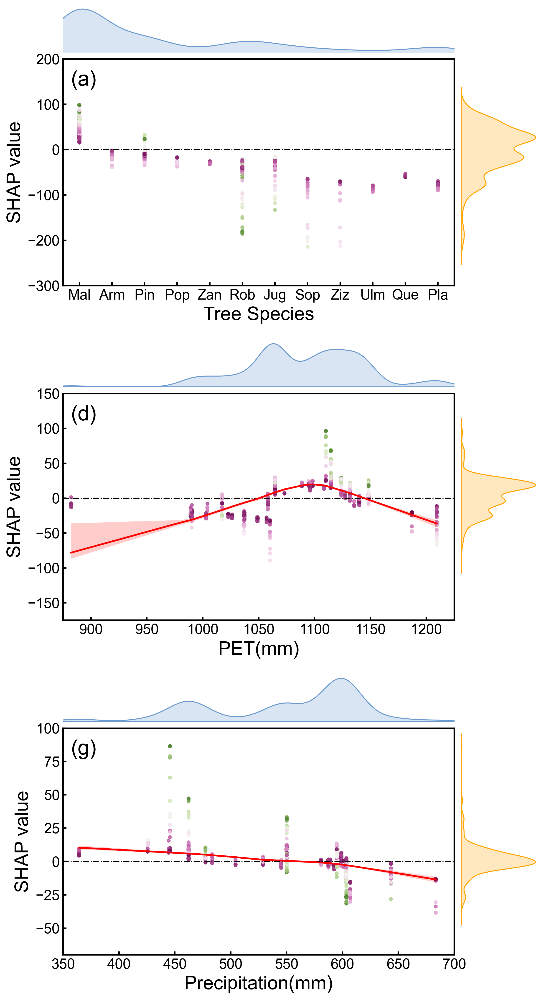

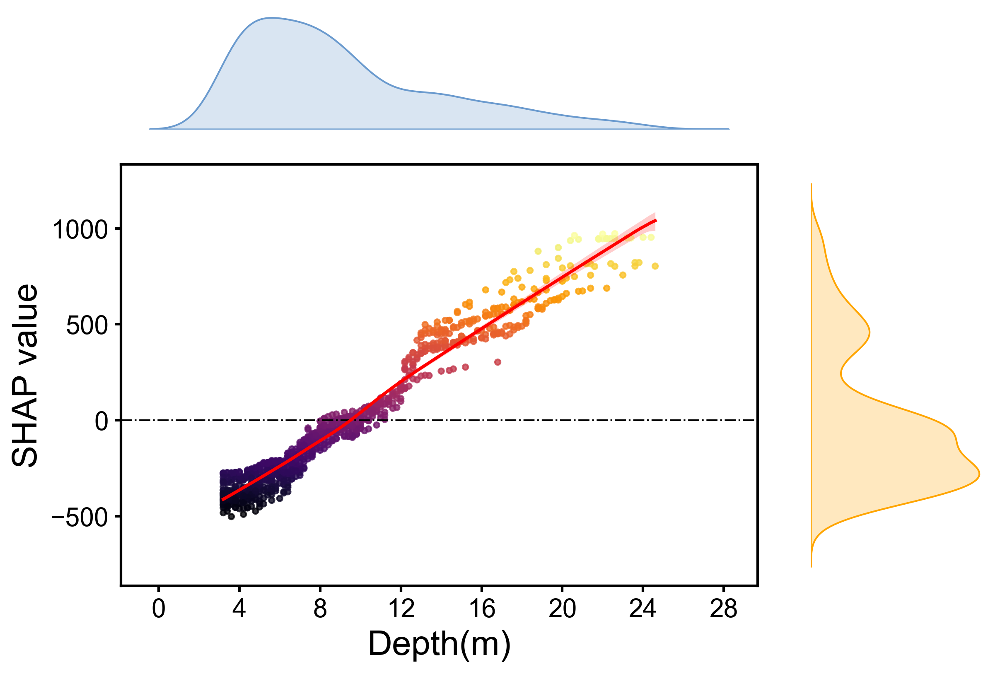

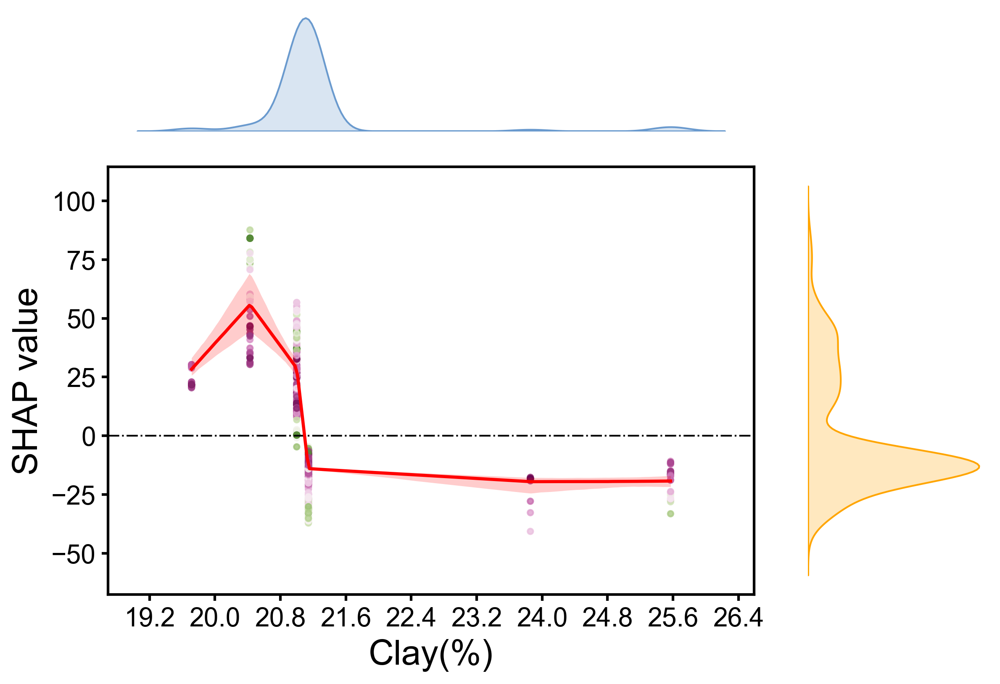

C:\Users\Administrator\miniconda3\envs\jup\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


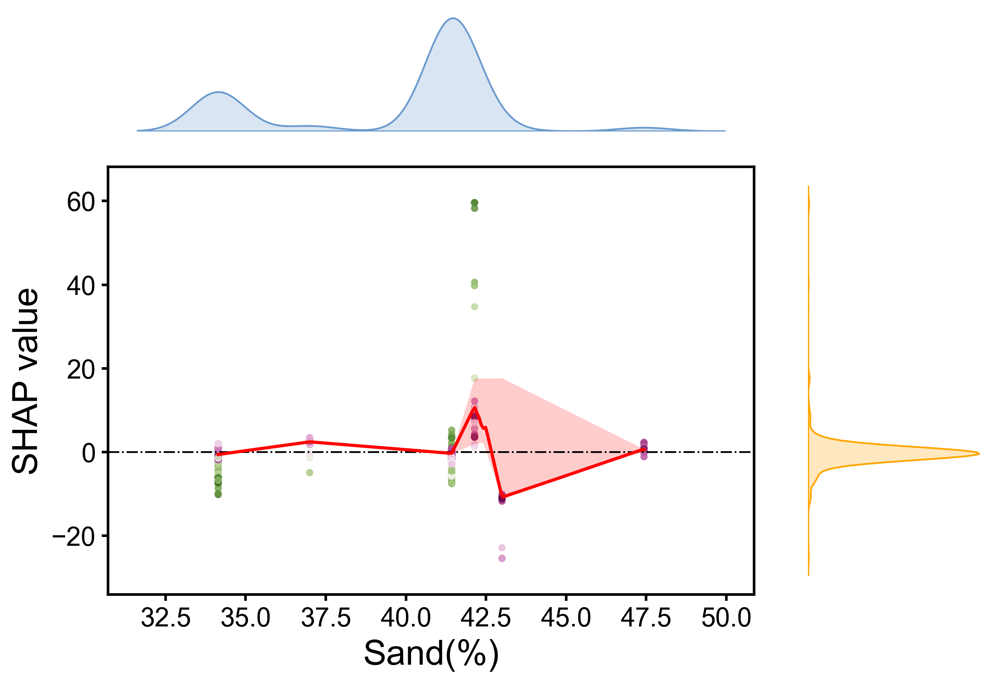

C:\Users\Administrator\miniconda3\envs\jup\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


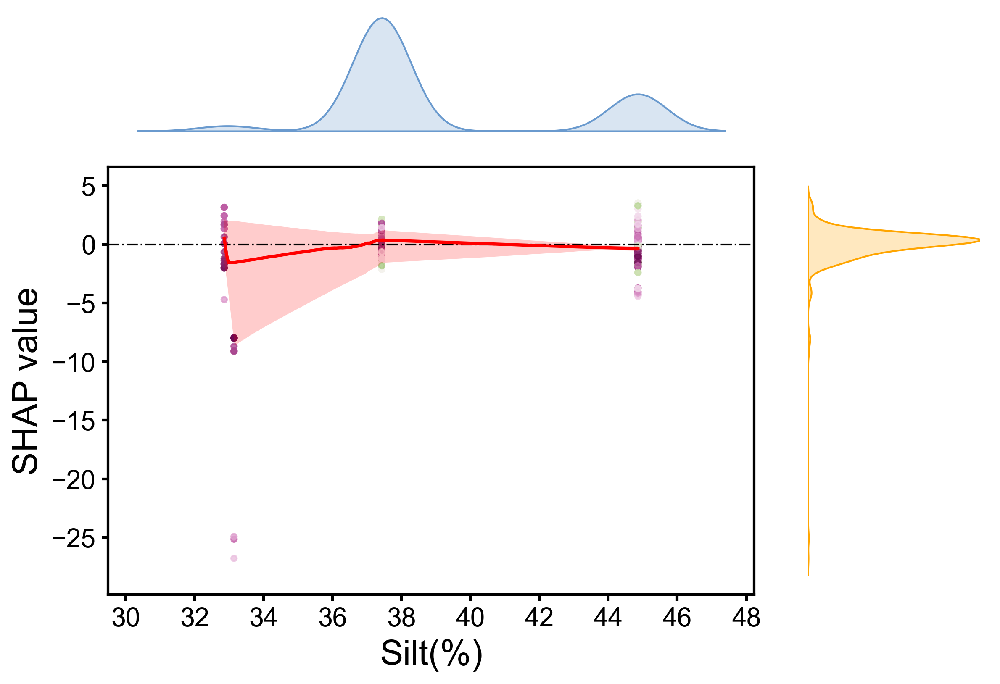

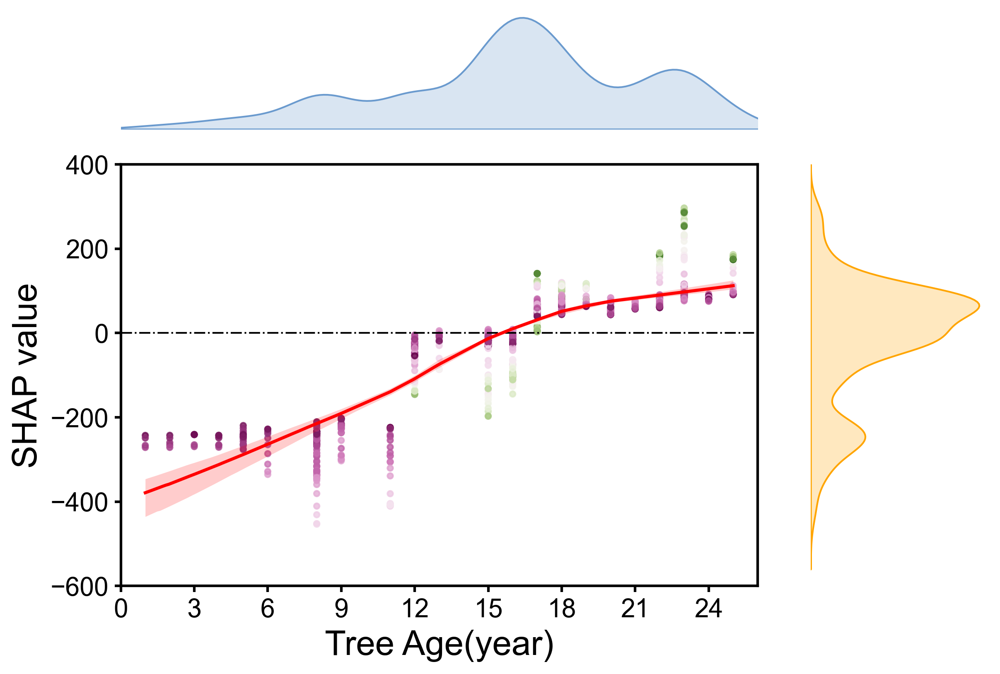

✅ 所有其他特征图已保存至：C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap


In [1]:
###20250813以后
import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from matplotlib import gridspec
from matplotlib.ticker import MaxNLocator
from statsmodels.nonparametric.smoothers_lowess import lowess
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import to_rgba
from scipy.interpolate import UnivariateSpline
from PIL import Image, ImageDraw, ImageFont
import io
from mpl_toolkits.axes_grid1 import make_axes_locatable
red_transparent = to_rgba("red", alpha=0.15)
matplotlib.rcParams['font.family'] = 'Arial'  # 设置字体
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# === Step 1: 读取数据 ===
rawdata_path = r'C:\Users\Administrator\Desktop\AFM\data\data.csv'
rawdata2_path = r'C:\Users\Administrator\Desktop\AFM\data\data2.csv'

rawdata = pd.read_csv(rawdata_path, encoding='gbk')
rawdata2 = pd.read_csv(rawdata2_path, encoding='gbk')
rawdata2_row = rawdata2.shape[0]

err = np.empty((0, 11))
for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    df = pd.DataFrame(site)
    site_row = df.shape[0]
    for j in range(site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 11)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k - 1, 2:11]
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))

err = pd.DataFrame(err)
x = err.iloc[:, 1:9]
y = err.iloc[:, 0]
new_feature_names = {
    1: 'Depth(m)',
    2: 'Precipitation(mm)',
    3: 'PET(mm)',
    4: 'Clay(%)',
    5: 'Sand(%)',
    6: 'Silt(%)',
    7: 'Tree Age(year)',
    8: 'Tree Species',
}
x.rename(columns=new_feature_names, inplace=True)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# === Step 4: 训练随机森林回归模型 ===
rfr = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
rfr.fit(x_train, y_train)

# === Step 5: SHAP 分析 ===
explainer = shap.TreeExplainer(rfr)
shap_test = explainer(x_test)
shap_df = pd.DataFrame(shap_test.values, columns=x_test.columns)
X_df = x_test.reset_index(drop=True)

# === 植物种类缩写映射 ===20250826以前
#data = {
#    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
#              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
#              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Amygdalus persica L.',
#              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco', 'Ulmus pumila L.'],
#    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
#}
# === 植物种类缩写映射 ===20250826以后
data = {
    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Ulmus pumila L.',
              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco' ],
    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111]
}
df_species = pd.DataFrame(data)
df_species['abbreviation'] = df_species['kinds'].apply(lambda x: x.split()[0][:3])
abbreviations = df_species['abbreviation'].tolist()

# === 自定义 LOWESS 置信区间函数 ===
def plot_lowess_with_ci(x, y, ax, n_boot=1000, ci=95, color_line="red", frac=0.7):
    from statsmodels.nonparametric.smoothers_lowess import lowess
    from matplotlib.colors import to_rgba

    x = np.asarray(x)
    y = np.asarray(y)
    mask = ~np.isnan(x) & ~np.isnan(y)
    x = x[mask]
    y = y[mask]

    x_grid = np.linspace(x.min(), x.max(), 200)
    boot_preds = []

    for _ in range(n_boot):
        idx = np.random.choice(len(x), len(x), replace=True)
        x_sample = x[idx]
        y_sample = y[idx]

        try:
            fit = lowess(y_sample, x_sample, frac=frac, return_sorted=True)
            xp, yp = fit[:, 0], fit[:, 1]

            # 排序 + 去重（防止重复 x 导致插值错误）
            order = np.argsort(xp)
            xp = xp[order]
            yp = yp[order]
            xp_unique, indices = np.unique(xp, return_index=True)
            yp_unique = yp[indices]

            interp = np.interp(x_grid, xp_unique, yp_unique)
            boot_preds.append(interp)
        except:
            continue

    boot_preds = np.array(boot_preds)
    if boot_preds.shape[0] < 5:
        return

    low = np.percentile(boot_preds, (100 - ci) / 2, axis=0)
    high = np.percentile(boot_preds, 100 - (100 - ci) / 2, axis=0)
    median = np.median(boot_preds, axis=0)

    # zorder控制图层顺序
    ax.fill_between(x_grid, low, high, color=to_rgba(color_line, 0.2), zorder=1, linewidth=0)
    ax.plot(x_grid, median, color=color_line, lw=1.8, zorder=2)

# === 颜色映射 ===
cm_data = np.loadtxt(r"C:\Users\Administrator\Desktop\AFM\color\bam.txt") # 假设你下载了 batlow 的 txt 文件
bam_map = LinearSegmentedColormap.from_list('bam', cm_data)
vmin=3
vmax=25.5
# === 保存路径 ===
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap'
os.makedirs(save_dir, exist_ok=True)

# 定义子图布局
fig, axes = plt.subplots(3, 1, figsize=(9, 18), dpi=300)
fig.subplots_adjust(wspace=0.3)  # 子图之间间距
yaxis_limits = {
    'Tree Species': (-300, 200),
    'PET(mm)': (-175, 150),
    'Precipitation(mm)': (-70, 100),
    'Tree Age(year)': (-600, 400)
}
xaxis_limits = {
    'Tree Species': (100, 112),
    'PET(mm)': (875, 1225),
    'Precipitation(mm)': (350, 700),
    'Tree Age(year)': (0, 26)
}
combined_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
labels = ['(a)', '(d)', '(g)']

# 遍历绘图
for idx, feature in enumerate(combined_features):
    ax_main = axes[idx]
    x_val = X_df[feature]
    shap_val = shap_df[feature]
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')

    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        ax_main.set_xlim(xaxis_limits[feature])
    if feature != 'Tree Species':
        # LOWESS 曲线 + 置信区间
        plot_lowess_with_ci(x_val, shap_val, ax_main, color_line="red")
    else:
        ax_main.set_xlim(99.5, 111.5)
        ax_main.set_xticks(np.arange(100, 112,1))
        ax_main.set_xticklabels(abbreviations, rotation=0)
        #ax_main.xaxis.set_major_locator(MaxNLocator(integer=True)) 
    # 顶部密度图
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 右侧密度图
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签
    ax_main.text(0.02, 0.95, labels[idx], transform=ax_main.transAxes,
                 fontsize=22, va='top', ha='left')  # fontweight='bold'

# 添加统一 colorbar
#cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
#cb = fig.colorbar(scatter, cax=cbar_ax)
#cb.set_label("Depth(m)")

# 保存图像
fig.savefig(os.path.join(save_dir, "SHAP_combined_1x3_subplots72.png"), bbox_inches='tight', dpi=300)
plt.show()

# === 第三步：生成其余特征的独立图像 ===
other_features = [col for col in x_test.columns if col not in combined_features]
figsize = (9, 6)  # 图的尺寸（单位是英寸）
dpi = 300         # 分辨率，常用于论文或高质量图像
for feature in other_features:
    x_val = X_df[feature]
    shap_val = shap_df[feature]

    fig = plt.figure(figsize=figsize, dpi=dpi)
    grid = gridspec.GridSpec(4, 4, hspace=0.3, wspace=0.3)

    main_ax = fig.add_subplot(grid[1:, :-1])

    if feature != 'Depth(m)':
        color_feature = X_df['Depth(m)']
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
        #cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        #cbar = plt.colorbar(scatter, cax=cbar_ax)
        #cbar.set_label('Depth(m)')
    else:
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=shap_val, cmap='inferno', alpha=0.8)
     #   cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
     #   cbar = plt.colorbar(scatter, cax=cbar_ax)
     #   cbar.set_label('SHAP value')

    main_ax.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    main_ax.set_xlabel(feature)
    main_ax.tick_params(axis='both')
    main_ax.xaxis.set_major_locator(MaxNLocator(integer=False))
    main_ax.set_ylabel("SHAP value")
    if feature in yaxis_limits:
        main_ax.set_ylim(yaxis_limits[feature])  # ✅ 限制 y 轴范围
    if feature in xaxis_limits:
        main_ax.set_xlim(xaxis_limits[feature])
    main_ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='out')

    if feature != 'Tree Species':
        plot_lowess_with_ci(x_val, shap_val, main_ax, color_line="red")

    top_ax = fig.add_subplot(grid[0, :-1], sharex=main_ax)
    sns.kdeplot(x=x_val, ax=top_ax, fill=True, color="#6A9ACE")
    top_ax.axis('off')

    right_ax = fig.add_subplot(grid[1:, -1], sharey=main_ax)
    sns.kdeplot(y=shap_val, ax=right_ax, fill=True, color="orange")
    right_ax.axis('off')

    # 保存独立图
    file_name = f"SHAP_X20_site72_{feature.replace(' ', '_')}.png"
    plt.savefig(os.path.join(save_dir, file_name), format='png', bbox_inches='tight', dpi=300)
    plt.show(fig)

print(f"✅ 所有其他特征图已保存至：{save_dir}")

#### 5.2.2 24个站点+withoutroot

C:\Users\Administrator\AppData\Local\Temp\ipykernel_25036\61768777.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.rename(columns=new_feature_names, inplace=True)
C:\Users\Administrator\AppData\Local\Temp\ipykernel_25036\61768777.py:251: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])  # 为 colorbar 留出空间


✅ 子图版 SHAP RDWD/FRLD 已保存：C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap\SHAP_RDWD_FRLD_subplot.png


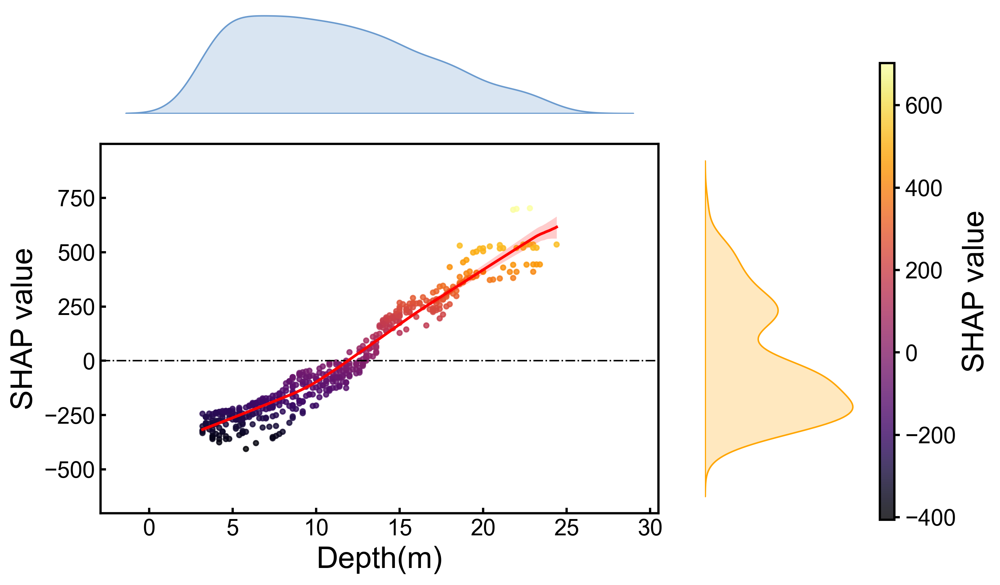

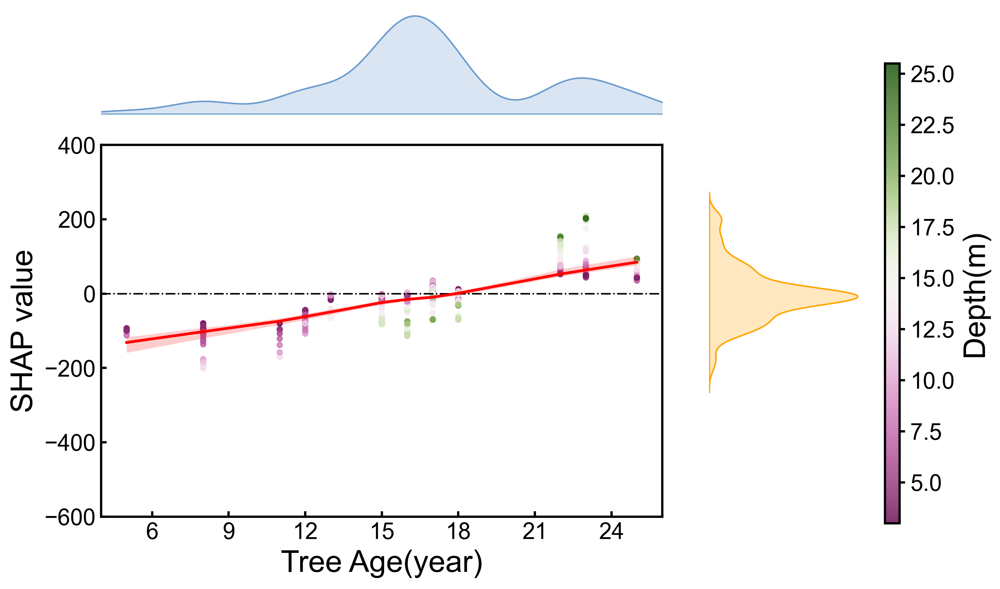

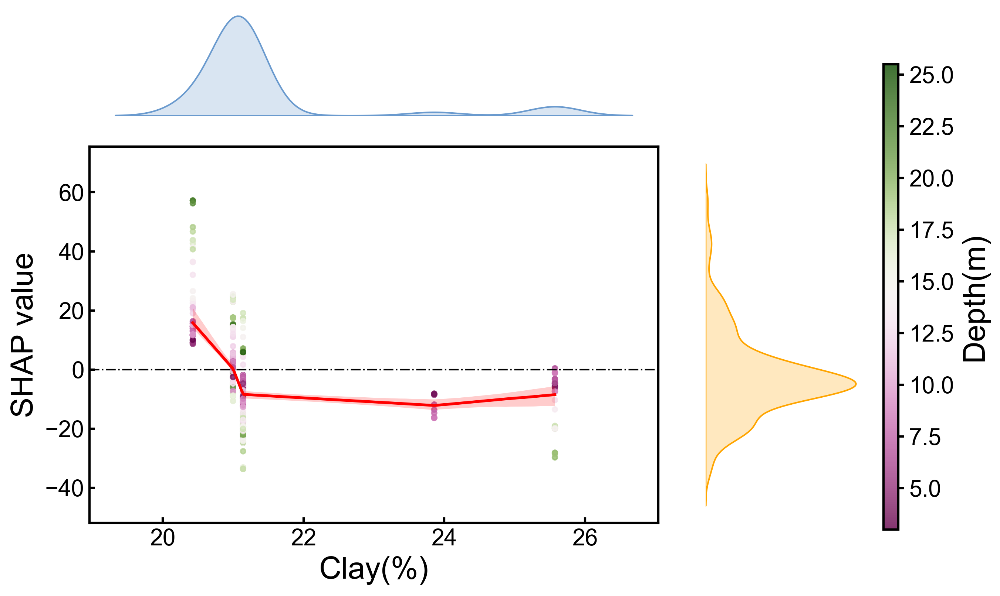

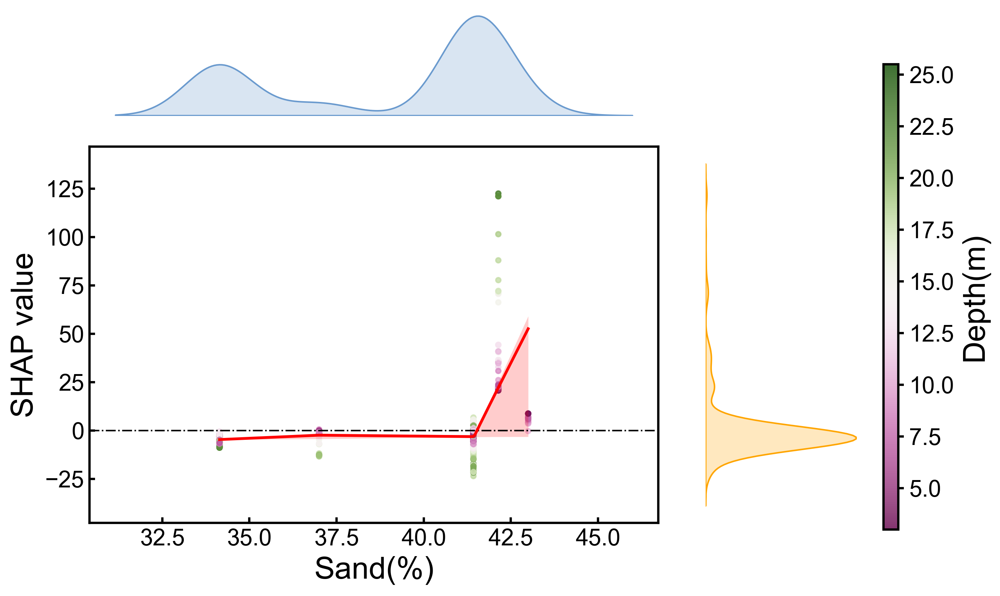

C:\Users\Administrator\miniconda3\envs\jup\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


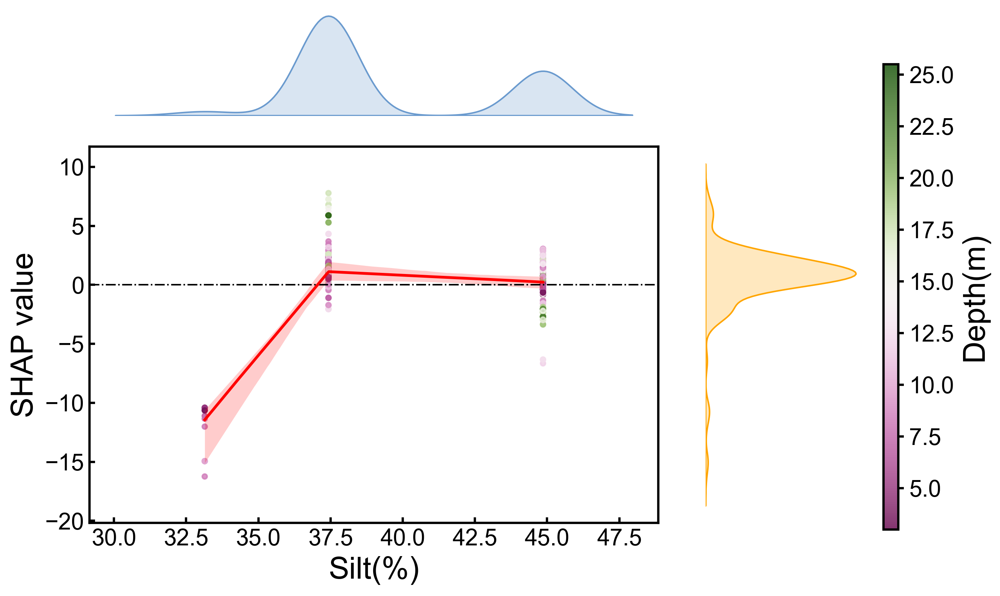

✅ 所有独立图已保存至：C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap


In [2]:
### 20250813以后
import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from matplotlib import gridspec
import matplotlib
from matplotlib.ticker import MaxNLocator
from statsmodels.nonparametric.smoothers_lowess import lowess
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import to_rgba
from scipy.interpolate import UnivariateSpline
from PIL import Image, ImageDraw, ImageFont
import io
from mpl_toolkits.axes_grid1 import make_axes_locatable
# === 设置字体和颜色 ===
matplotlib.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
red_transparent = to_rgba("red", alpha=0.15)

def plot_lowess_with_ci(x, y, ax, n_boot=1000, ci=95, color_line="red", frac=0.7):
    from statsmodels.nonparametric.smoothers_lowess import lowess
    from matplotlib.colors import to_rgba

    x = np.asarray(x)
    y = np.asarray(y)
    mask = ~np.isnan(x) & ~np.isnan(y)
    x = x[mask]
    y = y[mask]

    x_grid = np.linspace(x.min(), x.max(), 200)
    boot_preds = []

    for _ in range(n_boot):
        idx = np.random.choice(len(x), len(x), replace=True)
        x_sample = x[idx]
        y_sample = y[idx]

        try:
            fit = lowess(y_sample, x_sample, frac=frac, return_sorted=True)
            xp, yp = fit[:, 0], fit[:, 1]

            # 排序 + 去重（防止重复 x 导致插值错误）
            order = np.argsort(xp)
            xp = xp[order]
            yp = yp[order]
            xp_unique, indices = np.unique(xp, return_index=True)
            yp_unique = yp[indices]

            interp = np.interp(x_grid, xp_unique, yp_unique)
            boot_preds.append(interp)
        except:
            continue

    boot_preds = np.array(boot_preds)
    if boot_preds.shape[0] < 5:
        return

    low = np.percentile(boot_preds, (100 - ci) / 2, axis=0)
    high = np.percentile(boot_preds, 100 - (100 - ci) / 2, axis=0)
    median = np.median(boot_preds, axis=0)

    # zorder控制图层顺序
    ax.fill_between(x_grid, low, high, color=to_rgba(color_line, 0.2), zorder=1, linewidth=0)
    ax.plot(x_grid, median, color=color_line, lw=1.8, zorder=2)
# === Step 1: 读取数据 ===
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)', 'RDWD','FRLD','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# === Step 4: 训练随机森林回归模型 ===
rfr = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
rfr.fit(x_train, y_train)

# === Step 5: SHAP 分析 ===
explainer = shap.TreeExplainer(rfr)
shap_test = explainer(x_test)
shap_df = pd.DataFrame(shap_test.values, columns=x_test.columns)
X_df = x_test.reset_index(drop=True)

# === 植物种类缩写映射 ===20250826以后
data = {
    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Ulmus pumila L.',
              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco' ],
    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111]
}
df_species = pd.DataFrame(data)
df_species['abbreviation'] = df_species['kinds'].apply(lambda x: x.split()[0][:3])
abbreviations = df_species['abbreviation'].tolist()

# === 颜色映射 ===
cm_data = np.loadtxt(r"C:\Users\Administrator\Desktop\AFM\color\bam.txt") # 假设你下载了 batlow 的 txt 文件
bam_map = LinearSegmentedColormap.from_list('batlow', cm_data)
vmin=3
vmax=25.5
# === 保存路径 ===
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap'
os.makedirs(save_dir, exist_ok=True)
yaxis_limits = {
    'Tree Species': (-300, 200),
    'PET(mm)': (-175, 150),
    'Precipitation(mm)': (-70, 100),
    'Tree Age(year)': (-600, 400),
    'RDWD':(-200,200),
    'FRLD':(-400,400)
}
xaxis_limits = {
    'Tree Species': (100, 112),
    'PET(mm)': (975, 1225),
    'Precipitation(mm)': (400, 700),
    'Tree Age(year)': (4, 26),
    'RDWD':(-1500,12500),
    'FRLD':(-15000,275000)
}
# ===================================
# 第一组：RDWD 和 FRLD → 1行2列
# ===================================
fig, axes = plt.subplots(1, 2, figsize=(18, 6), dpi=900, gridspec_kw={'width_ratios': [1, 1]})
pair_features = ['RDWD', 'FRLD']
pair_labels = ['(a)', '(b)']

for idx, feature in enumerate(pair_features):
    ax_main = axes[idx]
    x_val = X_df[feature]
    shap_val = shap_df[feature]
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        ax_main.set_xlim(xaxis_limits[feature])
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')

    # 科学计数法
    if feature in ['RDWD', 'FRLD']:
        from matplotlib.ticker import ScalarFormatter
        formatter = ScalarFormatter(useMathText=False)
        formatter.set_scientific(True)
        formatter.set_powerlimits((-2, 3))
        ax_main.xaxis.set_major_formatter(formatter)

    # LOWESS 平滑曲线
    plot_lowess_with_ci(x_val, shap_val, ax_main, color_line="red")

    # 密度图（上）
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 密度图（右）
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签 (a), (b)
    ax_main.text(0.02, 0.95, pair_labels[idx], transform=ax_main.transAxes,
                 fontsize=22,  va='top', ha='left')#fontweight='bold',

# 公共 colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
cb = plt.colorbar(scatter, cax=cbar_ax)
cb.set_label('Depth(m)')

plt.tight_layout(rect=[0, 0, 0.9, 1])  # 为 colorbar 留出空间

# 保存图片
save_path = os.path.join(save_dir, "SHAP_RDWD_FRLD_subplot.png")
plt.savefig(save_path, dpi=300)
plt.savefig(save_path.replace('.png', '.pdf'), dpi=300)
plt.show()
print(f"✅ 子图版 SHAP RDWD/FRLD 已保存：{save_path}")
# ===================================
# 第二组：Tree Species, PET, Precip → 3行1列
# ===================================
#trio_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
#trio_labels = ['(c)', '(f)', '(i)']
#trio_images = []
combined_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
labels = ['(c)', '(f)', '(i)']
# 定义子图布局
fig, axes = plt.subplots(3, 1, figsize=(10, 18), dpi=900)
fig.subplots_adjust(wspace=0.3)  # 子图之间间距
# 遍历绘图
for idx, feature in enumerate(combined_features):
    ax_main = axes[idx]
    x_val = X_df[feature]
    shap_val = shap_df[feature]
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')

    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        ax_main.set_xlim(xaxis_limits[feature])
    if feature != 'Tree Species':
        # LOWESS 曲线 + 置信区间
        plot_lowess_with_ci(x_val, shap_val, ax_main, color_line="red")
    else:
        ax_main.set_xlim(99.5, 111.5)
        ax_main.set_xticks(np.arange(100, 112,1))
        ax_main.set_xticklabels(abbreviations, rotation=0)
        #ax_main.xaxis.set_major_locator(MaxNLocator(integer=True)) 
    # 顶部密度图
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 右侧密度图
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签
    ax_main.text(0.02, 0.95, labels[idx], transform=ax_main.transAxes,
                 fontsize=22, va='top', ha='left')  # fontweight='bold'

# 添加统一 colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
cb = fig.colorbar(scatter, cax=cbar_ax)
cb.set_label("Depth(m)")

# 保存图像
fig.savefig(os.path.join(save_dir, "SHAP_combined_1x3_subplots24_withroot.png"), bbox_inches='tight', dpi=300)
plt.show()
# ===================================
# 第三组：其余特征 → 独立保存
# ===================================
other_features = [col for col in x_test.columns if col not in pair_features + combined_features]
figsize = (9, 6)  # 图的尺寸（单位是英寸）
dpi = 300         # 分辨率，常用于论文或高质量图像
for feature in other_features:
    x_val = X_df[feature]
    shap_val = shap_df[feature]

    fig = plt.figure(figsize=figsize, dpi=dpi)
    grid = gridspec.GridSpec(4, 4, hspace=0.3, wspace=0.3)
    main_ax = fig.add_subplot(grid[1:, :-1])

    if feature != 'Depth(m)':
        color_feature = X_df['Depth(m)']
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
        cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        cbar = plt.colorbar(scatter, cax=cbar_ax)
        cbar.set_label('Depth(m)')
        # 设置稀疏的颜色条刻度
        #tick_values = np.linspace(np.nanmin(color_feature), np.nanmax(color_feature), num=5)
        #cbar.set_ticks(tick_values)
    else:
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=shap_val, cmap='inferno', alpha=0.8)
        cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        cbar = plt.colorbar(scatter, cax=cbar_ax)
        cbar.set_label('SHAP value')
        # 设置稀疏的颜色条刻度
        #tick_values = np.linspace(np.nanmin(color_feature), np.nanmax(color_feature), num=5)
        #cbar.set_ticks(tick_values)
    main_ax.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    main_ax.set_xlabel(feature)
    main_ax.tick_params(axis='both')
    main_ax.set_ylabel("SHAP value")
    if feature in yaxis_limits:
        main_ax.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        main_ax.set_xlim(xaxis_limits[feature])
    main_ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='in')

    if feature != 'Tree Species':
        plot_lowess_with_ci(x_val, shap_val, main_ax, color_line="red")
    if feature == 'Tree Age(year)':
        from matplotlib.ticker import MaxNLocator
        main_ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    top_ax = fig.add_subplot(grid[0, :-1], sharex=main_ax)
    sns.kdeplot(x=x_val, ax=top_ax, fill=True, color="#6A9ACE")
    top_ax.axis('off')

    right_ax = fig.add_subplot(grid[1:, -1], sharey=main_ax)
    sns.kdeplot(y=shap_val, ax=right_ax, fill=True, color="orange")
    right_ax.axis('off')

    file_name = f"SHAP_X20_site24withroot_{feature.replace(' ', '_')}.png"
    plt.savefig(os.path.join(save_dir, file_name), format='png', bbox_inches='tight', dpi=dpi)
    plt.show(fig)

print(f"✅ 所有独立图已保存至：{save_dir}")

#### 5.2.3 24个站点+withroot

C:\Users\Administrator\AppData\Local\Temp\ipykernel_25036\1431043636.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x.rename(columns=new_feature_names, inplace=True)


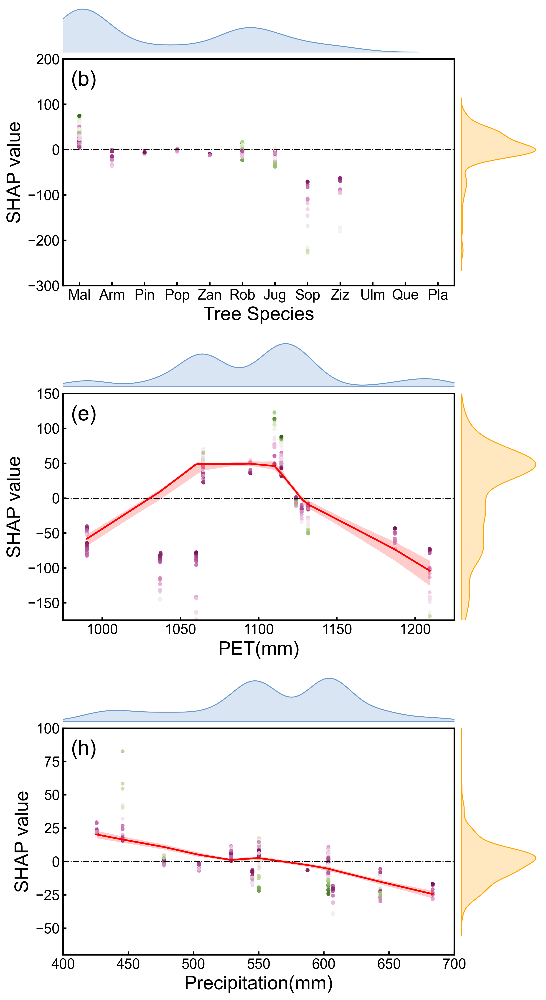

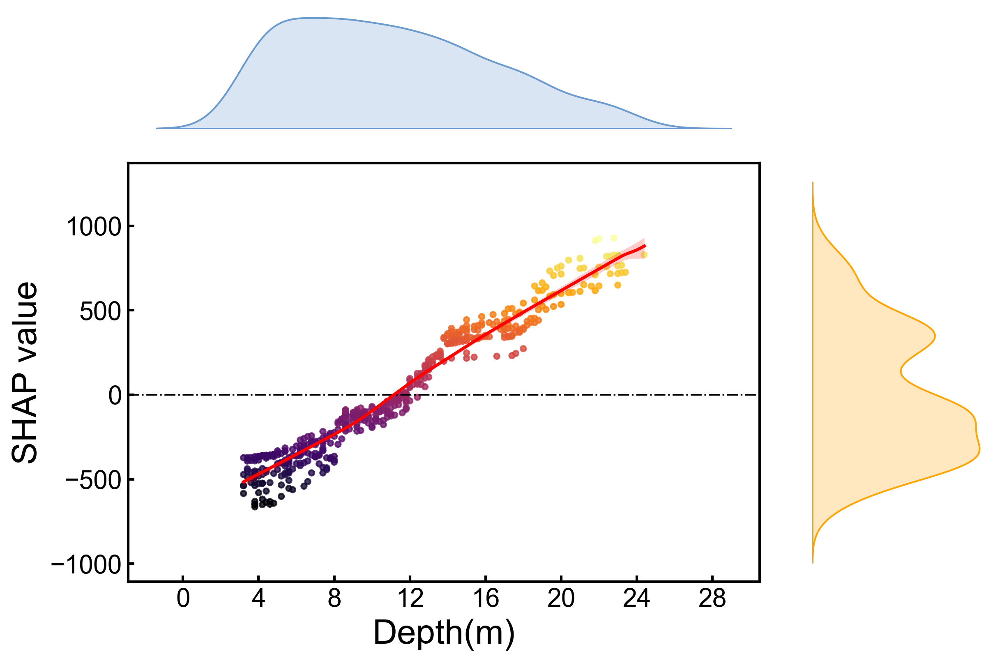

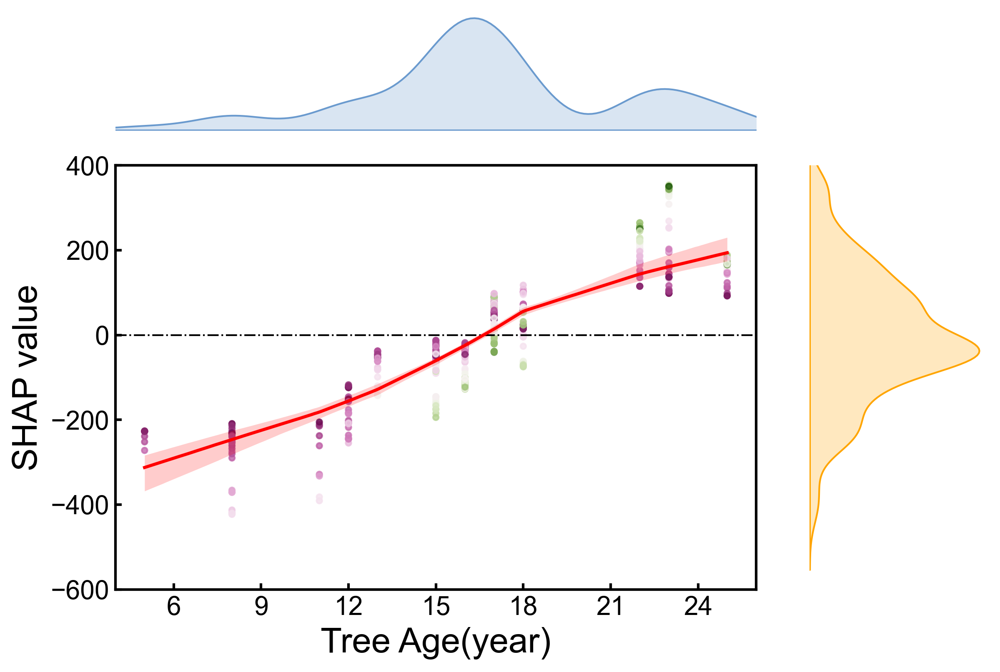

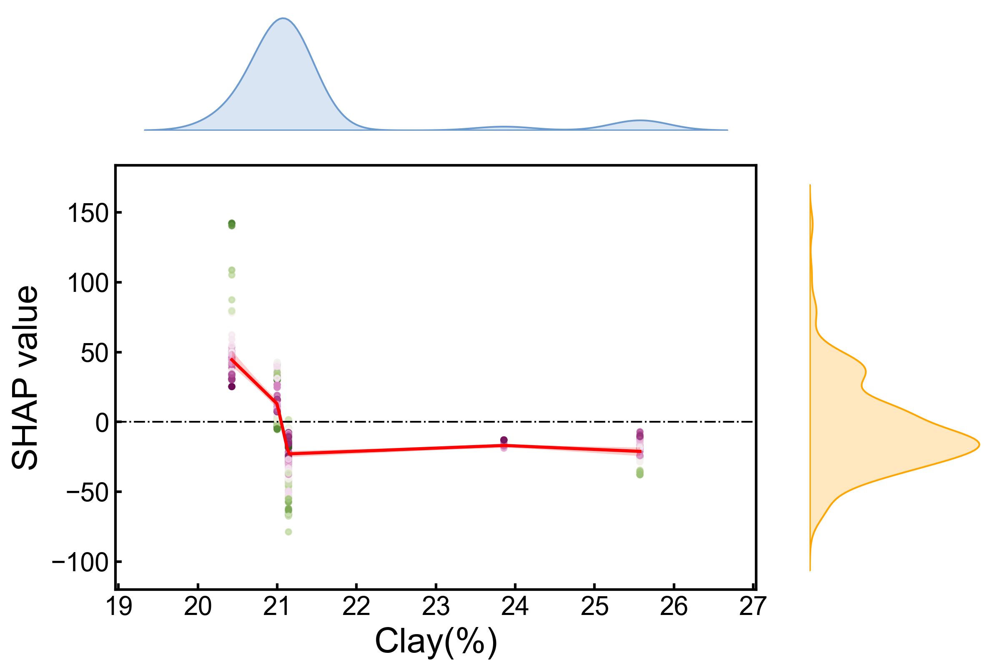

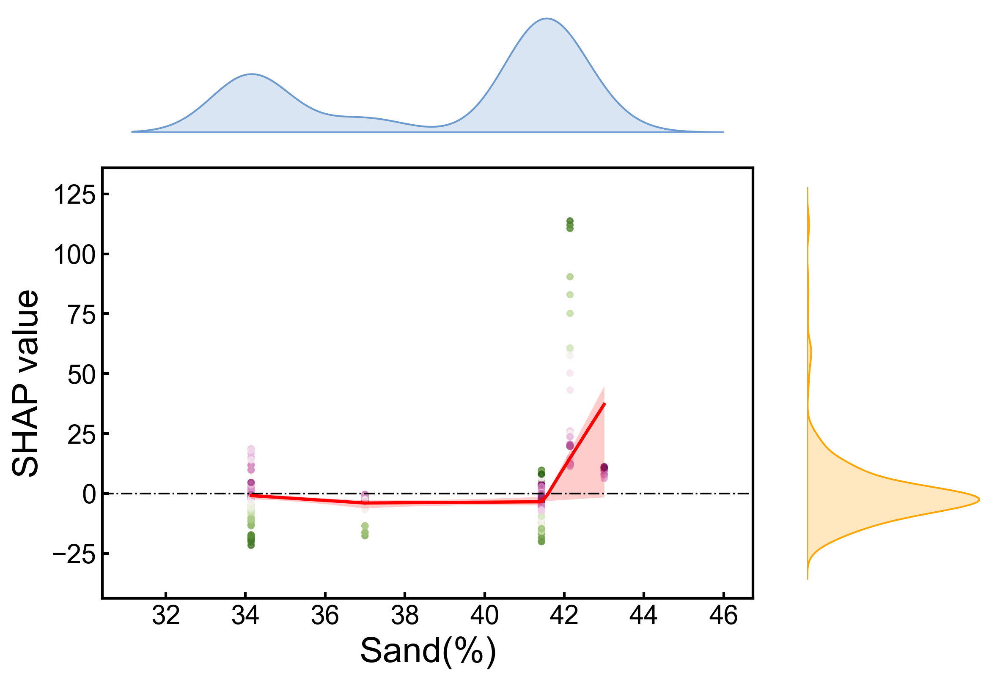

C:\Users\Administrator\miniconda3\envs\jup\lib\site-packages\statsmodels\nonparametric\smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


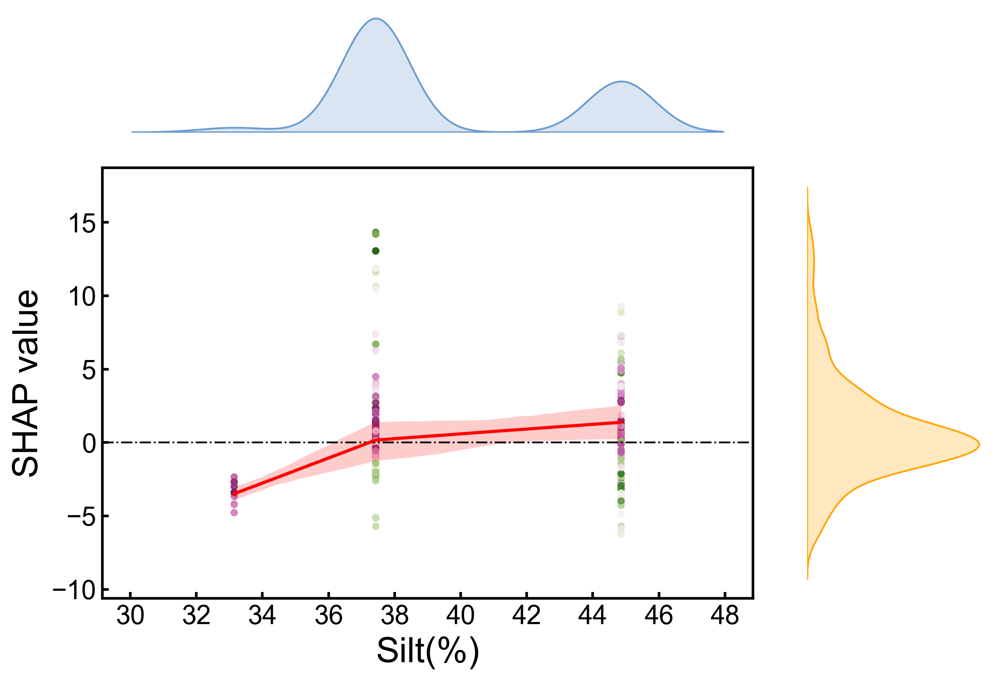

✅ 所有其他特征图已保存至：C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap


In [3]:
###20250813以后
import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from matplotlib import gridspec
import matplotlib
from matplotlib.ticker import MaxNLocator  
from statsmodels.nonparametric.smoothers_lowess import lowess
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import to_rgba
red_transparent = to_rgba("red", alpha=0.15)
from scipy.interpolate import UnivariateSpline
import io
from PIL import Image, ImageDraw, ImageFont
from mpl_toolkits.axes_grid1 import make_axes_locatable
matplotlib.rcParams['font.family'] = 'Arial'  # 设置字体
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# === Step 1: 读取数据 ===
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# === Step 4: 训练随机森林回归模型 ===
rfr = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
rfr.fit(x_train, y_train)

# === Step 5: SHAP 分析 ===
explainer = shap.TreeExplainer(rfr)
shap_test = explainer(x_test)
shap_df = pd.DataFrame(shap_test.values, columns=x_test.columns)
X_df = x_test.reset_index(drop=True)

# === 植物种类缩写映射 ===20250826以后
data = {
    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Ulmus pumila L.',
              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco' ],
    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111]
}
df_species = pd.DataFrame(data)
df_species['abbreviation'] = df_species['kinds'].apply(lambda x: x.split()[0][:3])
abbreviations = df_species['abbreviation'].tolist()

# === 自定义 LOWESS 置信区间函数 ===
def plot_lowess_with_ci(x, y, ax, n_boot=1000, ci=95, color_line="red", frac=0.7):
    from statsmodels.nonparametric.smoothers_lowess import lowess
    from matplotlib.colors import to_rgba

    x = np.asarray(x)
    y = np.asarray(y)
    mask = ~np.isnan(x) & ~np.isnan(y)
    x = x[mask]
    y = y[mask]

    x_grid = np.linspace(x.min(), x.max(), 200)
    boot_preds = []

    for _ in range(n_boot):
        idx = np.random.choice(len(x), len(x), replace=True)
        x_sample = x[idx]
        y_sample = y[idx]

        try:
            fit = lowess(y_sample, x_sample, frac=frac, return_sorted=True)
            xp, yp = fit[:, 0], fit[:, 1]

            # 排序 + 去重（防止重复 x 导致插值错误）
            order = np.argsort(xp)
            xp = xp[order]
            yp = yp[order]
            xp_unique, indices = np.unique(xp, return_index=True)
            yp_unique = yp[indices]

            interp = np.interp(x_grid, xp_unique, yp_unique)
            boot_preds.append(interp)
        except:
            continue

    boot_preds = np.array(boot_preds)
    if boot_preds.shape[0] < 5:
        return

    low = np.percentile(boot_preds, (100 - ci) / 2, axis=0)
    high = np.percentile(boot_preds, 100 - (100 - ci) / 2, axis=0)
    median = np.median(boot_preds, axis=0)

    # zorder控制图层顺序
    ax.fill_between(x_grid, low, high, color=to_rgba(color_line, 0.2), zorder=1, linewidth=0)
    ax.plot(x_grid, median, color=color_line, lw=1.8, zorder=2)

# === 颜色映射 ===
cm_data = np.loadtxt(r"C:\Users\Administrator\Desktop\AFM\color\bam.txt") # 假设你下载了 batlow 的 txt 文件
bam_map = LinearSegmentedColormap.from_list('batlow', cm_data)
vmin=3
vmax=25.5
# === 保存路径 ===
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap'
os.makedirs(save_dir, exist_ok=True)

# 定义子图布局
fig, axes = plt.subplots(3, 1, figsize=(9, 18), dpi=300)
fig.subplots_adjust(wspace=0.3)  # 子图之间间距
yaxis_limits = {
    'Tree Species': (-300, 200),
    'PET(mm)': (-175, 150),
    'Precipitation(mm)': (-70, 100),
    'Tree Age(year)': (-600, 400)
}
xaxis_limits = {
    'Tree Species': (100, 112),
    'PET(mm)': (975, 1225),
    'Precipitation(mm)': (400, 700),
    'Tree Age(year)': (4, 26)
}
combined_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
labels = ['(b)', '(e)', '(h)']

# 遍历绘图
for idx, feature in enumerate(combined_features):
    ax_main = axes[idx]
    x_val = X_df[feature]
    shap_val = shap_df[feature]
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')
    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        ax_main.set_xlim(xaxis_limits[feature])
    if feature != 'Tree Species':
        # LOWESS 曲线 + 置信区间
        plot_lowess_with_ci(x_val, shap_val, ax_main, color_line="red")
    else:
        ax_main.set_xlim(99.5, 111.5)
        ax_main.set_xticks(np.arange(100, 112,1))
        ax_main.set_xticklabels(abbreviations, rotation=0)
        #ax_main.xaxis.set_major_locator(MaxNLocator(integer=True)) 
    # 顶部密度图
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 右侧密度图
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签
    ax_main.text(0.02, 0.95, labels[idx], transform=ax_main.transAxes,
                 fontsize=22, va='top', ha='left')  # fontweight='bold'

# 添加统一 colorbar
#cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
#cb = fig.colorbar(scatter, cax=cbar_ax)
#cb.set_label("Depth(m)")

# 保存图像
fig.savefig(os.path.join(save_dir, "SHAP_combined_1x3_subplots24_withoutroot.png"), bbox_inches='tight', dpi=300)
plt.show()

# === 第三步：生成其余特征的独立图像 ===
other_features = [col for col in x_test.columns if col not in combined_features]
figsize = (9, 6)  # 图的尺寸（单位是英寸）
dpi = 300         # 分辨率，常用于论文或高质量图像
for feature in other_features:
    x_val = X_df[feature]
    shap_val = shap_df[feature]

    fig = plt.figure(figsize=figsize, dpi=dpi)
    grid = gridspec.GridSpec(4, 4, hspace=0.3, wspace=0.3)

    main_ax = fig.add_subplot(grid[1:, :-1])

    if feature != 'Depth(m)':
        color_feature = X_df['Depth(m)']
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=color_feature, cmap=bam_map, alpha=0.8,vmin=vmin,vmax=vmax)
        #cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        #cbar = plt.colorbar(scatter, cax=cbar_ax)
        #cbar.set_label('Depth(m)')
    else:
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=shap_val, cmap='inferno', alpha=0.8)
   #     cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
   #     cbar = plt.colorbar(scatter, cax=cbar_ax)
   #     cbar.set_label('SHAP value')
    main_ax.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    main_ax.set_xlabel(feature)
    main_ax.tick_params(axis='both')
    main_ax.xaxis.set_major_locator(MaxNLocator(integer=False))
    main_ax.set_ylabel("SHAP value")
    main_ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')
    if feature in yaxis_limits:
        main_ax.set_ylim(yaxis_limits[feature])
    if feature in xaxis_limits:
        main_ax.set_xlim(xaxis_limits[feature])
    if feature != 'Tree Species':
        plot_lowess_with_ci(x_val, shap_val, main_ax, color_line="red")
    # 如果是树龄，想用整数刻度可加：
    if feature == 'Tree Age(year)':
        from matplotlib.ticker import MaxNLocator
        main_ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    top_ax = fig.add_subplot(grid[0, :-1], sharex=main_ax)
    sns.kdeplot(x=x_val, ax=top_ax, fill=True, color="#6A9ACE")
    top_ax.axis('off')

    right_ax = fig.add_subplot(grid[1:, -1], sharey=main_ax)
    sns.kdeplot(y=shap_val, ax=right_ax, fill=True, color="orange")
    right_ax.axis('off')

    # 保存独立图
    file_name = f"SHAP_X20_site24_withoutroot_{feature.replace(' ', '_')}.png"
    plt.savefig(os.path.join(save_dir, file_name), format='png', bbox_inches='tight', dpi=dpi)
    plt.show(fig)

print(f"✅ 所有其他特征图已保存至：{save_dir}")

### *整群自举

#### 5.2.1 72个站点（整群自举）

In [ ]:
###20250820以后
import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from matplotlib import gridspec
from matplotlib.ticker import MaxNLocator
from statsmodels.nonparametric.smoothers_lowess import lowess
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import to_rgba
from scipy.interpolate import UnivariateSpline
from PIL import Image, ImageDraw, ImageFont
import io
from mpl_toolkits.axes_grid1 import make_axes_locatable
red_transparent = to_rgba("red", alpha=0.15)
matplotlib.rcParams['font.family'] = 'Arial'  # 设置字体
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 20
# === Step 1: 读取数据 ===
rawdata_path = r'C:\Users\Administrator\Desktop\AFM\data\data.csv'
rawdata2_path = r'C:\Users\Administrator\Desktop\AFM\data\data2.csv'

rawdata = pd.read_csv(rawdata_path, encoding='gbk')
rawdata2 = pd.read_csv(rawdata2_path, encoding='gbk')
rawdata2_row = rawdata2.shape[0]

err = np.empty((0, 13))
for k in range(1, 73):
    site_sum = np.empty((0, 13))
    site = np.empty((0, 4))
    for i in range(rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    df = pd.DataFrame(site)
    site_row = df.shape[0]
    for j in range(site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 13)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2:13] = rawdata.iloc[k - 1, 0:11]
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))

columns = ['y', 'Depth(m)', 'site_ID', 'swp', 'Precipitation(mm)', 'PET(mm)',
           'Clay(%)', 'Sand(%)', 'Silt(%)', 'Tree Age(year)', 'Tree Species', 'Longitude', 'Latitude']

df = pd.DataFrame(err, columns=columns)
#df['site_ID'] = site_ids
x = df[['Depth(m)', 'Precipitation(mm)', 'PET(mm)', 'Clay(%)', 'Sand(%)',
        'Silt(%)', 'Tree Age(year)', 'Tree Species']]
y = df['y']  # 注意符号

# === Step 3: 训练模型 ===
x_train, x_test, y_train, y_test, site_train, site_test = train_test_split(
    x, y, df['site_ID'], test_size=0.3, random_state=42
)

model = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
model.fit(x_train, y_train)

# === Step 5: SHAP 分析 ===
explainer = shap.TreeExplainer(model)
shap_values = explainer(x_test)
shap_df = pd.DataFrame(shap_values.values, columns=x_test.columns)
X_df = x_test.reset_index(drop=True)
site_ids_test = site_test.reset_index(drop=True)

# === 植物种类缩写映射 ===
data = {
    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Amygdalus persica L.',
              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco', 'Ulmus pumila L.'],
    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
}
df_species = pd.DataFrame(data)
df_species['abbreviation'] = df_species['kinds'].apply(lambda x: x.split()[0][:3])
abbreviations = df_species['abbreviation'].tolist()

# === 自定义 LOWESS 置信区间函数 ===
def plot_lowess_with_cluster_bootstrap(x, y, site_ids, ax, n_boot=500, ci=95, color_line="red", frac=0.7):
    sorted_idx = np.argsort(x)
    x_sorted = np.array(x)[sorted_idx]
    y_sorted = np.array(y)[sorted_idx]
    lowess_fit = lowess(y_sorted, x_sorted, frac=frac, return_sorted=True)
    ax.plot(lowess_fit[:, 0], lowess_fit[:, 1], color=color_line, lw=2)

    df_all = pd.DataFrame({'x': x, 'y': y, 'site': site_ids})
    unique_sites = df_all['site'].unique()
    boot_preds = []

    for _ in range(n_boot):
        sampled_sites = np.random.choice(unique_sites, size=len(unique_sites), replace=True)
        boot_df = pd.concat([df_all[df_all['site'] == sid] for sid in sampled_sites], ignore_index=True)
        lowess_boot = lowess(boot_df['y'], boot_df['x'], frac=frac, return_sorted=False)
        interp = np.interp(x_sorted, np.sort(boot_df['x']), lowess_boot[np.argsort(boot_df['x'])])
        boot_preds.append(interp)

    boot_preds = np.array(boot_preds)
    lower = np.percentile(boot_preds, (100 - ci) / 2, axis=0)
    upper = np.percentile(boot_preds, 100 - (100 - ci) / 2, axis=0)
    ax.fill_between(x_sorted, lower, upper, color=red_transparent, alpha=0.2)

# === 颜色映射 ===
cmap1 = LinearSegmentedColormap.from_list("pinkblue", ["#00bfff", "#ffffff", "#ff1493"])
vmin=3
vmax=25.5
# === 保存路径 ===
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap'
os.makedirs(save_dir, exist_ok=True)

# 定义子图布局
fig, axes = plt.subplots(3, 1, figsize=(9, 18), dpi=300)
fig.subplots_adjust(wspace=0.3)  # 子图之间间距
yaxis_limits = {
    'Tree Species': (-300, 200),
    'PET(mm)': (-250, 200),
    'Precipitation(mm)': (-70, 100),
    'Tree Age(year)': (-600, 400)
}
combined_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
labels = ['(a)', '(d)', '(g)']

# 遍历绘图
for idx, feature in enumerate(combined_features):
    ax_main = axes[idx]
    x_val = X_df[feature].values
    shap_val = shap_df[feature].values
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=cmap1, alpha=0.8,vmin=vmin,vmax=vmax)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')

    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature != 'Tree Species':
        # LOWESS 曲线 + 置信区间
        plot_lowess_with_cluster_bootstrap(x_val, shap_val, site_ids_test,ax_main, color_line="red")
    else:
        ax_main.set_xlim(99.5, 112.5)
        ax_main.set_xticks(np.arange(100, 113,1))
        ax_main.set_xticklabels(abbreviations, rotation=0)
        #ax_main.xaxis.set_major_locator(MaxNLocator(integer=True)) 
    # 顶部密度图
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 右侧密度图
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签
    ax_main.text(0.02, 0.95, labels[idx], transform=ax_main.transAxes,
                 fontsize=22, va='top', ha='left')  # fontweight='bold'

# 添加统一 colorbar
#cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
#cb = fig.colorbar(scatter, cax=cbar_ax)
#cb.set_label("Depth(m)")

# 保存图像
fig.savefig(os.path.join(save_dir, "SHAP_combined_1x3_subplots72.png"), bbox_inches='tight', dpi=300)
plt.show()

# === 第三步：生成其余特征的独立图像 ===
other_features = [col for col in x_test.columns if col not in combined_features]
figsize = (9, 6)  # 图的尺寸（单位是英寸）
dpi = 300         # 分辨率，常用于论文或高质量图像
for feature in other_features:
    x_val = X_df[feature].values
    shap_val = shap_df[feature].values

    fig = plt.figure(figsize=figsize, dpi=dpi)
    grid = gridspec.GridSpec(4, 4, hspace=0.3, wspace=0.3)

    main_ax = fig.add_subplot(grid[1:, :-1])

    if feature != 'Depth(m)':
        color_feature = X_df['Depth(m)']
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=color_feature, cmap=cmap1, alpha=0.8,vmin=vmin,vmax=vmax)
        cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        cbar = plt.colorbar(scatter, cax=cbar_ax)
        cbar.set_label('Depth(m)')
    else:
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=shap_val, cmap='inferno', alpha=0.8)
     #   cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
     #   cbar = plt.colorbar(scatter, cax=cbar_ax)
     #   cbar.set_label('SHAP value')

    main_ax.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    main_ax.set_xlabel(feature)
    main_ax.tick_params(axis='both')
    main_ax.xaxis.set_major_locator(MaxNLocator(integer=False))
    main_ax.set_ylabel("SHAP value")
    if feature in yaxis_limits:
        main_ax.set_ylim(yaxis_limits[feature])  # ✅ 限制 y 轴范围
    main_ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='out')

    if feature != 'Tree Species':
        plot_lowess_with_cluster_bootstrap(x_val, shap_val, site_ids_test,main_ax, color_line="red")

    top_ax = fig.add_subplot(grid[0, :-1], sharex=main_ax)
    sns.kdeplot(x=x_val, ax=top_ax, fill=True, color="#6A9ACE")
    top_ax.axis('off')

    right_ax = fig.add_subplot(grid[1:, -1], sharey=main_ax)
    sns.kdeplot(y=shap_val, ax=right_ax, fill=True, color="orange")
    right_ax.axis('off')

    # 保存独立图
    file_name = f"SHAP_X20_site72_{feature.replace(' ', '_')}.png"
    plt.savefig(os.path.join(save_dir, file_name), format='png', bbox_inches='tight', dpi=300)
    plt.show(fig)

print(f"✅ 所有其他特征图已保存至：{save_dir}")

#### 5.2.2 24个站点+withoutroot（整群自举）

In [ ]:
###20250820以后
import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from matplotlib import gridspec
from matplotlib.ticker import MaxNLocator
from statsmodels.nonparametric.smoothers_lowess import lowess
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import to_rgba
from scipy.interpolate import UnivariateSpline
from PIL import Image, ImageDraw, ImageFont
import io
from mpl_toolkits.axes_grid1 import make_axes_locatable
red_transparent = to_rgba("red", alpha=0.15)
matplotlib.rcParams['font.family'] = 'Arial'  # 设置字体
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 20
# === Step 1: 读取数据 ===
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
from sklearn.model_selection import train_test_split
err = np.empty((0, 21))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 21))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 21))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:21] = rawdata.iloc[row_indices, 0:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
columns = ['y','Depth(m)','RDWD','FRLD','site_ID',
           'Tree Species','Latitude','Longitude','Tree Age(year)','P(mm yr-1)','Precipitation(mm)',
            'Planting density(plants/ha)','Root deepening rate(m yr-1)','Maximum rooting depth(m)',
             'PET(mm)','Clay(%)','Sand(%)','Silt(%)','root biomass C input in shallow soil(Mg ha-1)',
             'root biomass C input in deep soil(Mg ha-1)','C% in deep soil']

df = pd.DataFrame(err, columns=columns)
x = df[['Depth(m)', 'Precipitation(mm)', 'PET(mm)', 'Clay(%)', 'Sand(%)',
        'Silt(%)', 'Tree Age(year)', 'Tree Species']]
y = df['y']  # 注意符号

# === Step 3: 训练模型 ===
x_train, x_test, y_train, y_test, site_train, site_test = train_test_split(
    x, y, df['site_ID'], test_size=0.3, random_state=42
)

model = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
model.fit(x_train, y_train)

# === Step 5: SHAP 分析 ===
explainer = shap.TreeExplainer(model)
shap_values = explainer(x_test)
shap_df = pd.DataFrame(shap_values.values, columns=x_test.columns)
X_df = x_test.reset_index(drop=True)
site_ids_test = site_test.reset_index(drop=True)

# === 植物种类缩写映射 ===
data = {
    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Amygdalus persica L.',
              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco', 'Ulmus pumila L.'],
    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
}
df_species = pd.DataFrame(data)
df_species['abbreviation'] = df_species['kinds'].apply(lambda x: x.split()[0][:3])
abbreviations = df_species['abbreviation'].tolist()

# === 自定义 LOWESS 置信区间函数 ===
def plot_lowess_with_cluster_bootstrap(x, y, site_ids, ax, n_boot=500, ci=95, color_line="red", frac=0.7):
    sorted_idx = np.argsort(x)
    x_sorted = np.array(x)[sorted_idx]
    y_sorted = np.array(y)[sorted_idx]
    lowess_fit = lowess(y_sorted, x_sorted, frac=frac, return_sorted=True)
    ax.plot(lowess_fit[:, 0], lowess_fit[:, 1], color=color_line, lw=2)

    df_all = pd.DataFrame({'x': x, 'y': y, 'site': site_ids})
    unique_sites = df_all['site'].unique()
    boot_preds = []

    for _ in range(n_boot):
        sampled_sites = np.random.choice(unique_sites, size=len(unique_sites), replace=True)
        boot_df = pd.concat([df_all[df_all['site'] == sid] for sid in sampled_sites], ignore_index=True)
        lowess_boot = lowess(boot_df['y'], boot_df['x'], frac=frac, return_sorted=False)
        interp = np.interp(x_sorted, np.sort(boot_df['x']), lowess_boot[np.argsort(boot_df['x'])])
        boot_preds.append(interp)

    boot_preds = np.array(boot_preds)
    lower = np.percentile(boot_preds, (100 - ci) / 2, axis=0)
    upper = np.percentile(boot_preds, 100 - (100 - ci) / 2, axis=0)
    ax.fill_between(x_sorted, lower, upper, color=red_transparent, alpha=0.2)

# === 颜色映射 ===
cmap1 = LinearSegmentedColormap.from_list("pinkblue", ["#00bfff", "#ffffff", "#ff1493"])
vmin=3
vmax=25.5
# === 保存路径 ===
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap'
os.makedirs(save_dir, exist_ok=True)

# 定义子图布局
fig, axes = plt.subplots(3, 1, figsize=(9, 18), dpi=300)
fig.subplots_adjust(wspace=0.3)  # 子图之间间距
yaxis_limits = {
    'Tree Species': (-300, 200),
    'PET(mm)': (-250, 200),
    'Precipitation(mm)': (-70, 100),
    'Tree Age(year)': (-600, 400)
}
combined_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
labels = ['(a)', '(d)', '(g)']

# 遍历绘图
for idx, feature in enumerate(combined_features):
    ax_main = axes[idx]
    x_val = X_df[feature].values
    shap_val = shap_df[feature].values
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=cmap1, alpha=0.8,vmin=vmin,vmax=vmax)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')

    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature != 'Tree Species':
        # LOWESS 曲线 + 置信区间
        plot_lowess_with_cluster_bootstrap(x_val, shap_val, site_ids_test,ax_main, color_line="red")
    else:
        ax_main.set_xlim(99.5, 112.5)
        ax_main.set_xticks(np.arange(100, 113,1))
        ax_main.set_xticklabels(abbreviations, rotation=0)
        #ax_main.xaxis.set_major_locator(MaxNLocator(integer=True)) 
    # 顶部密度图
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 右侧密度图
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签
    ax_main.text(0.02, 0.95, labels[idx], transform=ax_main.transAxes,
                 fontsize=22, va='top', ha='left')  # fontweight='bold'

# 添加统一 colorbar
#cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
#cb = fig.colorbar(scatter, cax=cbar_ax)
#cb.set_label("Depth(m)")

# 保存图像
fig.savefig(os.path.join(save_dir, "SHAP_combined_1x3_subplots24_withoutroot.png"), bbox_inches='tight', dpi=300)
plt.show()

# === 第三步：生成其余特征的独立图像 ===
other_features = [col for col in x_test.columns if col not in combined_features]
figsize = (9, 6)  # 图的尺寸（单位是英寸）
dpi = 300         # 分辨率，常用于论文或高质量图像
for feature in other_features:
    x_val = X_df[feature].values
    shap_val = shap_df[feature].values

    fig = plt.figure(figsize=figsize, dpi=dpi)
    grid = gridspec.GridSpec(4, 4, hspace=0.3, wspace=0.3)

    main_ax = fig.add_subplot(grid[1:, :-1])

    if feature != 'Depth(m)':
        color_feature = X_df['Depth(m)']
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=color_feature, cmap=cmap1, alpha=0.8,vmin=vmin,vmax=vmax)
        cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        cbar = plt.colorbar(scatter, cax=cbar_ax)
        cbar.set_label('Depth(m)')
    else:
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=shap_val, cmap='inferno', alpha=0.8)
     #   cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
     #   cbar = plt.colorbar(scatter, cax=cbar_ax)
     #   cbar.set_label('SHAP value')

    main_ax.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    main_ax.set_xlabel(feature)
    main_ax.tick_params(axis='both')
    main_ax.xaxis.set_major_locator(MaxNLocator(integer=False))
    main_ax.set_ylabel("SHAP value")
    if feature in yaxis_limits:
        main_ax.set_ylim(yaxis_limits[feature])  # ✅ 限制 y 轴范围
    main_ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='out')

    if feature != 'Tree Species':
        plot_lowess_with_cluster_bootstrap(x_val, shap_val, site_ids_test,main_ax, color_line="red")

    top_ax = fig.add_subplot(grid[0, :-1], sharex=main_ax)
    sns.kdeplot(x=x_val, ax=top_ax, fill=True, color="#6A9ACE")
    top_ax.axis('off')

    right_ax = fig.add_subplot(grid[1:, -1], sharey=main_ax)
    sns.kdeplot(y=shap_val, ax=right_ax, fill=True, color="orange")
    right_ax.axis('off')

    # 保存独立图
    file_name = f"SHAP_X20_site24_withoutroot_{feature.replace(' ', '_')}.png"
    plt.savefig(os.path.join(save_dir, file_name), format='png', bbox_inches='tight', dpi=300)
    plt.show(fig)
print(f"✅ 所有其他特征图已保存至：{save_dir}")

#### 5.2.3 24个站点+withroot（整群自举）

In [ ]:
###20250820以后
import os
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from matplotlib import gridspec
from matplotlib.ticker import MaxNLocator
from statsmodels.nonparametric.smoothers_lowess import lowess
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import to_rgba
from scipy.interpolate import UnivariateSpline
from PIL import Image, ImageDraw, ImageFont
import io
from mpl_toolkits.axes_grid1 import make_axes_locatable
red_transparent = to_rgba("red", alpha=0.15)
matplotlib.rcParams['font.family'] = 'Arial'  # 设置字体
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 20
# === Step 1: 读取数据 ===
rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
from sklearn.model_selection import train_test_split
err = np.empty((0, 21))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 21))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 21))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:21] = rawdata.iloc[row_indices, 0:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
columns = ['y','Depth(m)','RDWD','FRLD','site_ID',
           'Tree Species','Latitude','Longitude','Tree Age(year)','P(mm yr-1)','Precipitation(mm)',
            'Planting density(plants/ha)','Root deepening rate(m yr-1)','Maximum rooting depth(m)',
             'PET(mm)','Clay(%)','Sand(%)','Silt(%)','root biomass C input in shallow soil(Mg ha-1)',
             'root biomass C input in deep soil(Mg ha-1)','C% in deep soil']

df = pd.DataFrame(err, columns=columns)
x = df[['Depth(m)', 'RDWD','FRLD','Precipitation(mm)', 'PET(mm)', 'Clay(%)', 'Sand(%)',
        'Silt(%)', 'Tree Age(year)', 'Tree Species']]
y = df['y']  # 注意符号

# === Step 3: 训练模型 ===
x_train, x_test, y_train, y_test, site_train, site_test = train_test_split(
    x, y, df['site_ID'], test_size=0.3, random_state=42
)

model = RandomForestRegressor(
    random_state=42,
    n_estimators=60,
    max_features=4,
    min_samples_leaf=1,
    min_samples_split=2,
    max_depth=5
)
model.fit(x_train, y_train)

# === Step 5: SHAP 分析 ===
explainer = shap.TreeExplainer(model)
shap_values = explainer(x_test)
shap_df = pd.DataFrame(shap_values.values, columns=x_test.columns)
X_df = x_test.reset_index(drop=True)
site_ids_test = site_test.reset_index(drop=True)

# === 植物种类缩写映射 ===
data = {
    'kinds': ['Malus pumila Mill.', 'Armeniaca vulgaris Lam.', 'Pinus tabulaeformis Carr.',
              'Populus tomentosa Carr.', 'Zanthoxylum bungeanum Maxim.', 'Robinia pseudoacacia Linn.',
              'Juglans regia Linn.', 'Sophora japonica L.', 'Ziziphus jujuba Mill.', 'Amygdalus persica L.',
              'Quercus wutaihanica Blume', 'Platycladus orientalis (Linn.) Franco', 'Ulmus pumila L.'],
    '标注': [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112]
}
df_species = pd.DataFrame(data)
df_species['abbreviation'] = df_species['kinds'].apply(lambda x: x.split()[0][:3])
abbreviations = df_species['abbreviation'].tolist()

# === 自定义 LOWESS 置信区间函数 ===
def plot_lowess_with_cluster_bootstrap(x, y, site_ids, ax, n_boot=500, ci=95, color_line="red", frac=0.7):
    sorted_idx = np.argsort(x)
    x_sorted = np.array(x)[sorted_idx]
    y_sorted = np.array(y)[sorted_idx]
    lowess_fit = lowess(y_sorted, x_sorted, frac=frac, return_sorted=True)
    ax.plot(lowess_fit[:, 0], lowess_fit[:, 1], color=color_line, lw=2)

    df_all = pd.DataFrame({'x': x, 'y': y, 'site': site_ids})
    unique_sites = df_all['site'].unique()
    boot_preds = []

    for _ in range(n_boot):
        sampled_sites = np.random.choice(unique_sites, size=len(unique_sites), replace=True)
        boot_df = pd.concat([df_all[df_all['site'] == sid] for sid in sampled_sites], ignore_index=True)
        lowess_boot = lowess(boot_df['y'], boot_df['x'], frac=frac, return_sorted=False)
        interp = np.interp(x_sorted, np.sort(boot_df['x']), lowess_boot[np.argsort(boot_df['x'])])
        boot_preds.append(interp)

    boot_preds = np.array(boot_preds)
    lower = np.percentile(boot_preds, (100 - ci) / 2, axis=0)
    upper = np.percentile(boot_preds, 100 - (100 - ci) / 2, axis=0)
    ax.fill_between(x_sorted, lower, upper, color=red_transparent, alpha=0.2)

# === 颜色映射 ===
cmap1 = LinearSegmentedColormap.from_list("pinkblue", ["#00bfff", "#ffffff", "#ff1493"])
vmin=3
vmax=25.5
# === 保存路径 ===
save_dir = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap'
os.makedirs(save_dir, exist_ok=True)

# ===================================
# 第一组：RDWD 和 FRLD → 1行2列
# ===================================
fig, axes = plt.subplots(1, 2, figsize=(18, 6), dpi=900, gridspec_kw={'width_ratios': [1, 1]})
pair_features = ['RDWD', 'FRLD']
pair_labels = ['(a)', '(b)']

for idx, feature in enumerate(pair_features):
    ax_main = axes[idx]
    x_val = X_df[feature]
    shap_val = shap_df[feature]
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=cmap1, alpha=0.8)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')

    # 科学计数法
    if feature in ['RDWD', 'FRLD']:
        from matplotlib.ticker import ScalarFormatter
        formatter = ScalarFormatter(useMathText=False)
        formatter.set_scientific(True)
        formatter.set_powerlimits((-2, 3))
        ax_main.xaxis.set_major_formatter(formatter)

    # LOWESS 平滑曲线
    plot_lowess_with_cluster_bootstrap(x_val, shap_val, site_ids_test,ax_main, color_line="red")

    # 密度图（上）
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 密度图（右）
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签 (a), (b)
    ax_main.text(0.02, 0.95, pair_labels[idx], transform=ax_main.transAxes,
                 fontsize=22,  va='top', ha='left')#fontweight='bold',

# 公共 colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
cb = plt.colorbar(scatter, cax=cbar_ax)
cb.set_label('Depth(m)')

plt.tight_layout(rect=[0, 0, 0.9, 1])  # 为 colorbar 留出空间

# 保存图片
save_path = os.path.join(save_dir, "SHAP_RDWD_FRLD_subplot.png")
plt.savefig(save_path, dpi=900)
plt.savefig(save_path.replace('.png', '.pdf'), dpi=300)
plt.show()
print(f"✅ 子图版 SHAP RDWD/FRLD 已保存：{save_path}")
# ===================================
# 第二组：Tree Species, PET, Precip → 3行1列
# ===================================
#trio_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
#trio_labels = ['(c)', '(f)', '(i)']
#trio_images = []
combined_features = ['Tree Species', 'PET(mm)', 'Precipitation(mm)']
labels = ['(c)', '(f)', '(i)']
# 定义子图布局
fig, axes = plt.subplots(3, 1, figsize=(10, 18), dpi=900)
fig.subplots_adjust(wspace=0.3)  # 子图之间间距
yaxis_limits = {
    'Tree Species': (-300, 200),
    'PET(mm)': (-250, 200),
    'Precipitation(mm)': (-70, 100),
    'Tree Age(year)': (-600, 400)
}
# 遍历绘图
for idx, feature in enumerate(combined_features):
    ax_main = axes[idx]
    x_val = X_df[feature]
    shap_val = shap_df[feature]
    color_feature = X_df['Depth(m)']

    # 主图 scatter
    scatter = ax_main.scatter(x_val, shap_val, s=10, c=color_feature, cmap=cmap1, alpha=0.8,vmin=vmin,vmax=vmax)
    ax_main.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    ax_main.set_xlabel(feature)
    ax_main.set_ylabel("SHAP value")
    ax_main.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                        labelbottom=True, labelleft=True, direction='in')

    if feature in yaxis_limits:
        ax_main.set_ylim(yaxis_limits[feature])
    if feature != 'Tree Species':
        # LOWESS 曲线 + 置信区间
        plot_lowess_with_cluster_bootstrap(x_val, shap_val, site_ids_test,ax_main, color_line="red")
    else:
        ax_main.set_xlim(99.5, 112.5)
        ax_main.set_xticks(np.arange(100, 113,1))
        ax_main.set_xticklabels(abbreviations, rotation=0)
        #ax_main.xaxis.set_major_locator(MaxNLocator(integer=True)) 
    # 顶部密度图
    divider = make_axes_locatable(ax_main)
    ax_top = divider.append_axes("top", size="20%", pad=0.1, sharex=ax_main)
    sns.kdeplot(x=x_val, ax=ax_top, fill=True, color="#6A9ACE")
    ax_top.axis('off')

    # 右侧密度图
    ax_right = divider.append_axes("right", size="20%", pad=0.1, sharey=ax_main)
    sns.kdeplot(y=shap_val, ax=ax_right, fill=True, color="orange")
    ax_right.axis('off')

    # 添加子图标签
    ax_main.text(0.02, 0.95, labels[idx], transform=ax_main.transAxes,
                 fontsize=22, va='top', ha='left')  # fontweight='bold'

# 添加统一 colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
cb = fig.colorbar(scatter, cax=cbar_ax)
cb.set_label("Depth(m)")

# 保存图像
fig.savefig(os.path.join(save_dir, "SHAP_combined_1x3_subplots24_withroot.png"), bbox_inches='tight', dpi=300)
plt.show()
# ===================================
# 第三组：其余特征 → 独立保存
# ===================================
other_features = [col for col in x_test.columns if col not in pair_features + combined_features]
figsize = (9, 6)  # 图的尺寸（单位是英寸）
dpi = 300         # 分辨率，常用于论文或高质量图像
for feature in other_features:
    x_val = X_df[feature]
    shap_val = shap_df[feature]

    fig = plt.figure(figsize=figsize, dpi=dpi)
    grid = gridspec.GridSpec(4, 4, hspace=0.3, wspace=0.3)
    main_ax = fig.add_subplot(grid[1:, :-1])

    if feature != 'Depth(m)':
        color_feature = X_df['Depth(m)']
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=color_feature, cmap=cmap1, alpha=0.8,vmin=vmin,vmax=vmax)
        cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        cbar = plt.colorbar(scatter, cax=cbar_ax)
        cbar.set_label('Depth(m)')
        # 设置稀疏的颜色条刻度
        #tick_values = np.linspace(np.nanmin(color_feature), np.nanmax(color_feature), num=5)
        #cbar.set_ticks(tick_values)
    else:
        scatter = main_ax.scatter(x_val, shap_val, s=10, c=shap_val, cmap='inferno', alpha=0.8)
        cbar_ax = fig.add_axes([0.92, 0.10, 0.015, 0.7])
        cbar = plt.colorbar(scatter, cax=cbar_ax)
        cbar.set_label('SHAP value')
        # 设置稀疏的颜色条刻度
        #tick_values = np.linspace(np.nanmin(color_feature), np.nanmax(color_feature), num=5)
        #cbar.set_ticks(tick_values)
    main_ax.axhline(y=0, color='black', linestyle='-.', linewidth=1)
    main_ax.set_xlabel(feature)
    main_ax.tick_params(axis='both')
    main_ax.set_ylabel("SHAP value")
    if feature in yaxis_limits:
        main_ax.set_ylim(yaxis_limits[feature])
    main_ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='in')

    if feature != 'Tree Species':
        plot_lowess_with_cluster_bootstrap(x_val, shap_val, site_ids_test,main_ax, color_line="red")

    top_ax = fig.add_subplot(grid[0, :-1], sharex=main_ax)
    sns.kdeplot(x=x_val, ax=top_ax, fill=True, color="#6A9ACE")
    top_ax.axis('off')

    right_ax = fig.add_subplot(grid[1:, -1], sharey=main_ax)
    sns.kdeplot(y=shap_val, ax=right_ax, fill=True, color="orange")
    right_ax.axis('off')

    file_name = f"SHAP_X20_site24withroot_{feature.replace(' ', '_')}.png"
    plt.savefig(os.path.join(save_dir, file_name), format='png', bbox_inches='tight', dpi=dpi)
    plt.show()

print(f"✅ 所有独立图已保存至：{save_dir}")

## 5.3 两个因素作用

### 5.3.1 72个站点

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn import tree
from scipy.stats import randint
from sklearn.inspection import PartialDependenceDisplay
from sklearn.tree import export_graphviz
import shap
import os

# Set default font to Times New Roman
plt.rcParams['font.family'] = 'Arial'

# === 读取并处理数据 ===
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')
rawdata2_row = np.size(rawdata2, 0)

err = np.empty((0, 11))
for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    df = pd.DataFrame(site)
    site_row = df.shape[0]
    for j in range(site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 11)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k - 1, 2:11]
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))

err = pd.DataFrame(err)
x = err.iloc[:, 1:11]
y = -err.iloc[:, 0]

# 特征命名
feature_name_map = {
    1: 'Depth(m)',
    2: 'Precipitation(mm)',
    3: 'PET(mm)',
    4: 'Clay(%)',
    5: 'Sand(%)',
    6: 'Silt(%)',
    7: 'Tree Age(year)',
    8: 'Tree species',
    9: 'Longitude',
    10:'Latitude'
}
x = x.rename(columns=feature_name_map)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# === 训练模型 ===
model = RandomForestRegressor(random_state=42,n_estimators=150,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=6)
model.fit(x_train, y_train)

# === 计算 SHAP 交互作用值 ===
explainer = shap.TreeExplainer(model)
interaction_values = explainer.shap_interaction_values(x_test)
mean_interaction = np.abs(interaction_values).mean(axis=0)

# === 上三角圆圈图可视化 ===
# === 上三角改为下三角图，排除对角线 ===
plt.figure(figsize=(8, 6))
features = x.columns
n = len(features)

for i in range(n):
    for j in range(i):
        size = mean_interaction[i, j]
        color = mean_interaction[i, j]
        plt.scatter(j, n - 1 - i, s=size * 7, c=color, cmap='RdBu',
                    vmin=0, vmax=np.max(mean_interaction), edgecolors='black')

# 设置刻度与标签
plt.xticks(ticks=range(n), labels=features, rotation=90, fontsize=12)
plt.yticks(ticks=range(n), labels=features[::-1], fontsize=12)
cbar = plt.colorbar(label='mean(|SHAP interaction value|)')
cbar.ax.tick_params(labelsize=12)  # 调整 colorbar 刻度字体
#plt.title('SHAP Interaction Values (Lower Triangle)', fontsize=14)
cbar.set_label('mean(|SHAP interaction value|)', fontsize=14)  # 调整 colorbar 标签字体
plt.grid(False)
plt.tight_layout()
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5\5shap\shap_interaction_lower_triangle_Lonlat72.png', dpi=1200, bbox_inches='tight')
plt.show()

### 5.3.2 24个站点+withoutroot

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn import tree
from scipy.stats import randint
from sklearn.inspection import PartialDependenceDisplay
from sklearn.tree import export_graphviz
import shap
import os

# Set default font to Times New Roman
plt.rcParams['font.family'] = 'Arial'

rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)','Tree Species','Latitude','Longitude','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# === 训练模型 ===
model = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
model.fit(x_train, y_train)

# === 计算 SHAP 交互作用值 ===
explainer = shap.TreeExplainer(model)
interaction_values = explainer.shap_interaction_values(x_test)
mean_interaction = np.abs(interaction_values).mean(axis=0)

# === 上三角圆圈图可视化 ===
# === 上三角改为下三角图，排除对角线 ===
plt.figure(figsize=(8, 6))
features = x.columns
n = len(features)

for i in range(n):
    for j in range(i):
        size = mean_interaction[i, j]
        color = mean_interaction[i, j]
        plt.scatter(j, n - 1 - i, s=size * 7, c=color, cmap='RdBu',
                    vmin=0, vmax=np.max(mean_interaction), edgecolors='black')

# 设置刻度与标签
plt.xticks(ticks=range(n), labels=features, rotation=90, fontsize=12)
plt.yticks(ticks=range(n), labels=features[::-1], fontsize=12)
cbar = plt.colorbar(label='mean(|SHAP interaction value|)')
cbar.ax.tick_params(labelsize=12)  # 调整 colorbar 刻度字体
#plt.title('SHAP Interaction Values (Lower Triangle)', fontsize=14)
cbar.set_label('mean(|SHAP interaction value|)', fontsize=14)  # 调整 colorbar 标签字体
plt.grid(False)
plt.tight_layout()
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5\5shap\shap_interaction_lower_triangle_Lonlat_withoutroot.png', dpi=1200, bbox_inches='tight')
plt.show()

### 5.3.3 24个站点+withroot

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn import tree
from scipy.stats import randint
from sklearn.inspection import PartialDependenceDisplay
from sklearn.tree import export_graphviz
import shap
import os

# Set default font to Times New Roman
plt.rcParams['font.family'] = 'Arial'

rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'RDWD',#'Root Dry Weight Density',
    3: 'FRLD',#'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)', 'RDWD','FRLD','Tree Species','Latitude','Longitude','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]
# 分割数据集为训练集和测试集
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

# === 训练模型 ===
model = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
model.fit(x_train, y_train)

# === 计算 SHAP 交互作用值 ===
explainer = shap.TreeExplainer(model)
interaction_values = explainer.shap_interaction_values(x_test)
mean_interaction = np.abs(interaction_values).mean(axis=0)

# === 上三角圆圈图可视化 ===
# === 上三角改为下三角图，排除对角线 ===
plt.figure(figsize=(8, 6))
features = x.columns
n = len(features)

for i in range(n):
    for j in range(i):
        size = mean_interaction[i, j]
        color = mean_interaction[i, j]
        plt.scatter(j, n - 1 - i, s=size * 7, c=color, cmap='RdBu',
                    vmin=0, vmax=np.max(mean_interaction), edgecolors='black')

# 设置刻度与标签
plt.xticks(ticks=range(n), labels=features, rotation=90, fontsize=12)
plt.yticks(ticks=range(n), labels=features[::-1], fontsize=12)
cbar = plt.colorbar(label='mean(|SHAP interaction value|)')
cbar.ax.tick_params(labelsize=12)  # 调整 colorbar 刻度字体
#plt.title('SHAP Interaction Values (Lower Triangle)', fontsize=14)
cbar.set_label('mean(|SHAP interaction value|)', fontsize=14)  # 调整 colorbar 标签字体
plt.grid(False)
plt.tight_layout()
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5\5shap\shap_interaction_lower_triangle_Lonlat.png', dpi=1200, bbox_inches='tight')
plt.show()

### 5.3.4 3*1的子图

正在计算 SHAP 交互值...


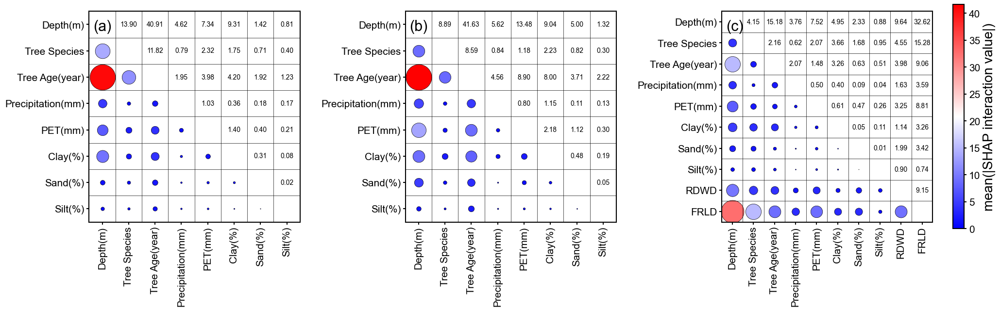

✅ 图像已保存至：C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap\shap_interaction_1x3_combined.png


In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
import shap
import os
plt.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# ====== 模型1 ======
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')
err = np.empty((0, 11))
for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(rawdata2.shape[0]):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    df = pd.DataFrame(site)
    for j in range(df.shape[0]):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 11)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k - 1, 2:11]
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
x1 = err.iloc[:, 1:11]
y1 = -err.iloc[:, 0]

# 特征命名
feature_name_map = {
    1: 'Depth(m)',
    2: 'Precipitation(mm)',
    3: 'PET(mm)',
    4: 'Clay(%)',
    5: 'Sand(%)',
    6: 'Silt(%)',
    7: 'Tree Age(year)',
    8: 'Tree Species',
    9: 'Longitude',
    10:'Latitude'
}
x1 = x1.rename(columns=feature_name_map)
x1 = x1[['Depth(m)','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]
X_train1, X_test1, Y_train1, Y_test1 = train_test_split(x1, y1, test_size=0.3, random_state=42)
rfr1 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr1.fit(X_train1, Y_train1)

# ====== 模型2 ======
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv', encoding='gbk')
err = np.empty((0, 20))
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(rawdata2.shape[0]):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))
    df = pd.DataFrame(site)
    for j in range(df.shape[0]):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 20)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
x2 = err.iloc[:, 1:20]
y2 = err.iloc[:, 0]

rename_map = {
    1: 'Depth(m)',
    2:'RDWD',
    3:'FRLD',
    4:'Tree Species',
    5:'Latitude',
    6:'Longitude',
    7:'Tree Age(year)',
    8:'P(mm yr-1)',
    9:'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}
x2 = x2.rename(columns=rename_map)         # inplace=False，重新赋值
sel_cols_base = ['Depth(m)', 'Tree Species','Tree Age(year)',
                 'Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']
x2 = x2[sel_cols_base]
X_train2, X_test2, Y_train2, Y_test2 = train_test_split(x2, y2, test_size=0.3, random_state=42)
rfr2 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr2.fit(X_train2, Y_train2)

# ====== 模型3（你可以复制模型2再换一套变量，比如增加 Root Dry Weight 和 Fine Root Length）======
x3 = err.iloc[:, 1:20].copy()
y3 = err.iloc[:, 0]
x3=x3.rename(columns=rename_map)
x3 = x3[['Depth(m)','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)', 'RDWD','FRLD']]
X_train3, X_test3, Y_train3, Y_test3 = train_test_split(x3, y3, test_size=0.3, random_state=42)
rfr3 = RandomForestRegressor(random_state=42,n_estimators=60,max_features=4,min_samples_leaf=1,min_samples_split=2,max_depth=5)
rfr3.fit(X_train3, Y_train3)
# === 计算 SHAP 交互作用值 ===
print("正在计算 SHAP 交互值...")
explainer1 = shap.TreeExplainer(rfr1)
shap_interaction1 = explainer1.shap_interaction_values(X_test1)
mean_inter1 = np.abs(shap_interaction1).mean(axis=0)

explainer2 = shap.TreeExplainer(rfr2)
shap_interaction2 = explainer2.shap_interaction_values(X_test2)
mean_inter2 = np.abs(shap_interaction2).mean(axis=0)

explainer3 = shap.TreeExplainer(rfr3)
shap_interaction3 = explainer3.shap_interaction_values(X_test3)
mean_inter3 = np.abs(shap_interaction3).mean(axis=0)

# 共享 colorbar 范围
def get_lower_triangle_max(matrix):
    return np.max(np.tril(matrix, k=-1))  # 只取下三角，不包括对角线

vmax1 = get_lower_triangle_max(mean_inter1)
vmax2 = get_lower_triangle_max(mean_inter2)
vmax3 = get_lower_triangle_max(mean_inter3)

vmax = max(vmax1, vmax2, vmax3)  # 真正可视部分的最大值
#vmax = max(mean_inter1.max(), mean_inter2.max(), mean_inter3.max())
norm = plt.Normalize(vmin=0, vmax=vmax)
cmap = 'bwr'#'seismic'

# === 绘制 1x3 子图 ===
fig, axes = plt.subplots(1, 3, figsize=(27, 6))  # 宽图
fig.subplots_adjust(wspace=0.5)

features_list = [X_test1.columns, X_test2.columns, X_test3.columns]
inter_list = [mean_inter1, mean_inter2, mean_inter3]

for idx in range(3):
    ax = axes[idx]
    features = features_list[idx]
    mean_inter = inter_list[idx]
    n = len(features)

    ax.set_xlim(-0.5, n - 0.5)
    ax.set_ylim(-0.5, n - 0.5)
    ax.set_aspect('equal')

    # === 热力图绘制逻辑 ===
    for i in range(n):
        for j in range(n):
            val = mean_inter[i, j]
            row =n-1-i  # 翻转y轴
            col = j
            if i > j:
                # 下三角：圆圈表示交互值
                ax.scatter(col, row, s=35*val, c=[val], cmap=cmap,
                           vmin=0, vmax=vmax, edgecolors='black', linewidth=0.5)
            elif i < j:
                # 上三角：写数字
                ax.text(col, row, f"{val:.2f}", ha='center', va='center', fontsize=10)
         #   else:
         #       # 对角线：写变量名
         #       ax.text(col, row, features[i], ha='center', va='center',
         #               fontsize=8, fontweight='bold')
    # 设置坐标轴
    ax.set_xticks(range(n))
    ax.set_xticklabels(features, rotation=90)
    ax.set_yticks(range(n))
    ax.set_yticklabels(features[::-1])
    ax.grid(False)

    # 添加格网边框
    for i in range(n + 1):
        ax.axhline(i - 0.5, color='black', linewidth=0.5)
        ax.axvline(i - 0.5, color='black', linewidth=0.5)

    # 添加小图注标题
    #ax.set_title(titles[idx], fontsize=18)

    # 标注 (a) (b) (c)
    ax.text(0.02, 0.96, f'({chr(97 + idx)})', transform=ax.transAxes,
            va='top', ha='left', color='black', fontsize=22)#, fontweight='bold'
# === 添加共享 colorbar ===
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes, location='right', shrink=1, pad=0.02)
cbar.set_label('mean(|SHAP interaction value|)')#, fontsize=label_fontsize
cbar.ax.tick_params()#labelsize=tick_fontsize

# === 保存图像 ===
save_path = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\5shap\shap_interaction_1x3_combined.png'
os.makedirs(os.path.dirname(save_path), exist_ok=True)
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"✅ 图像已保存至：{save_path}")

# 7. 重要性——随机森林自带

## 7.1 带有depth

In [ ]:
# m每层累计值 和直到最大层，如3.3-3.7，3.3-25.1
import pandas as pd
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn import tree
from scipy.stats import randint
# === 读取并处理数据 ===
rawdata = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data.csv', encoding='gbk')
rawdata2 = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\data\data2.csv', encoding='gbk')
rawdata2_row = np.size(rawdata2, 0)

err = np.empty((0, 11))
for k in range(1, 73):
    site_sum = np.empty((0, 11))
    site = np.empty((0, 4))
    for i in range(rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :]))
    df = pd.DataFrame(site)
    site_row = df.shape[0]
    for j in range(site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j+1, :].sum(axis=0)
            site_sum_hang = pd.DataFrame(np.empty((1, 11)))
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 4] - df.iloc[3, 4]) * 200
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1
            site_sum_hang.iloc[0, 2:11] = rawdata.iloc[k - 1, 2:11]
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))

err = pd.DataFrame(err)
x = err.iloc[:, 1:9]
y = -err.iloc[:, 0]

# 特征命名
new_feature_names = {
    1: 'Depth(m)',
    2: 'Precipitation(mm)',
    3: 'PET(mm)',
    4: 'Clay(%)',
    5: 'Sand(%)',
    6: 'Silt(%)',
    7: 'Tree Age(year)',
    8: 'Tree Species'
}

# 初始化一个空的DataFrame来保存所有深度的结果
results = pd.DataFrame()

for depth in np.arange(3.2, 25.4, 0.2):
    # 筛选出对应深度范围的数据
    depth_data = err[(err.iloc[:, 1] >= 3.2) & (err.iloc[:, 1] <= depth)]
    
    # 确保每个深度的数据行数大于等于20
    if len(depth_data) >= 20:
        X = depth_data.iloc[:, 1:9]
        Y = -depth_data.iloc[:, 0]

        # 重命名列
        X.rename(columns=new_feature_names, inplace=True)

        importances_list = []

        # 进行 100 次划分
        for _ in range(100):
            X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=np.random.randint(0, 10000))
            
            rfr = RandomForestRegressor(
                random_state=42,
                n_estimators=60,
                max_features=4,
                min_samples_leaf=1,
                min_samples_split=2,
                max_depth=5
            )
            rfr.fit(X_train, Y_train)

            importances_list.append(rfr.feature_importances_)

        # 计算均值和标准差
        importances_mean = np.mean(importances_list, axis=0)
        importances_std = np.std(importances_list, axis=0)

        # 构建结果行
        result_row = pd.DataFrame([importances_mean], columns=[f'{col}_mean' for col in X.columns])
        result_row[[f'{col}_std' for col in X.columns]] = [importances_std]
        result_row['Depth(m)'] = depth  # 添加当前最大深度

        # 合并到总结果中
        results = pd.concat([results, result_row], ignore_index=True)

# 导出结果
results.to_excel(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\7importance\RF_importance71.xlsx', index=False)

## 7.3 root_with_depth

In [ ]:
#root
# m每层累计值 和直到最大层，如3.3-3.7，3.3-25.1
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn import tree
from scipy.stats import randint
from sklearn.inspection import PartialDependenceDisplay
from sklearn.tree import export_graphviz
import shap
import os

# Set default font to Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2:'RDWD',
    3:'FRLD',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)', 'RDWD','FRLD','Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]
# 分割数据集为训练集和测试集

# 初始化一个空的DataFrame来保存所有深度的结果
results = pd.DataFrame()

x_all = x.copy()

for depth in np.arange(3.2, 25.4, 0.2):
    # 每次循环都基于完整数据筛选，不要累计切片
    x_sub = x_all[(x_all.iloc[:, 0] >= 3.2) & (x_all.iloc[:, 0] <= depth)]
    y_sub = err[(err.iloc[:, 1] >= 3.2) & (err.iloc[:, 1] <= depth)].iloc[:, 0]
    
    if len(x_sub) >= 20 and len(y_sub) == len(x_sub):
        X = x_sub.iloc[:, 0:10]
        Y = -y_sub  # 深度取负号是你自己的设定
        

        # 重命名列
       # X.rename(columns=new_feature_names, inplace=True)

        importances_list = []

        # 进行 100 次划分
        for _ in range(100):
            X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=np.random.randint(0, 10000))
            
            rfr = RandomForestRegressor(
                random_state=42,
                n_estimators=60,
                max_features=4,
                min_samples_leaf=1,
                min_samples_split=2,
                max_depth=5
            )
            rfr.fit(X_train, Y_train)

            importances_list.append(rfr.feature_importances_)

        # 计算均值和标准差
        importances_mean = np.mean(importances_list, axis=0)
        importances_std = np.std(importances_list, axis=0)

        # 构建结果行
        result_row = pd.DataFrame([importances_mean], columns=[f'{col}_mean' for col in X.columns])
        result_row[[f'{col}_std' for col in X.columns]] = [importances_std]
        result_row['Depth(m)'] = depth  # 添加当前最大深度

        # 合并到总结果中
        results = pd.concat([results, result_row], ignore_index=True)

# 导出结果
results.to_excel(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\7importance\RF_importance73.xlsx', index=False)

## 7.5 with_root_24_with_depth

In [ ]:
#root
# m每层累计值 和直到最大层，如3.3-3.7，3.3-25.1
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn import tree
from scipy.stats import randint
from sklearn.inspection import PartialDependenceDisplay
from sklearn.tree import export_graphviz
import shap
import os

# Set default font to Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

rawdata = r'C:\Users\Administrator\Desktop\AFM\新数据集24\data24_true.csv'
rawdata2 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv'
rawdata = pd.read_csv(rawdata, encoding='gbk')  # 读取数据
rawdata2 = pd.read_csv(rawdata2, encoding='gbk')  # 读取数据
rawdata2_row = np.size(rawdata2, 0)  # 计算 X 的行数
rawdata2_col = np.size(rawdata2, 1)  # 计算 X 的列数
err = np.empty((0, 20))#给16个
for k in range(1, 45):
    site_sum = np.empty((0, 20))
    site = np.empty((0, 6))
    for i in range(0, rawdata2_row):
        if rawdata2.iloc[i, 0] == k:
            site = np.vstack((site, rawdata2.iloc[i, :].values))  # .values 转换为 NumPy 数组
    site_row = np.size(site, 0)
    site_col = np.size(site, 1)
    df = pd.DataFrame(site)  # NumPy 数组转为 DataFrame
    for j in range(0, site_row):
        if df.iloc[j, 1] > 3.0:
            df['sum1'] = df.iloc[15:j + 1, :].sum(axis=0)
            site_sum_hang = np.empty((1, 20))  # 创建了一个形状为 1 行 18 列的空数组 site_sum_hang
            depth = df.iloc[j, 1]  # 添加深度
            site_sum_hang = pd.DataFrame(site_sum_hang)
            site_sum_hang.iloc[0, 0] = (df.iloc[2, 6] - df.iloc[3, 6]) * 200  # 计算累计
            site_sum_hang.iloc[0, 1] = df.iloc[j, 1] + 0.1  # 添加深度
            site_sum_hang.iloc[0, 2] = df.iloc[4, 6]#df.iloc[j, 4]  # root dry weight density
            site_sum_hang.iloc[0, 3] = df.iloc[5, 6]#df.iloc[j, 5]  # Fine root length density
            row_indices = np.where(rawdata.iloc[:, 0] == k)[0]  # 使用 Pandas 的索引方式
            site_sum_hang.iloc[0, 4:20] = rawdata.iloc[row_indices, 1:17].values  # 添加其他变量
            site_sum = np.vstack((site_sum, site_sum_hang))
    err = np.vstack((err, site_sum))
err = pd.DataFrame(err)
C = err.drop_duplicates()
x = err.iloc[:, 1:20]  # 输入特征
y = err.iloc[:, 0]  # 目标变量
##命名

# 假设原始数据集的列名是数字，我们将它们重命名为新的特征名称
new_feature_names = {
    1: 'Depth(m)',
    2: 'Root Dry Weight Density',
    3: 'Fine Root Length Density',
    4: 'Tree Species',
    5: 'Latitude',
    6: 'Longitude',
    7: 'Tree Age(year)',
    8: 'P(mm yr-1)',
    9: 'Precipitation(mm)',
    10:'Planting density(plants/ha)',
    11:'Root deepening rate(m yr-1)',
    12:'Maximum rooting depth(m)',
    13:'PET(mm)',
    14:'Clay(%)',
    15:'Sand(%)',
    16:'Silt(%)',
    17:'root biomass C input in shallow soil(Mg ha-1)',
    18:'root biomass C input in deep soil(Mg ha-1)',
    19:'C% in deep soil'
}

# 使用rename方法重命名列
x.rename(columns=new_feature_names, inplace=True)
x = x[['Depth(m)', 'Tree Species','Tree Age(year)','Precipitation(mm)','PET(mm)', 'Clay(%)', 'Sand(%)', 'Silt(%)']]
# 分割数据集为训练集和测试集

# 初始化一个空的DataFrame来保存所有深度的结果
results = pd.DataFrame()

x_all = x.copy()

for depth in np.arange(3.2, 25.4, 0.2):
    # 每次循环都基于完整数据筛选，不要累计切片
    x_sub = x_all[(x_all.iloc[:, 0] >= 3.2) & (x_all.iloc[:, 0] <= depth)]
    y_sub = err[(err.iloc[:, 1] >= 3.2) & (err.iloc[:, 1] <= depth)].iloc[:, 0]
    
    if len(x_sub) >= 20 and len(y_sub) == len(x_sub):
        X = x_sub.iloc[:, 0:8]
        Y = -y_sub  # 深度取负号是你自己的设定
        

        # 重命名列
       # X.rename(columns=new_feature_names, inplace=True)

        importances_list = []

        # 进行 100 次划分
        for _ in range(100):
            X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=np.random.randint(0, 10000))
            
            rfr = RandomForestRegressor(
                random_state=42,
                n_estimators=60,
                max_features=4,
                min_samples_leaf=1,
                min_samples_split=2,
                max_depth=5
            )
            rfr.fit(X_train, Y_train)

            importances_list.append(rfr.feature_importances_)

        # 计算均值和标准差
        importances_mean = np.mean(importances_list, axis=0)
        importances_std = np.std(importances_list, axis=0)

        # 构建结果行
        result_row = pd.DataFrame([importances_mean], columns=[f'{col}_mean' for col in X.columns])
        result_row[[f'{col}_std' for col in X.columns]] = [importances_std]
        result_row['Depth(m)'] = depth  # 添加当前最大深度

        # 合并到总结果中
        results = pd.concat([results, result_row], ignore_index=True)

# 导出结果
results.to_excel(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\7importance\RF_importance75.xlsx', index=False)

# 8.重要性绘图

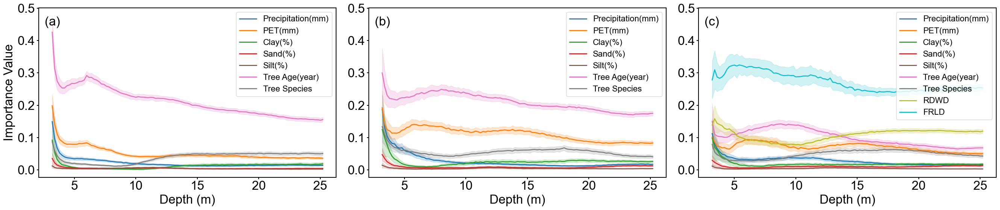

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['font.family'] = 'Arial'
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5

# === 三个文件路径 ===
file_noroot    = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\7importance\RF_importance71.xlsx'
file_root      = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\7importance\RF_importance73.xlsx'
file_noroot_24 = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\7importance\RF_importance75.xlsx'  # 新文件

# === 读取数据 ===
df_noroot = pd.read_excel(file_noroot)
df_root  = pd.read_excel(file_root)
df_noroot24 = pd.read_excel(file_noroot_24)

# === 定义变量列 ===
vars_noroot = [
    'Precipitation(mm)_mean','PET(mm)_mean',
    'Clay(%)_mean','Sand(%)_mean','Silt(%)_mean',
    'Tree Age(year)_mean','Tree Species_mean'
]
stds_noroot = [
    'Precipitation(mm)_std','PET(mm)_std',
    'Clay(%)_std','Sand(%)_std','Silt(%)_std',
    'Tree Age(year)_std','Tree Species_std'
]

vars_root = [
    'Precipitation(mm)_mean','PET(mm)_mean',
    'Clay(%)_mean','Sand(%)_mean','Silt(%)_mean',
    'Tree Age(year)_mean','Tree Species_mean',
    'RDWD_mean','FRLD_mean'
]
stds_root = [
    'Precipitation(mm)_std','PET(mm)_std',
    'Clay(%)_std','Sand(%)_std','Silt(%)_std',
    'Tree Age(year)_std','Tree Species_std',
    'RDWD_std','FRLD_std'
]

vars_noroot24 = vars_noroot
stds_noroot24 = stds_noroot

# === 创建 1×3 子图 ===
fig, axes = plt.subplots(1, 3, figsize=(27, 6), sharey=True)
plt.subplots_adjust(wspace=0.3)

# 子图元组：(df, vars, stds, ax, title, tag)
plot_items = [
    (df_noroot, vars_noroot, stds_noroot, axes[0], '', '(a)'),
    (df_noroot24, vars_noroot24, stds_noroot24, axes[1], '', '(b)'),
    (df_root, vars_root, stds_root, axes[2], '', '(c)')
    
]

# 使用 tab10 调色板
colors = plt.cm.tab10(np.linspace(0, 1, len(vars_root)))  # 生成 tab10 的颜色

for df, var_list, std_list, ax, title, tag in plot_items:
    depth = df['Depth(m)']
    for j, (m, s) in enumerate(zip(var_list, std_list)):
        mean = df[m]
        std = df[s]
        ax.plot(depth, mean, label=m.replace('_mean', ''), color=colors[j], linewidth=2)  # 使用 tab10 颜色
        ax.fill_between(depth, mean - std, mean + std, color=colors[j], alpha=0.2)  # 使用 tab10 颜色
    ax.set_xlabel('Depth (m)')
    ax.tick_params(which='both', bottom=True, top=False, left=True, right=False,
                   labelbottom=True, labelleft=True, direction='out')
    ax.text(0.02, 0.95, tag, transform=ax.transAxes,
            fontsize=24, va='top', ha='left')
    if ax == axes[0]:
        ax.set_ylabel('Importance Value')
    ax.legend(loc='upper right', fontsize=16)

# === 保存与展示 ===
save_path = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\7importance\RF_Variable_Trends_3col.png'
plt.tight_layout()
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()

# 9.根系密度绘图

## 9.1 6张图

In [ ]:
import pandas as pd
import numpy as np
rawdata1 = r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.xlsx'
#rawdata1=pd.read_xlsx(rawdata1, encoding='gbk')#读取数据
rawdata1 = pd.read_excel(rawdata1, sheet_name='Sheet1')  # 指定 sheet 名
# 根据第二列的特定值来构建新数据
new_data = []
rawdata1= rawdata1[rawdata1.iloc[:, 4] != 0]
# 遍历第二列中的所有独特值（如 3.2, 3.4, 3.6, ...）
unique_values = np.unique(rawdata1.iloc[:, 1])

for value in unique_values:
    # 获取当前第二列值对应的所有第一列数据
    first_column_values = rawdata1[rawdata1.iloc[:, 1] == value].iloc[:, 5].values
    
    # 将第二列的唯一值放入新数据的第一列第一行
    new_data.append([value] + list(first_column_values))

# 将 new_data 转为 DataFrame
new_df = pd.DataFrame(new_data)
# 转置矩阵（将第一列变为第一行）
transposed_df = new_df.T
# 保存到新的 Excel 文件
transposed_df.to_excel(r'C:\Users\Administrator\Desktop\AFM\箱线图\Fine root length density.xlsx', index=False)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.lines import Line2D
from matplotlib.ticker import ScalarFormatter
from matplotlib import rcParams
#plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.family'] = 'Helvetica'

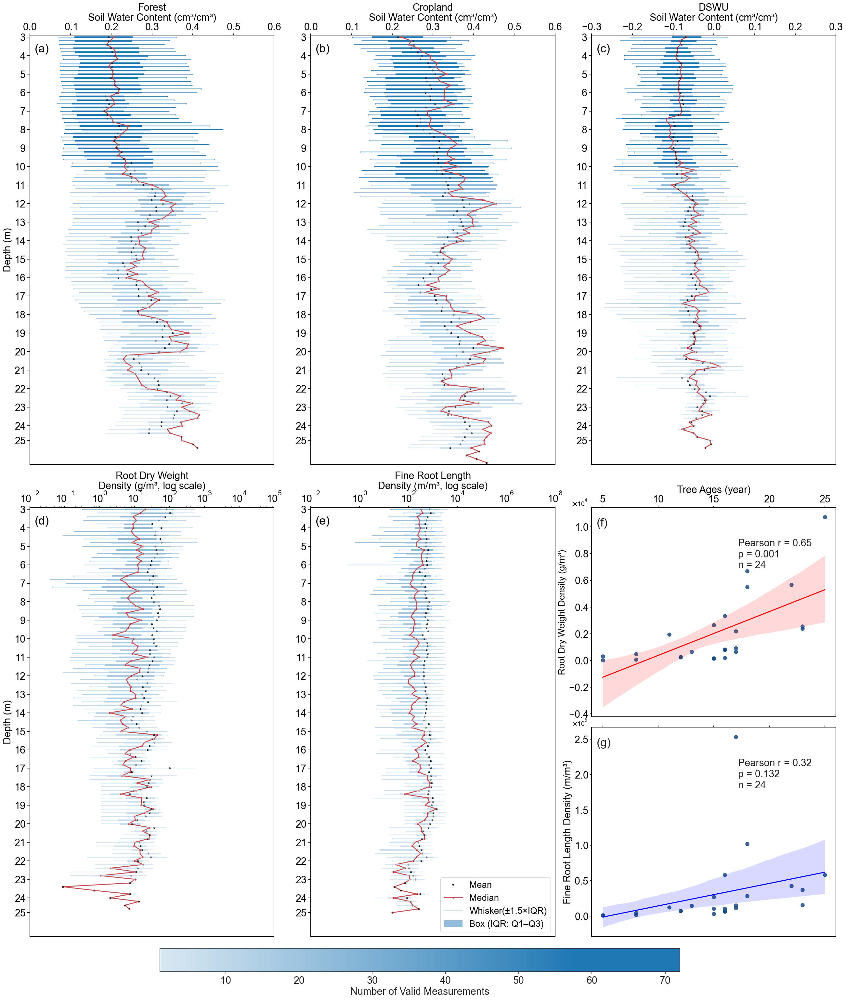

In [15]:
### 20250822以后
# -*- coding: utf-8 -*-
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.lines import Line2D
from matplotlib.ticker import ScalarFormatter
import matplotlib.font_manager as fm
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import ScalarFormatter
# 设置字体
#font_path = r'C:\Users\Administrator\Downloads\Arial\Arial Unicode MS.ttf'
#font_prop = fm.FontProperties(fname=font_path)
plt.rcParams["font.family"] = "Arial"
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# 文件路径
file_path = r'C:\Users\Administrator\Desktop\AFM\箱线图\water.xlsx'

# Sheet和标题
sheet_names = ['forestwater(3)', 'soilwater(3)', 'SWSD(3)',
               'Root Dry Weight Density (3)', 'Fine Root Length Density (3)']
titles = ['Forest', 'Cropland', 'DSWU', 'Root Dry Weight', 'Fine Root Length']

# 创建渐变色映射
def create_monochrome_colormap(color_rgb, n=256, gamma=1.0):
    colors = []
    for i in np.linspace(0, 1, n):
        factor = i ** gamma
        r = (1 - factor) * 1.0 + factor * color_rgb[0]
        g = (1 - factor) * 1.0 + factor * color_rgb[1]
        b = (1 - factor) * 1.0 + factor * color_rgb[2]
        colors.append((r, g, b))
    return LinearSegmentedColormap.from_list('mono_cmap', colors)

main_rgb = mcolors.to_rgb("#1f77b4")
base_cmap = create_monochrome_colormap(main_rgb, gamma=1.1)
brightness_factors = [1.0] * 5
colormap_start = 0.2
colormap_end = 1.2
cmaps = []
for factor in brightness_factors:
    colors_scaled = []
    for c in base_cmap(np.linspace(colormap_start, colormap_end, 256)):
        r, g, b = c[:3]
        r_new = min(r * factor, 1)
        g_new = min(g * factor, 1)
        b_new = min(b * factor, 1)
        colors_scaled.append((r_new, g_new, b_new))
    cmap_scaled = LinearSegmentedColormap.from_list(f'cmap_factor_{factor}', colors_scaled)
    cmaps.append(cmap_scaled)

# 创建主图
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(32, 36), sharey=True)
plt.subplots_adjust(wspace=0.15, hspace=0.10)
axes = axes.flatten()

# 遍历前五个子图（箱线图）
for idx, (sheet, title, cmap) in enumerate(zip(sheet_names, titles, cmaps)):
    ax = axes[idx]
    df = pd.read_excel(file_path, sheet_name=sheet, header=None)
    depths = df.iloc[0, :].astype(float).values
    data = df.iloc[1:, :].astype(float).values.T
    adjusted_depths = np.arange(len(depths))

    all_data = data.flatten()
    all_data = all_data[~np.isnan(all_data)]
    p1 = np.percentile(all_data, 0.1)
    p99 = np.percentile(all_data, 99.9)
    if sheet in ['Root Dry Weight Density (3)', 'Fine Root Length Density (3)']:
        data_trimmed = np.where((data > 0) & (data <= p99), data, np.nan)
    else:
        data_trimmed = np.where((data >= p1) & (data <= p99), data, np.nan)

    means = np.nanmean(data_trimmed, axis=1)
    mins = np.nanmin(data_trimmed, axis=1)
    maxs = np.nanmax(data_trimmed, axis=1)
    valid_counts = np.sum(~np.isnan(data_trimmed), axis=1)
    norm = mcolors.Normalize(vmin=1, vmax=72)
    colors = [cmap(norm(c)) for c in valid_counts]

    for i, (d, color) in enumerate(zip(data_trimmed, colors)):
        d_clean = d[~np.isnan(d)]
        if len(d_clean) > 0:
            bp = ax.boxplot(
                d_clean,
                positions=[adjusted_depths[i]],
                vert=False,
                widths=0.3,
                patch_artist=True,
                boxprops=dict(facecolor=color, color=color),
                medianprops=dict(color='red'),
                whiskerprops=dict(color=color),
                capprops=dict(color=color),
                flierprops=dict(marker=''),
                showfliers=False
            )
            if i == 0:
                box_legend = bp['boxes'][0]
                whisker_legend = bp['whiskers'][0]
                cap_legend = bp['caps'][0]

    medians = np.nanmedian(data_trimmed, axis=1)
    median_line, = ax.plot(medians, adjusted_depths, 'ro-', label='Median', linewidth=2, markersize=3)
    mean_point, = ax.plot(means, adjusted_depths, 'ko', label='Mean', markersize=3)
    for i in range(len(adjusted_depths)):
        ax.hlines(y=adjusted_depths[i], xmin=mins[i], xmax=maxs[i], color=colors[i], alpha=0.6)

    ax.set_title(title, fontsize=22)
    ax.text(0.02, 0.98, f"({chr(97+idx)})", transform=ax.transAxes,
            fontsize=26, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
    ax.tick_params(labelsize=22)
    ax.tick_params(axis='y', which='both', direction='out', length=6, width=1.2, color='black')
    ax.grid(False)
    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()
    ax.xaxis.set_tick_params(labelsize=22)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_useOffset(True)
    formatter.set_powerlimits((-2, 2))
    ax.xaxis.set_major_formatter(formatter)
    ax.figure.canvas.draw()
    ax.xaxis.get_offset_text().set_fontsize(22)
    ax.tick_params(which='both', bottom=False, top=True, left=True, right=False,
               labelbottom=False, labelleft=True, direction='out')

    # x轴标题
    if sheet == 'forestwater(3)' or sheet == 'soilwater(3)':
        ax.set_xlim(0, 0.6)
        ax.set_xlabel('Soil Water Content (cm³/cm³)', fontsize=22)
    elif sheet == 'SWSD(3)':
        ax.set_xlim(-0.3, 0.3)
        ax.set_xlabel('Soil Water Content (cm³/cm³)', fontsize=22)
    elif sheet == 'Fine Root Length Density (3)':
        ax.set_xscale('log')
        ax.set_xlim(0.01, 100000000)
        ax.set_xlabel('Density (m/m³, log scale)', fontsize=22)
    elif sheet == 'Root Dry Weight Density (3)':
        ax.set_xscale('log')
        ax.set_xlim(0.01, 100000)
        ax.set_xlabel('Density (g/m³, log scale)', fontsize=22)

    integer_indices = [i for i, depth in enumerate(depths) if depth.is_integer()]
    integer_depths = [depths[i] for i in integer_indices]
    adjusted_integer_depths = [adjusted_depths[i] for i in integer_indices]
    ax.set_yticks(adjusted_integer_depths)
    ax.set_yticklabels([f"{int(d)}" for d in integer_depths], fontsize=22)
    ax_row, ax_col = divmod(idx, 3)
    if ax_col == 0:
        ax.set_ylabel('Depth (m)', fontsize=22)
    ax.invert_yaxis()

# 添加图例（最后一个子图）
median_legend = Line2D([0], [0], color='black', linestyle='none', marker='s', markersize=3, label='Median')
handles = [mean_point, median_line, whisker_legend, box_legend]
labels = ['Mean', 'Median', 'Whisker(±1.5×IQR)', 'Box (IQR: Q1–Q3)']
axes[4].legend(handles=handles, labels=labels, loc='lower right', fontsize=20)

# 替换第六个子图为嵌套两个回归图
bbox = axes[5].get_position()
axes[5].remove()

gap = 0.009  # 控制上下图之间的空隙（推荐范围：0.01~0.05）

# 图的总高度减去 gap 后分配给两个图
h1 = (bbox.height - gap) * 0.5
h2 = h1  # 保持两图等高

# 新的上下位置
ax1 = fig.add_axes([bbox.x0, bbox.y0 + h2 + gap, bbox.width, h1])
ax2 = fig.add_axes([bbox.x0, bbox.y0, bbox.width, h2])

# 读取回归数据
df_reg = pd.read_excel(file_path, sheet_name='RDWD with FRLD')
x = df_reg['Tree ages']
y1 = df_reg['root dry weight density']
y2 = df_reg['Fine root length density']

# 回归图绘制
sns.set(style="white")
sns.regplot(x=x, y=y1, ax=ax1, scatter_kws={'s': 65,'color': '#104680'}, line_kws={'color': 'red'}, ci=95)
sns.regplot(x=x, y=y2, ax=ax2, scatter_kws={'s': 65,'color': '#104680'}, line_kws={'color': 'blue'}, ci=95)

ax1.set_xlabel('Tree Ages (year)', fontsize=22)
ax1.set_ylabel('Root Dry Weight Density (g/m³)', fontsize=20)
ax1.text(0.02, 0.95, '(f)', transform=ax1.transAxes, fontname='Arial', va='top',fontsize=26)
ax1.tick_params(direction='out')
ax1.xaxis.set_label_position('top')
ax1.xaxis.tick_top()
# Y轴科学计数法
ax1.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax1.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
# 获取 offset text 对象
y_offset = ax1.yaxis.get_offset_text()

# 修改位置 (x, y) 是轴坐标系位置，默认在(0,1)
y_offset.set_x(-0.08)  # 左右移动
y_offset.set_y(1.02)   # 上下移动
ax1.tick_params(labelbottom=False, bottom=False)
ax1.xaxis.get_label().set_visible(True)
ax1.tick_params(labelbottom=False)
ax1.tick_params(axis='both', labelsize=22)
ax1.set_title("", fontsize=22, pad=17)
#ax2.set_xlabel('Tree Ages (year)', fontsize=12)
ax2.set_ylabel('Fine Root Length Density (m/m³)', fontsize=22)
ax2.text(0.02, 0.95, '(g)', transform=ax2.transAxes, fontname='Arial', va='top',fontsize=26)
#ax2.tick_params(direction='out')
ax2.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax2.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
# 获取 offset text 对象
y_offset = ax2.yaxis.get_offset_text()
# 修改位置 (x, y) 是轴坐标系位置，默认在(0,1)
y_offset.set_x(-0.08)  # 左右移动
y_offset.set_y(1.02)   # 上下移动
ax2.tick_params(labelbottom=False)
ax2.tick_params(labelbottom=False, bottom=False)  # 隐藏底部刻度线和刻度标签
ax2.set_xticklabels([])                           # 确保刻度标签消失
ax2.xaxis.get_label().set_visible(False)           # 显示顶部标签
ax2.tick_params(axis='both', labelsize=22)
ax2.xaxis.set_label_position('top')
ax2.xaxis.tick_top()
ax2.set_xticklabels([]) 
ax1.tick_params(which='both', bottom=False, top=True, left=True, right=False,
               labelbottom=False, labelleft=True, direction='out')
ax2.tick_params(which='both', bottom=False, top=True, left=True, right=False,
               labelbottom=False, labelleft=True, direction='out')
ax1.xaxis.get_offset_text().set_fontsize(14)
ax1.yaxis.get_offset_text().set_fontsize(14)
ax2.xaxis.get_offset_text().set_fontsize(14)
ax2.yaxis.get_offset_text().set_fontsize(14)
def add_stats(ax, x, y):
    # 计算 Pearson 相关系数和 p 值
    r_value, p_value = stats.pearsonr(x, y)
    r_squared = r_value ** 2  # R² 值
    n = len(x)  # 数据点个数
    # 使用 Pearson 相关系数和 p 值
    ax.annotate(f'Pearson r = {r_value:.2f}\np = {p_value:.3f}\nn = {n}', 
                xy=(0.60, 0.85), xycoords='axes fraction',
                fontsize=22, verticalalignment='top')#R² = {r_squared:.2f}\n
add_stats(ax1, x, y1)
add_stats(ax2, x, y2)

# 色条
sm = ScalarMappable(cmap=cmaps[-1], norm=norm)
sm.set_array([])
cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Number of Valid Measurements', fontsize=22)
cbar.ax.tick_params(labelsize=22)

# 保存
#save_path = r'C:\Users\Administrator\Desktop\AFM\箱线图\combined_6plots.png'
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\箱线图\combined_6plots.png', dpi=300, bbox_inches='tight')
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\箱线图\combined_6plots_withAnomaly Point.svg', format='svg',bbox_inches='tight', pad_inches=0.1)
plt.show()

In [ ]:
### 20250822以后
# -*- coding: utf-8 -*-
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.lines import Line2D
from matplotlib.ticker import ScalarFormatter
import matplotlib.font_manager as fm
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import ScalarFormatter
# 设置字体
#font_path = r'C:\Users\Administrator\Downloads\Arial\Arial Unicode MS.ttf'
#font_prop = fm.FontProperties(fname=font_path)
plt.rcParams["font.family"] = "Arial"
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
# 文件路径
file_path = r'C:\Users\Administrator\Desktop\AFM\箱线图\water.xlsx'

# Sheet和标题
sheet_names = ['forestwater(3)', 'soilwater(3)', 'SWSD(3)',
               'Root Dry Weight Density (3)', 'Fine Root Length Density (3)']
titles = ['Forest', 'Cropland', 'DSWU', 'Root Dry Weight', 'Fine Root Length']

# 创建渐变色映射
def create_monochrome_colormap(color_rgb, n=256, gamma=1.0):
    colors = []
    for i in np.linspace(0, 1, n):
        factor = i ** gamma
        r = (1 - factor) * 1.0 + factor * color_rgb[0]
        g = (1 - factor) * 1.0 + factor * color_rgb[1]
        b = (1 - factor) * 1.0 + factor * color_rgb[2]
        colors.append((r, g, b))
    return LinearSegmentedColormap.from_list('mono_cmap', colors)

main_rgb = mcolors.to_rgb("#1f77b4")
base_cmap = create_monochrome_colormap(main_rgb, gamma=1.1)
brightness_factors = [1.0] * 5
colormap_start = 0.2
colormap_end = 1.2
cmaps = []
for factor in brightness_factors:
    colors_scaled = []
    for c in base_cmap(np.linspace(colormap_start, colormap_end, 256)):
        r, g, b = c[:3]
        r_new = min(r * factor, 1)
        g_new = min(g * factor, 1)
        b_new = min(b * factor, 1)
        colors_scaled.append((r_new, g_new, b_new))
    cmap_scaled = LinearSegmentedColormap.from_list(f'cmap_factor_{factor}', colors_scaled)
    cmaps.append(cmap_scaled)

# 创建主图
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(32, 36), sharey=True)
plt.subplots_adjust(wspace=0.15, hspace=0.10)
axes = axes.flatten()

# 遍历前五个子图（箱线图）
for idx, (sheet, title, cmap) in enumerate(zip(sheet_names, titles, cmaps)):
    ax = axes[idx]
    df = pd.read_excel(file_path, sheet_name=sheet, header=None)
    depths = df.iloc[0, :].astype(float).values
    data = df.iloc[1:, :].astype(float).values.T
    adjusted_depths = np.arange(len(depths))

    all_data = data.flatten()
    all_data = all_data[~np.isnan(all_data)]
    p1 = np.percentile(all_data, 0.1)
    p99 = np.percentile(all_data, 99.9)
    if sheet in ['Root Dry Weight Density (3)', 'Fine Root Length Density (3)']:
        data_trimmed = np.where((data > 0) & (data <= p99), data, np.nan)
    else:
        data_trimmed = np.where((data >= p1) & (data <= p99), data, np.nan)

    means = np.nanmean(data_trimmed, axis=1)
    mins = np.nanmin(data_trimmed, axis=1)
    maxs = np.nanmax(data_trimmed, axis=1)
    valid_counts = np.sum(~np.isnan(data_trimmed), axis=1)
    norm = mcolors.Normalize(vmin=1, vmax=72)
    colors = [cmap(norm(c)) for c in valid_counts]

    for i, (d, color) in enumerate(zip(data_trimmed, colors)):
        d_clean = d[~np.isnan(d)]
        if len(d_clean) > 0:
            bp = ax.boxplot(
                d_clean,
                positions=[adjusted_depths[i]],
                vert=False,
                widths=0.3,
                patch_artist=True,
                boxprops=dict(facecolor=color, color=color),
                medianprops=dict(color='red'),
                whiskerprops=dict(color=color),
                capprops=dict(color=color),
                flierprops=dict(marker=''),
                showfliers=False
            )
            if i == 0:
                box_legend = bp['boxes'][0]
                whisker_legend = bp['whiskers'][0]
                cap_legend = bp['caps'][0]

    medians = np.nanmedian(data_trimmed, axis=1)
    median_line, = ax.plot(medians, adjusted_depths, 'ro-', label='Median', linewidth=2, markersize=3)
    mean_point, = ax.plot(means, adjusted_depths, 'ko', label='Mean', markersize=3)
    for i in range(len(adjusted_depths)):
        ax.hlines(y=adjusted_depths[i], xmin=mins[i], xmax=maxs[i], color=colors[i], alpha=0.6)

    ax.set_title(title, fontsize=22)
    ax.text(0.02, 0.98, f"({chr(97+idx)})", transform=ax.transAxes,
            fontsize=26, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))
    ax.tick_params(labelsize=22)
    ax.tick_params(axis='y', which='both', direction='out', length=6, width=1.2, color='black')
    ax.grid(False)
    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()
    ax.xaxis.set_tick_params(labelsize=22)
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_useOffset(True)
    formatter.set_powerlimits((-2, 2))
    ax.xaxis.set_major_formatter(formatter)
    ax.figure.canvas.draw()
    ax.xaxis.get_offset_text().set_fontsize(22)
    ax.tick_params(which='both', bottom=False, top=True, left=True, right=False,
               labelbottom=False, labelleft=True, direction='out')

    # x轴标题
    if sheet == 'forestwater(3)' or sheet == 'soilwater(3)':
        ax.set_xlim(0, 0.6)
        ax.set_xlabel('Soil Water Content (cm³/cm³)', fontsize=22)
    elif sheet == 'SWSD(3)':
        ax.set_xlim(-0.3, 0.3)
        ax.set_xlabel('Soil Water Content (cm³/cm³)', fontsize=22)
    elif sheet == 'Fine Root Length Density (3)':
        ax.set_xscale('log')
        ax.set_xlim(0.01, 100000000)
        ax.set_xlabel('Density (m/m³, log scale)', fontsize=22)
    elif sheet == 'Root Dry Weight Density (3)':
        ax.set_xscale('log')
        ax.set_xlim(0.01, 100000)
        ax.set_xlabel('Density (g/m³, log scale)', fontsize=22)

    integer_indices = [i for i, depth in enumerate(depths) if depth.is_integer()]
    integer_depths = [depths[i] for i in integer_indices]
    adjusted_integer_depths = [adjusted_depths[i] for i in integer_indices]
    ax.set_yticks(adjusted_integer_depths)
    ax.set_yticklabels([f"{int(d)}" for d in integer_depths], fontsize=22)
    ax_row, ax_col = divmod(idx, 3)
    if ax_col == 0:
        ax.set_ylabel('Depth (m)', fontsize=22)
    ax.invert_yaxis()

# 添加图例（最后一个子图）
median_legend = Line2D([0], [0], color='black', linestyle='none', marker='s', markersize=3, label='Median')
handles = [mean_point, median_line, whisker_legend, box_legend]
labels = ['Mean', 'Median', 'Whisker(±1.5×IQR)', 'Box (IQR: Q1–Q3)']
axes[4].legend(handles=handles, labels=labels, loc='lower right', fontsize=20)

# 替换第六个子图为嵌套两个回归图
bbox = axes[5].get_position()
axes[5].remove()

gap = 0.009  # 控制上下图之间的空隙（推荐范围：0.01~0.05）

# 图的总高度减去 gap 后分配给两个图
h1 = (bbox.height - gap) * 0.5
h2 = h1  # 保持两图等高

# 新的上下位置
ax1 = fig.add_axes([bbox.x0, bbox.y0 + h2 + gap, bbox.width, h1])
ax2 = fig.add_axes([bbox.x0, bbox.y0, bbox.width, h2])

# 读取回归数据
df_reg = pd.read_excel(file_path, sheet_name='RDWD with FRLD (2)')
x = df_reg['Tree ages']
y1 = df_reg['root dry weight density']
y2 = df_reg['Fine root length density']

# 回归图绘制
sns.set(style="white")
sns.regplot(x=x, y=y1, ax=ax1, scatter_kws={'s': 65,'color': '#104680'}, line_kws={'color': 'red'}, ci=95)
sns.regplot(x=x, y=y2, ax=ax2, scatter_kws={'s': 65,'color': '#104680'}, line_kws={'color': 'blue'}, ci=95)

ax1.set_xlabel('Tree Ages (year)', fontsize=22)
ax1.set_ylabel('Root Dry Weight Density (g/m³)', fontsize=20)
ax1.text(0.02, 0.95, '(f)', transform=ax1.transAxes, fontname='Arial', va='top',fontsize=26)
ax1.tick_params(direction='out')
ax1.xaxis.set_label_position('top')
ax1.xaxis.tick_top()
# Y轴科学计数法
ax1.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax1.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
# 获取 offset text 对象
y_offset = ax1.yaxis.get_offset_text()

# 修改位置 (x, y) 是轴坐标系位置，默认在(0,1)
y_offset.set_x(-0.08)  # 左右移动
y_offset.set_y(1.02)   # 上下移动
ax1.tick_params(labelbottom=False, bottom=False)
ax1.xaxis.get_label().set_visible(True)
ax1.tick_params(labelbottom=False)
ax1.tick_params(axis='both', labelsize=22)
ax1.set_title("", fontsize=22, pad=17)
#ax2.set_xlabel('Tree Ages (year)', fontsize=12)
ax2.set_ylabel('Fine Root Length Density (m/m³)', fontsize=22)
#ax2.tick_params(direction='out')
ax2.text(0.02, 0.95, '(g)', transform=ax2.transAxes, fontname='Arial', va='top',fontsize=26)
ax2.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax2.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
# 获取 offset text 对象
y_offset = ax2.yaxis.get_offset_text()
# 修改位置 (x, y) 是轴坐标系位置，默认在(0,1)
y_offset.set_x(-0.08)  # 左右移动
y_offset.set_y(1.02)   # 上下移动
ax2.tick_params(labelbottom=False)
ax2.tick_params(labelbottom=False, bottom=False)  # 隐藏底部刻度线和刻度标签
ax2.set_xticklabels([])                           # 确保刻度标签消失
ax2.xaxis.get_label().set_visible(False)           # 显示顶部标签
ax2.tick_params(axis='both', labelsize=22)
ax2.xaxis.set_label_position('top')
ax2.xaxis.tick_top()
ax2.set_xticklabels([]) 
ax1.tick_params(which='both', bottom=False, top=True, left=True, right=False,
               labelbottom=False, labelleft=True, direction='out')
ax2.tick_params(which='both', bottom=False, top=True, left=True, right=False,
               labelbottom=False, labelleft=True, direction='out')
ax1.xaxis.get_offset_text().set_fontsize(14)
ax1.yaxis.get_offset_text().set_fontsize(14)
ax2.xaxis.get_offset_text().set_fontsize(14)
ax2.yaxis.get_offset_text().set_fontsize(14)
def add_stats(ax, x, y):
    # 计算 Pearson 相关系数和 p 值
    r_value, p_value = stats.pearsonr(x, y)
    r_squared = r_value ** 2  # R² 值
    n = len(x)  # 数据点个数
    # 使用 Pearson 相关系数和 p 值
    ax.annotate(f'Pearson r = {r_value:.2f}\np = {p_value:.3f}\nn = {n}', 
                xy=(0.60, 0.85), xycoords='axes fraction',
                fontsize=22, verticalalignment='top')#R² = {r_squared:.2f}\n
add_stats(ax1, x, y1)
add_stats(ax2, x, y2)

# 色条
sm = ScalarMappable(cmap=cmaps[-1], norm=norm)
sm.set_array([])
cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Number of Valid Measurements', fontsize=22)
cbar.ax.tick_params(labelsize=22)

# 保存
#save_path = r'C:\Users\Administrator\Desktop\AFM\箱线图\combined_6plots.png'
#plt.savefig(r'C:\Users\Administrator\Desktop\AFM\箱线图\combined_6plots.png', dpi=300, bbox_inches='tight')
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\箱线图\combined_6plots_withoutAnomaly Point.svg', format='svg',bbox_inches='tight', pad_inches=0.1)
plt.show()

In [ ]:
import matplotlib.font_manager as fm
font_list = sorted(set([f.name for f in fm.fontManager.ttflist]))
print(font_list)

In [ ]:
import pandas as pd

# 读取CSV文件
df = pd.read_csv(r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24.csv')

# 过滤出depth > 3的行
filtered_df = df[df['depth(m)'] > 3]

# 按照number分组并计算root dry weight density和Fine root length density的总和
result = filtered_df.groupby('number').agg({
    'root dry weight density': 'sum',
    'Fine root length density': 'sum'
}).reset_index()

# 导出到新的CSV文件
result.to_csv(r'C:\Users\Administrator\Desktop\AFM\新数据集24\SWSD24_sumRDWD_FRLD.csv', index=False)

print("结果已成功导出到output.csv")

## 9.2 5张图+1张图

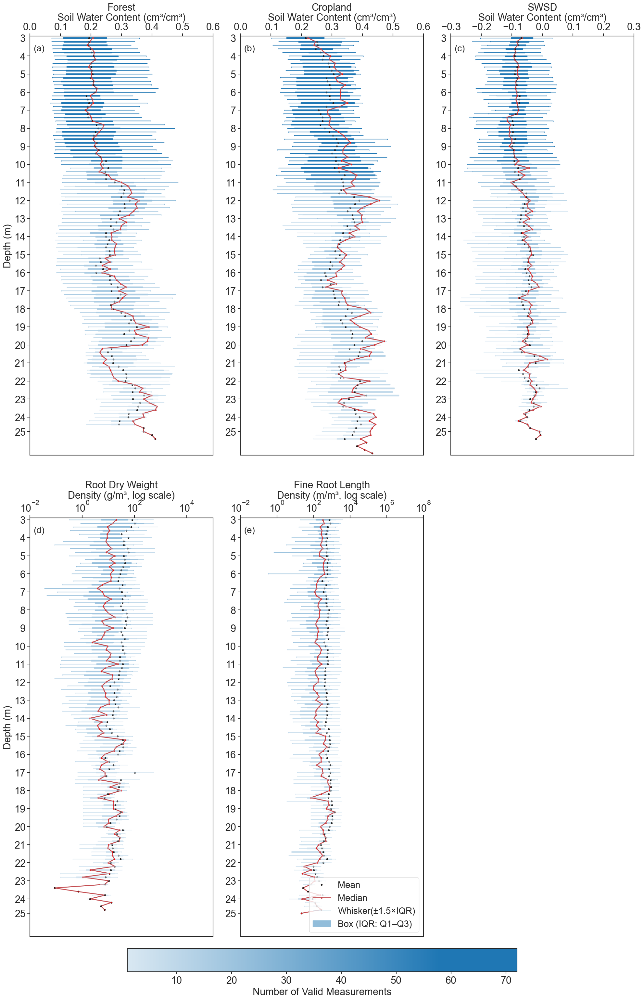

In [9]:
### 20250822以前
##对数刻度,median为线

# -*- coding: utf-8 -*-
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.lines import Line2D
from matplotlib.ticker import ScalarFormatter
from matplotlib import rcParams
import matplotlib.font_manager as fm
plt.rcParams["font.family"] = "Arial"
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
file_path = r'C:\Users\Administrator\Desktop\AFM\箱线图\water.xlsx'
sheet_names = ['forestwater(3)', 'soilwater(3)', 'SWSD(3)',
                'Root Dry Weight Density (3)','Fine Root Length Density (3)']
titles = ['Forest', 'Cropland', 'SWSD', 'Root Dry Weight', 'Fine Root Length']

def create_monochrome_colormap(color_rgb, n=256, gamma=1.0):
    colors = []
    for i in np.linspace(0, 1, n):
        factor = i ** gamma
        r = (1 - factor) * 1.0 + factor * color_rgb[0]
        g = (1 - factor) * 1.0 + factor * color_rgb[1]
        b = (1 - factor) * 1.0 + factor * color_rgb[2]
        colors.append((r, g, b))
    return LinearSegmentedColormap.from_list('mono_cmap', colors)

# 选择一种主色
main_rgb = mcolors.to_rgb("#1f77b4")  # 例如蓝色
base_cmap = create_monochrome_colormap(main_rgb, gamma=1.1)
brightness_factors = [1.0] * 5
colormap_start = 0.2
colormap_end = 1.2
cmaps = []
for factor in brightness_factors:
    colors_scaled = []
    for c in base_cmap(np.linspace(colormap_start, colormap_end, 256)):
        r, g, b = c[:3]
        r_new = min(r * factor, 1)
        g_new = min(g * factor, 1)
        b_new = min(b * factor, 1)
        colors_scaled.append((r_new, g_new, b_new))
    cmap_scaled = LinearSegmentedColormap.from_list(f'cmap_factor_{factor}', colors_scaled)
    cmaps.append(cmap_scaled)

# === Create 2x3 subplots ===
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24, 36), sharey=True)
plt.subplots_adjust(wspace=0.15, hspace=0.15)
axes = axes.flatten()

for idx, (sheet, title, cmap) in enumerate(zip(sheet_names, titles, cmaps)):
    ax = axes[idx]
    df = pd.read_excel(file_path, sheet_name=sheet, header=None)
    depths = df.iloc[0, :].astype(float).values
    data = df.iloc[1:, :].astype(float).values.T
    adjusted_depths = np.arange(len(depths))

    # === 关键修改：计算整个 sheet 的 1% 和 99% 分位数 ===
    all_data = data.flatten()
    all_data = all_data[~np.isnan(all_data)]
    p1 = np.percentile(all_data, 0.1)
    p99 = np.percentile(all_data, 99.9)
    if sheet in ['Root Dry Weight Density (3)', 'Fine Root Length Density (3)']:
        data_trimmed = np.where((data > 0) & (data <= p99), data, np.nan)
    else:
        data_trimmed=np.where((data >= p1) & (data <= p99), data, np.nan)
    means = np.nanmean(data_trimmed, axis=1)
    mins = np.nanmin(data_trimmed, axis=1)
    maxs = np.nanmax(data_trimmed, axis=1)
    valid_counts = np.sum(~np.isnan(data_trimmed), axis=1)
    norm = mcolors.Normalize(vmin=1, vmax=72)
    colors = [cmap(norm(c)) for c in valid_counts]

    box_legend = whisker_legend = cap_legend = flier_legend = None
    
    for i, (d, color) in enumerate(zip(data_trimmed, colors)):
        d_clean = d[~np.isnan(d)]
        if len(d_clean) > 0:
            # 计算 1% 和 99% 分位数范围
#            p1 = np.percentile(d_clean, 10)
#            p99 = np.percentile(d_clean, 90)
            #d_trimmed = d_clean[(d_clean >= p1) & (d_clean <= p99)]
            d_clean = d[~np.isnan(d)]
            # 绘制仅显示 1%–99% 分位范围内数据的箱线图
            bp = ax.boxplot(
                d_clean,
                positions=[adjusted_depths[i]],
                vert=False,
                widths=0.3,
                patch_artist=True,
                boxprops=dict(facecolor=color, color=color),
                medianprops=dict(color='red'),
                whiskerprops=dict(color=color),  # 不绘制 whiskers
                capprops=dict(color=color),      # 不绘制 caps
                flierprops=dict(marker=''),
                showfliers=False
            )
            if i == 0:
                box_legend = bp['boxes'][0]
                whisker_legend = bp['whiskers'][0]
                cap_legend = bp['caps'][0]
              #  flier_legend = bp['fliers'][0]

    medians = np.nanmedian(data_trimmed, axis=1)
    median_line, = ax.plot(medians, adjusted_depths, 'ro-', label='Median', linewidth=2, markersize=3)
    mean_point, = ax.plot(means, adjusted_depths, 'ko', label='Mean', markersize=3)
    for i in range(len(adjusted_depths)):
        ax.hlines(y=adjusted_depths[i], xmin=mins[i], xmax=maxs[i], color=colors[i], alpha=0.6)

    ax.set_title(title, fontsize=22)
    ax.text(0.02, 0.98, f"({chr(97+idx)})", transform=ax.transAxes,
            fontsize=20, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='none', pad=0))

    #ax.set_xlabel('Soil Water Content (cm³ cm⁻³)', fontsize=18)
    ax.tick_params(labelsize=22)
    ax.tick_params(axis='y', which='both', direction='out', length=6, width=1.2, color='black')
    ax.grid(False)
    ax.xaxis.set_label_position('top')
    ax.xaxis.tick_top()
    ax.xaxis.set_tick_params(labelsize=22)  # 字体更大
    ax.tick_params(which='both', bottom=False, top=True, left=True, right=False,
               labelbottom=False, labelleft=True, direction='out')
    formatter = ScalarFormatter(useMathText=True)
    formatter.set_scientific(True)
    formatter.set_useOffset(True)
    formatter.set_powerlimits((-2, 2))
    ax.xaxis.set_major_formatter(formatter)
    # 调整 offset text 字体大小
    ax.figure.canvas.draw()  # 必须要 draw 一次
    ax.xaxis.get_offset_text().set_fontsize(22)
    if sheet == 'forestwater(3)':
        ax.set_xlim(0, 0.6)  # 举例：森林土壤含水量范围
        ax.set_xlabel('Soil Water Content (cm³/cm³)', fontsize=22)
    elif sheet == 'soilwater(3)':
        ax.set_xlim(0, 0.6)   # 耕地土壤含水量范围
        ax.set_xlabel('Soil Water Content (cm³/cm³)', fontsize=22)
    elif sheet == 'SWSD(3)':
        ax.set_xlim(-0.3, 0.3)  # SWSD 特定范围
        ax.set_xlabel('Soil Water Content (cm³/cm³)', fontsize=22)
    elif sheet == 'Fine Root Length Density (3)':
        ax.set_xscale('log')
        ax.set_xlim(0.01, 100000000)  # 去除0或负数，设一个合理的范围
        ax.set_xlabel('Density (m/m³, log scale)', fontsize=22)
    elif sheet == 'Root Dry Weight Density (3)':
        ax.set_xscale('log')
        ax.set_xlim(0.01, 100000)  # 同样剔除小于等于0的情况
        ax.set_xlabel('Density (g/m³, log scale)', fontsize=22)

    # ✅ y轴整数标签
    integer_indices = [i for i, depth in enumerate(depths) if depth.is_integer()]
    integer_depths = [depths[i] for i in integer_indices]
    adjusted_integer_depths = [adjusted_depths[i] for i in integer_indices]

    ax.set_yticks(adjusted_integer_depths)
    ax.set_yticklabels([f"{int(d)}" for d in integer_depths], fontsize=22)

    ax_row, ax_col = divmod(idx, 3)
    if ax_col == 0:
        ax.set_ylabel('Depth (m)', fontsize=22)

    ax.invert_yaxis()

    if idx == 4:
        median_legend = Line2D([0], [0], color='black', linestyle='none', marker='s', markersize=3, label='Median')
        handles = [
            mean_point,
         #   flier_legend,
            median_line,
            whisker_legend,
            box_legend,
        ]
        labels = [
           # 'Outlier(>99% or <1%)',
            'Mean',
            'Median',
            'Whisker(±1.5×IQR)',
            'Box (IQR: Q1–Q3)',
        ]
ax.legend(handles=handles, labels=labels, loc='lower right', fontsize=20)
# 如果还有空子图（第6个），隐藏它
if len(sheet_names) < len(axes):
    for idx in range(len(sheet_names), len(axes)):
        axes[idx].axis('off')
# horizontal colorbar under plot
sm = ScalarMappable(cmap=cmaps[-1], norm=norm)
sm.set_array([])
cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Number of Valid Measurements', fontsize=22)
cbar.ax.tick_params(labelsize=22)

# save
save_path = r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\soil_water_content_5plots_fixed_medianline.png'
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()

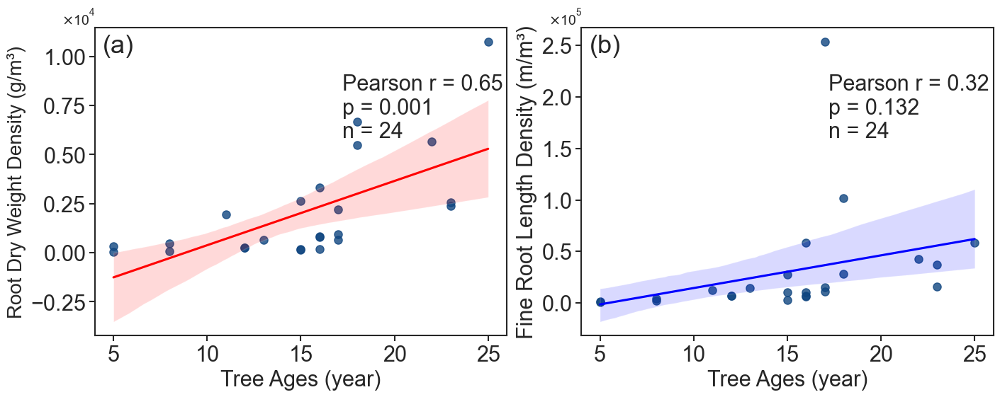

In [6]:
# ===== 1×2 回归图（替换你原来“嵌套两个回归图”的整段） =====
from matplotlib.ticker import ScalarFormatter
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
file_path = r'C:\Users\Administrator\Desktop\AFM\箱线图\water.xlsx'
# 读取回归数据
df_reg = pd.read_excel(file_path, sheet_name='RDWD with FRLD')
x  = df_reg['Tree ages']
y1 = df_reg['root dry weight density']
y2 = df_reg['Fine root length density']
# 新建 1×2 画布
fig, axes = plt.subplots(1, 2, figsize=(14, 5.5), constrained_layout=True)
ax1, ax2 = axes

sns.set(style="white")

# 左图：RDWD ~ Tree ages
sns.regplot(x=x, y=y1, ax=ax1,
            scatter_kws={'s': 65, 'color': '#104680'},
            line_kws={'color': 'red'},
            ci=95)
ax1.set_xlabel('Tree Ages (year)', fontsize=22)
ax1.set_ylabel('Root Dry Weight Density (g/m³)', fontsize=20)
ax1.tick_params(which='both', direction='out', labelsize=22)
ax1.tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# y 轴科学计数法 & 偏移文字位置
ax1.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax1.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
yoff1 = ax1.yaxis.get_offset_text()
yoff1.set_fontsize(14)
yoff1.set_x(-0.08)
yoff1.set_y(1.02)

# 右图：FRLD ~ Tree ages
sns.regplot(x=x, y=y2, ax=ax2,
            scatter_kws={'s': 65, 'color': '#104680'},
            line_kws={'color': 'blue'},
            ci=95)
ax2.set_xlabel('Tree Ages (year)', fontsize=22)
ax2.set_ylabel('Fine Root Length Density (m/m³)', fontsize=22)
ax2.tick_params(which='both', direction='out', labelsize=22)

ax2.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax2.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
ax2.tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
yoff2 = ax2.yaxis.get_offset_text()
yoff2.set_fontsize(14)
yoff2.set_x(-0.08)
yoff2.set_y(1.02)

# 角标 (a)(b)
ax1.text(0.02, 0.98, '(a)', transform=ax1.transAxes, va='top', ha='left',
         fontsize=26, fontname='Arial')
ax2.text(0.02, 0.98, '(b)', transform=ax2.transAxes, va='top', ha='left',
         fontsize=26, fontname='Arial')

# 统计信息：Pearson r、p、n
def add_stats(ax, x, y):
    r_value, p_value = stats.pearsonr(x, y)
    n = len(x)
    ax.annotate(f'Pearson r = {r_value:.2f}\np = {p_value:.3f}\nn = {n}',
                xy=(0.60, 0.85), xycoords='axes fraction',
                fontsize=22, va='top')

add_stats(ax1, x, y1)
add_stats(ax2, x, y2)

# 如需导出：
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\reg_1x2_panel__withAnomaly Point.png', dpi=300, bbox_inches='tight')
# plt.savefig('reg_1x2_panel.tif', dpi=300, bbox_inches='tight')

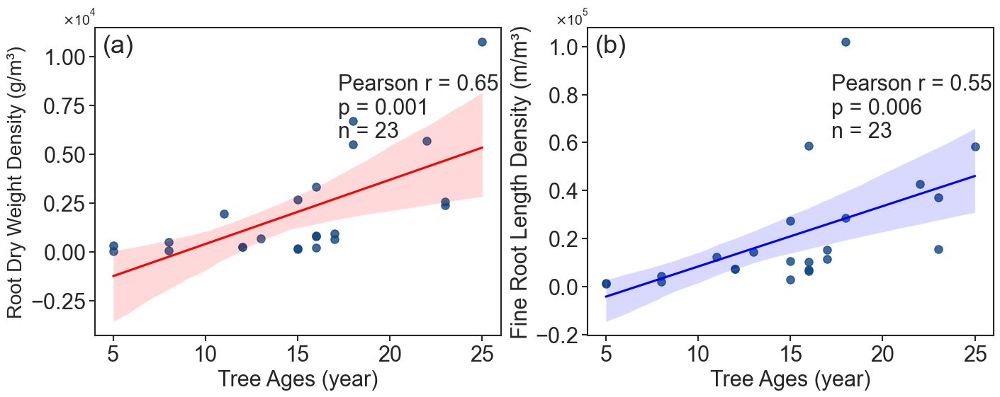

In [7]:
# ===== 1×2 回归图（替换你原来“嵌套两个回归图”的整段） =====
from matplotlib.ticker import ScalarFormatter
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
plt.rcParams["font.family"] = "Arial"
plt.rcParams["font.size"] = 20
plt.rcParams["axes.titlesize"] = 24
plt.rcParams["axes.labelsize"] = 24
plt.rcParams["xtick.labelsize"] = 24
plt.rcParams["ytick.labelsize"] = 24
plt.rcParams["legend.fontsize"] = 20
plt.rcParams["axes.linewidth"] = 1.5      # 轴框线宽
plt.rcParams["xtick.major.width"] = 1.5   # 主刻度线宽
plt.rcParams["ytick.major.width"] = 1.5
file_path = r'C:\Users\Administrator\Desktop\AFM\箱线图\water.xlsx'
# 读取回归数据
df_reg = pd.read_excel(file_path, sheet_name='RDWD with FRLD (2)')
x  = df_reg['Tree ages']
y1 = df_reg['root dry weight density']
y2 = df_reg['Fine root length density']
# 新建 1×2 画布
fig, axes = plt.subplots(1, 2, figsize=(14, 5.5), constrained_layout=True)
ax1, ax2 = axes

sns.set(style="white")

# 左图：RDWD ~ Tree ages
sns.regplot(x=x, y=y1, ax=ax1,
            scatter_kws={'s': 65, 'color': '#104680'},
            line_kws={'color': 'red'},
            ci=95)
ax1.set_xlabel('Tree Ages (year)', fontsize=22)
ax1.set_ylabel('Root Dry Weight Density (g/m³)', fontsize=20)
ax1.tick_params(which='both', direction='out', labelsize=22)
ax1.tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
# y 轴科学计数法 & 偏移文字位置
ax1.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax1.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
yoff1 = ax1.yaxis.get_offset_text()
yoff1.set_fontsize(14)
yoff1.set_x(-0.08)
yoff1.set_y(1.02)

# 右图：FRLD ~ Tree ages
sns.regplot(x=x, y=y2, ax=ax2,
            scatter_kws={'s': 65, 'color': '#104680'},
            line_kws={'color': 'blue'},
            ci=95)
ax2.set_xlabel('Tree Ages (year)', fontsize=22)
ax2.set_ylabel('Fine Root Length Density (m/m³)', fontsize=22)
ax2.tick_params(which='both', direction='out', labelsize=22)

ax2.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax2.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))
ax2.tick_params(which='both', bottom=True, top=False, left=True, right=False,
               labelbottom=True, labelleft=True, direction='out')
yoff2 = ax2.yaxis.get_offset_text()
yoff2.set_fontsize(14)
yoff2.set_x(-0.08)
yoff2.set_y(1.02)

# 角标 (a)(b)
ax1.text(0.02, 0.98, '(a)', transform=ax1.transAxes, va='top', ha='left',
         fontsize=26, fontname='Arial')
ax2.text(0.02, 0.98, '(b)', transform=ax2.transAxes, va='top', ha='left',
         fontsize=26, fontname='Arial')

# 统计信息：Pearson r、p、n
def add_stats(ax, x, y):
    r_value, p_value = stats.pearsonr(x, y)
    n = len(x)
    ax.annotate(f'Pearson r = {r_value:.2f}\np = {p_value:.3f}\nn = {n}',
                xy=(0.60, 0.85), xycoords='axes fraction',
                fontsize=22, va='top')

add_stats(ax1, x, y1)
add_stats(ax2, x, y2)

# 如需导出：
plt.savefig(r'C:\Users\Administrator\Desktop\AFM\photo_maxdepth5_withoutlatlon\reg_1x2_panel__withoutAnomaly Point.png', dpi=300, bbox_inches='tight')
# plt.savefig('reg_1x2_panel.tif', dpi=300, bbox_inches='tight')